In [1]:
from general_tools.notebook.gpu_utils import setup_one_gpu
GPU = 3
setup_one_gpu(GPU)

Picking GPU 3


In [2]:
import sys
import time
import numpy as np
import os.path as osp
import tensorflow as tf
import matplotlib.pyplot as plt

from general_tools.notebook.tf import reset_tf_graph

import tf_lab.point_clouds.in_out as pio
from tf_lab.point_clouds.in_out import PointCloudDataSet, write_model_ids_of_datasets

from tf_lab.point_clouds.point_net_ae import PointNetAutoEncoder
from tf_lab.point_clouds.autoencoder import Configuration as Conf
import tf_lab.point_clouds.encoders_decoders as enc_dec

from tf_lab.autopredictors.scripts.helper import shape_net_category_to_synth_id

from tf_lab.autopredictors.plotting import plot_original_pclouds_vs_reconstructed, \
                                           plot_train_val_test_curves, plot_reconstructions_at_epoch

from tf_lab.autopredictors.evaluate import eval_model, read_saved_epochs

from tf_lab.autopredictors.exploration import latent_embedding_of_entire_dataset
                                                  
from general_tools.in_out.basics import create_dir, delete_files_in_directory, files_in_subdirs
from general_tools.simpletons import select_first_last_and_k

from geo_tool import Point_Cloud

from tf_lab.nips.data_sets.shape_net import pc_loader as sn_pc_loader
from tf_lab.point_clouds.raw_gan import RawGAN
from tf_lab.point_clouds.raw_gan_gp import RawGAN_GP
from tf_lab.point_clouds.latent_gan import LatentGAN
from tf_lab.point_clouds.point_net_ae import PointNetAutoEncoder


from tf_lab.nips.evaluate_gan import entropy_of_occupancy_grid, jensen_shannon_divergence, \
                                     sample_pclouds_distances

from tf_lab.point_clouds.gan import model_saver_id

from tf_lab.autopredictors.exploration import find_neighbors

from tf_lab.nips.helper import pclouds_centered_and_half_sphere

from tf_lab.point_clouds.generators_discriminators import latent_code_discriminator_two_layers, latent_code_generator_two_layers    

from tf_lab.icml.ae_farm_helper import relevant_class

In [3]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [4]:
n_pc_samples = 2048
do_training = True
do_plotting = True
ae_loss = 'emd'

save_synthetic_samples = True
save_model = True
saver_step = 10

class_name = raw_input('Give me the class type: ').lower()
ae_id = raw_input('Give me the AE/experiment ID: ').lower()
cmp_type = raw_input('Comparison Type ("best" epoch vs. "max_min" epoch): ').lower()

syn_id = shape_net_category_to_synth_id()[class_name]

experiment_name = '_'.join(['nb_wgan_gp_ae', ae_id, ae_loss, class_name, str(n_pc_samples), cmp_type, 'epoch'])

top_data_dir = '/orions4-zfs/projects/lins2/Panos_Space/DATA/'
synthetic_data_out_dir = '/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/synthetic_point_clouds'

train_dir = osp.join(top_data_dir, 'OUT/icml/nn_models/gan/nb_gan')
train_dir = osp.join(train_dir, experiment_name)
create_dir(train_dir);

Give me the class type: chair
Give me the AE/experiment ID: 11
Comparison Type ("best" epoch vs. "max_min" epoch): best


In [5]:
# Load Raw Point-Clouds of class
pclouds_path = osp.join(top_data_dir, 'Point_Clouds/Shape_Net/Core/from_manifold_meshes/centered/', str(n_pc_samples))
pclouds_path = osp.join(pclouds_path, syn_id)
file_names = pio.load_filenames_of_input_data(pclouds_path, '.ply')
pclouds, model_ids, syn_ids = pio.load_crude_point_clouds(file_names=file_names, n_threads=50, loader=sn_pc_loader)
print '%d files containing complete point clouds were found.' % (len(pclouds), )

6778 files containing complete point clouds were found.


In [6]:
ae_help = relevant_class(ae_loss)

In [7]:
# Load Auto-Encoder
ae_net_name = 'ae_farm_' + class_name + '_conv_arch_' + ae_id + '_2048pts_' + ae_loss
ae_net_dir = osp.join(top_data_dir, 'OUT/icml/nn_models/ae_farming', ae_net_name)
ae_conf = Conf.load(osp.join(ae_net_dir, 'configuration'))
reset_tf_graph()
ae = PointNetAutoEncoder(ae_net_name, ae_conf)
bneck = ae.bottleneck_size
assert(ae_help.experiment_id_to_bneck[int(ae_id)] == bneck) 

if cmp_type.startswith('best'):
    load_epoch, _ = ae_help.best_epochs[bneck]
    print load_epoch
elif cmp_type.startswith('max'):
    load_epoch, _ = ae_help.max_min_epochs[bneck]
else:
    assert(False)
    saved_epochs = read_saved_epochs(ae_conf.train_dir)
    load_epoch = saved_epochs[-1]

ae.restore_model(ae_conf.train_dir, load_epoch, verbose=True)

940
Model restored in epoch 940.


In [8]:
# Convert raw-data to latent codes.
raw_data = PointCloudDataSet(pclouds, init_shuffle=False)
_, latent_codes, _ = latent_embedding_of_entire_dataset(raw_data, ae, ae_conf)
training_data = PointCloudDataSet(latent_codes)

In [17]:
# reconstructed = ae.decode(latent_codes)
# save_dir = osp.join(top_data_dir, 'OUT/icml/ae_reconstructed_point_clouds')
# create_dir(save_dir)
# save_file = osp.join(save_dir, 'ae_' + ae_id + '_2048pts_' + ae_loss + '_' + cmp_type)
# np.savez(save_file, reconstructed)

In [9]:
# TODO : make GAN conf.
init_lr = 0.0001
batch_size = 50

noise_params = {'mu':0, 'sigma': 0.5}
noise_dim = ae.bottleneck_size
max_epochs = 1500

n_syn_samples = training_data.num_examples  # Same number as original GT data.
n_out = [ae.bottleneck_size]

lam = 10
beta = 0.5
disc_kwargs = {'b_norm': False}
reset_tf_graph()
gan = RawGAN_GP(experiment_name, init_lr, lam, n_out, noise_dim,\
                latent_code_discriminator_two_layers, latent_code_generator_two_layers,\
                beta=beta, disc_kwargs=disc_kwargs)


1 (0.0072208439862286606, 0.16890757296372344)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1 is not in all_model_checkpoint_paths. Manually adding it.


/usr/lib/pymodules/python2.7/matplotlib/collections.py:548: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == 'face':


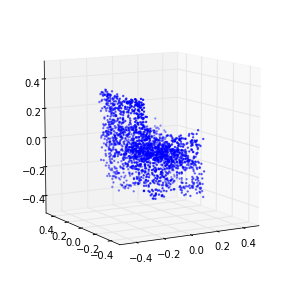

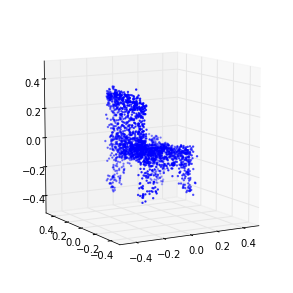

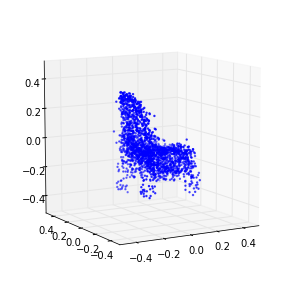

2 (-1.010237212534304, -0.25983965700423278)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-2 is not in all_model_checkpoint_paths. Manually adding it.


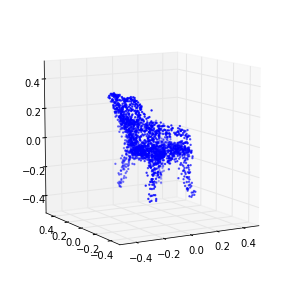

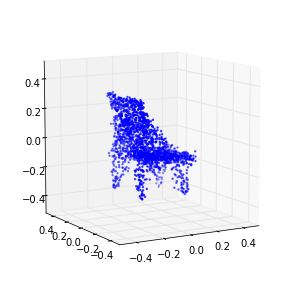

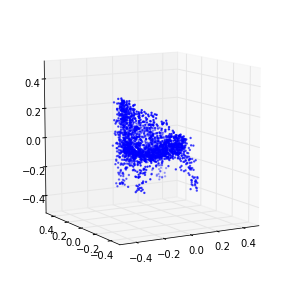

3 (-0.9472320945174606, -0.41682331650345411)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-3 is not in all_model_checkpoint_paths. Manually adding it.


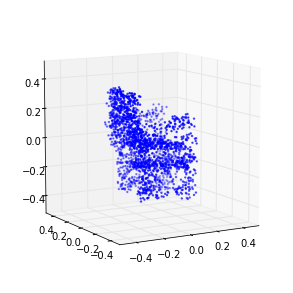

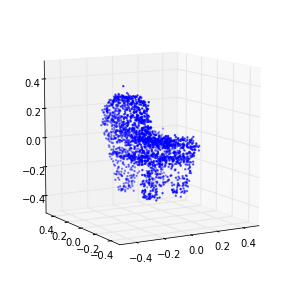

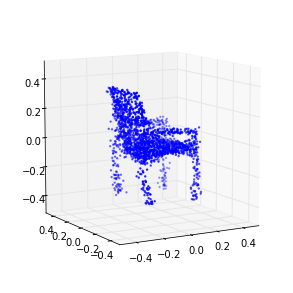

4 (-0.85626195713325781, -0.34435289380726991)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-4 is not in all_model_checkpoint_paths. Manually adding it.


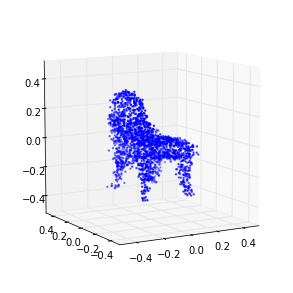

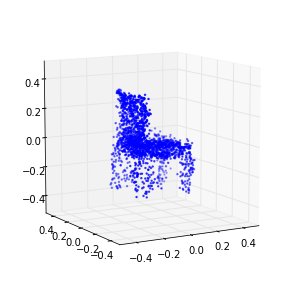

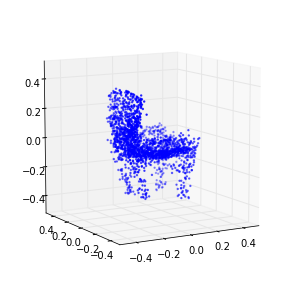

5 (-0.79442292981677587, -0.15468208105475814)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-5 is not in all_model_checkpoint_paths. Manually adding it.


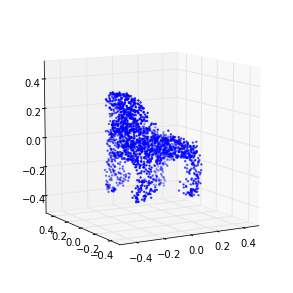

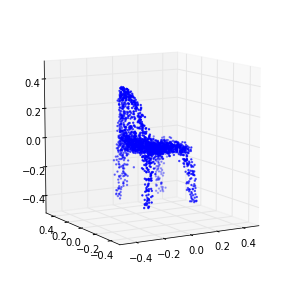

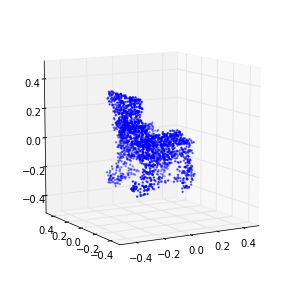

6 (-0.77169729824419375, 0.0060295193904527913)
7 (-0.75940061233661793, 0.071366281645303523)
8 (-0.75263457872249462, 0.083235274931346928)
9 (-0.74067269563674931, 0.093252429393706496)
10 (-0.72719763782289293, 0.065471362201841896)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-10 is not in all_model_checkpoint_paths. Manually adding it.


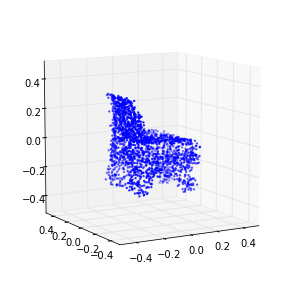

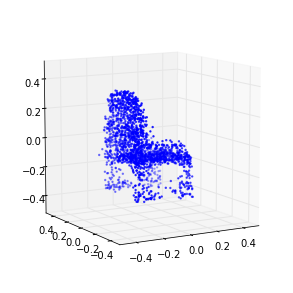

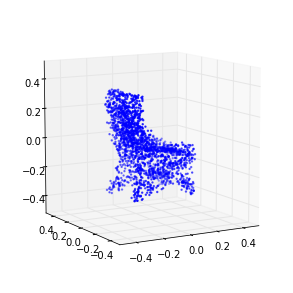

11 (-0.71006293826633027, 0.052012041694036233)
12 (-0.68052576073893789, 0.010667060122445778)
13 (-0.66324854117852672, 0.0060001648962497711)
14 (-0.62885962459776135, 0.0031039495262558813)
15 (-0.60326306466703061, -0.015934173759348965)
16 (-0.57496069404813976, 0.0069699444704585606)
17 (-0.5448621736632453, -0.016600901778373454)
18 (-0.52148534964632109, 0.012017875823571725)
19 (-0.48897452707643863, -0.01332879383806829)
20 (-0.46532196270094978, -0.027168394721768522)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-20 is not in all_model_checkpoint_paths. Manually adding it.


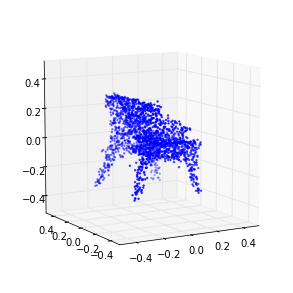

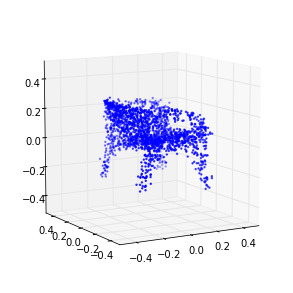

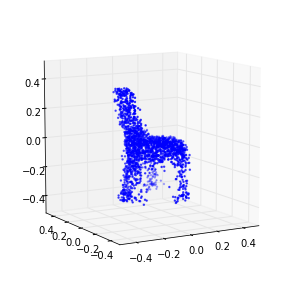

21 (-0.44479963514539933, -0.04326332491581087)
22 (-0.41988168689939709, -0.023206799032373562)
23 (-0.40063850327774331, 0.0033859162832851762)
24 (-0.38293935281259045, -0.035150661210839949)
25 (-0.36959513050538523, -0.0057061276295118863)
26 (-0.3482403216538606, 0.024043224889923026)
27 (-0.3399797123891336, 0.010714062800010046)
28 (-0.3321629387361032, 0.016192260543229402)
29 (-0.32178272362108584, 0.0024436095694976823)
30 (-0.31417130585070008, 0.017456698334879346)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-30 is not in all_model_checkpoint_paths. Manually adding it.


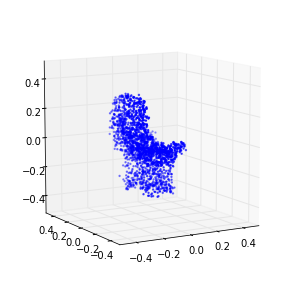

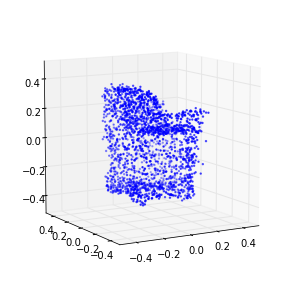

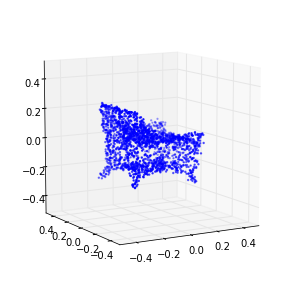

31 (-0.30676318727157736, 0.0031365649904020959)
32 (-0.30320616331365374, 0.03236290874580542)
33 (-0.2996684632919453, -0.0090515077010624931)
34 (-0.29702258154197975, -0.034040326804474545)
35 (-0.29681981161788656, 0.014475100880695714)
36 (-0.29184156667303157, -0.020019172449354774)
37 (-0.29111802566934514, -0.051318104292645501)
38 (-0.28713357073289375, -0.028203582149688846)
39 (-0.28326783776283265, -0.034740039733824904)
40 (-0.27903578899524828, -0.061690365516201211)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-40 is not in all_model_checkpoint_paths. Manually adding it.


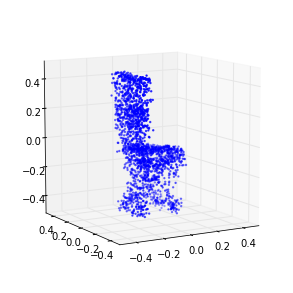

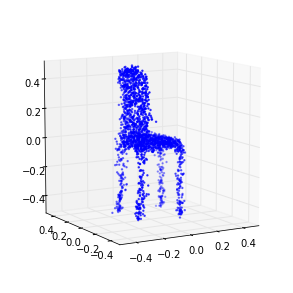

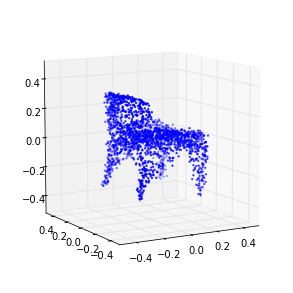

41 (-0.27345999335801158, -0.064986728373225083)
42 (-0.26754974303422152, -0.073536468221357579)
43 (-0.26926439283070741, -0.061487936207817659)
44 (-0.26666523383723367, -0.060357539983535255)
45 (-0.26299527309559012, -0.088417828255505468)
46 (-0.26065540313720703, -0.10207267733359779)
47 (-0.25457103716002571, -0.093660183285397505)
48 (-0.25339551137553323, -0.079603463454447965)
49 (-0.24946501475793345, -0.10987445553419767)
50 (-0.24958588436797813, -0.06155676729287262)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-50 is not in all_model_checkpoint_paths. Manually adding it.


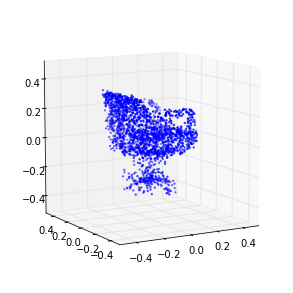

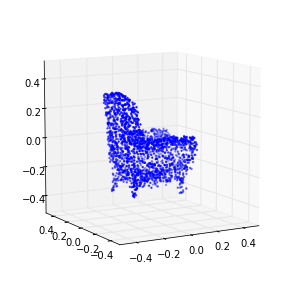

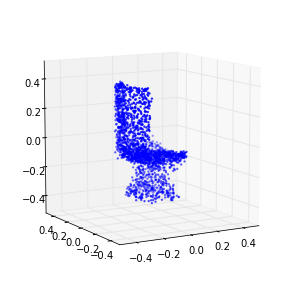

51 (-0.24261505305767059, -0.11134586731592815)
52 (-0.2420602818330129, -0.081158827300424924)
53 (-0.23771479372624998, -0.090472566584746048)
54 (-0.23557137791757229, -0.074118434037599296)
55 (-0.23897405266761779, -0.10591059633427197)
56 (-0.23447547091378107, -0.082871758723976438)
57 (-0.22723258347422989, -0.092591623913634707)
58 (-0.22856309016545615, -0.079158701692466388)
59 (-0.22572068174680074, -0.080034227093198781)
60 (-0.22467451824082268, -0.085885668345899488)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-60 is not in all_model_checkpoint_paths. Manually adding it.


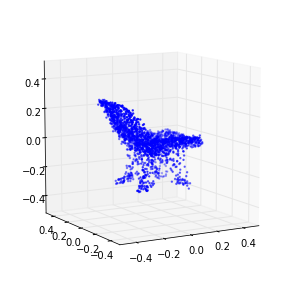

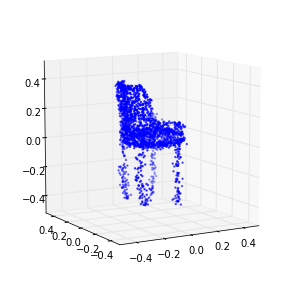

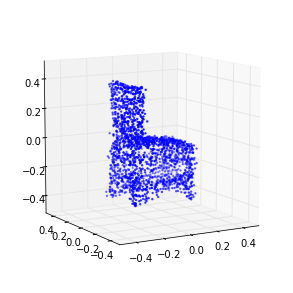

61 (-0.22600425040280378, -0.083708207847343549)
62 (-0.2254355705446667, -0.078010380423317358)
63 (-0.22045402096377478, -0.091828601538307131)
64 (-0.22013567056920794, -0.067234192509204149)
65 (-0.21859227628619582, -0.070962138439494157)
66 (-0.21948532627688513, -0.13080551144149569)
67 (-0.21650245829864784, -0.045465496334212797)
68 (-0.21499628248038116, -0.12897111309899223)
69 (-0.21922206470259914, -0.10090928062520645)
70 (-0.21405923603861421, -0.091269393072084148)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-70 is not in all_model_checkpoint_paths. Manually adding it.


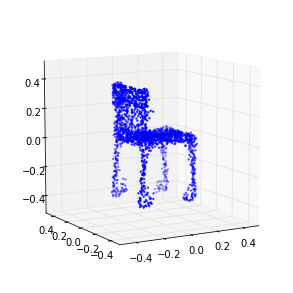

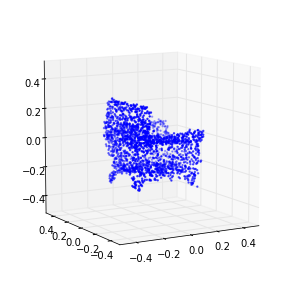

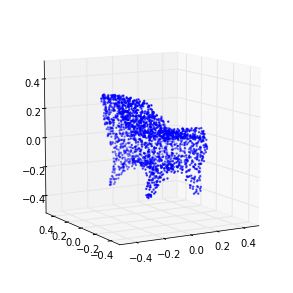

71 (-0.21488557358582813, -0.086006014297405883)
72 (-0.2142935875389311, -0.088722820083300277)
73 (-0.21069550249311658, -0.091276791912538027)
74 (-0.21175334332165896, -0.097146351442292889)
75 (-0.21016740291206926, -0.0939239260085203)
76 (-0.21293788773042185, -0.10049144882294866)
77 (-0.20886658761236404, -0.10158498369640222)
78 (-0.20846123927169377, -0.13799811237388188)
79 (-0.20890296631389194, -0.076214062688113357)
80 (-0.20892454617553288, -0.12692332405734946)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-80 is not in all_model_checkpoint_paths. Manually adding it.


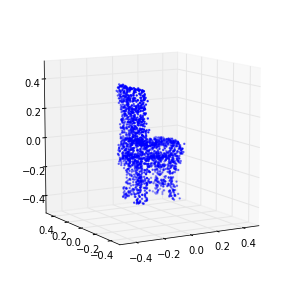

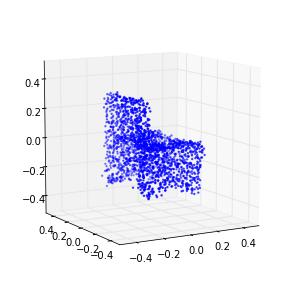

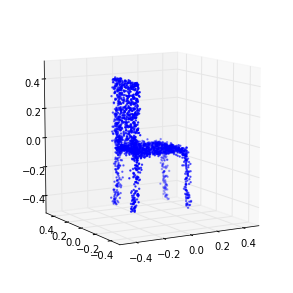

81 (-0.21077233806804374, -0.10419121622625324)
82 (-0.2081727902646418, -0.11084634396764967)
83 (-0.20945248145748069, -0.1368164133142542)
84 (-0.20476695718588653, -0.1116954681498033)
85 (-0.20771846329724347, -0.13157256057968847)
86 (-0.20552896923489042, -0.1181396124539552)
87 (-0.20722928422468681, -0.13014096780507653)
88 (-0.20414778408077028, -0.16118370962363701)
89 (-0.2071862538103704, -0.1307302580939399)
90 (-0.20566431294988702, -0.15926559352212483)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-90 is not in all_model_checkpoint_paths. Manually adding it.


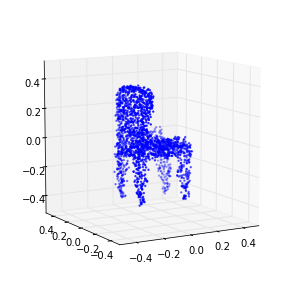

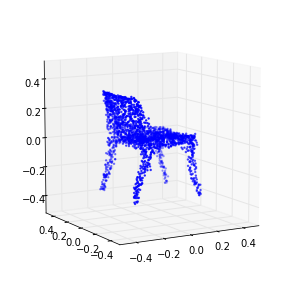

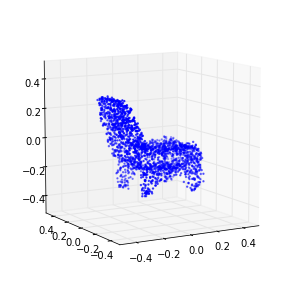

91 (-0.20399068075197715, -0.13789106629512929)
92 (-0.20406911472479503, -0.12852013456048789)
93 (-0.20334469543562994, -0.16743381073077521)
94 (-0.20344632554937292, -0.12756535783410072)
95 (-0.20067600994198412, -0.16172796818945143)
96 (-0.20003961148085417, -0.15210361309625484)
97 (-0.20190217975113128, -0.14047554811393773)
98 (-0.201032756710494, -0.14734719472902794)
99 (-0.20014047777211225, -0.15214423062624755)
100 (-0.2019420654685409, -0.14792973023873787)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-100 is not in all_model_checkpoint_paths. Manually adding it.


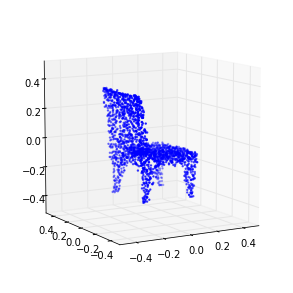

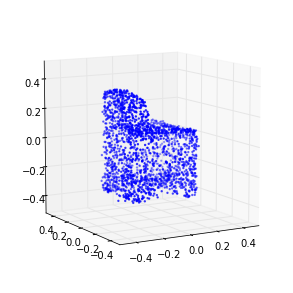

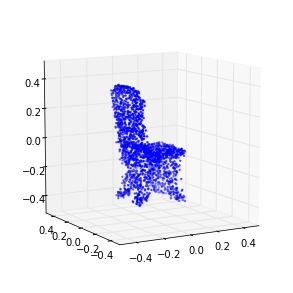

101 (-0.2000029190822884, -0.1629053908917639)
102 (-0.19954756619753661, -0.13598656723344768)
103 (-0.19750447505050236, -0.14988478852642906)
104 (-0.1978120783412898, -0.17127101192319835)
105 (-0.19823617300501575, -0.14490861487057474)
106 (-0.20229995350042979, -0.16839930663506189)
107 (-0.20055575944759227, -0.13246284846078465)
108 (-0.19800308435051531, -0.16202468425035477)
109 (-0.19792054825358921, -0.14990579681815924)
110 (-0.19936913903112766, -0.15642110092772377)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-110 is not in all_model_checkpoint_paths. Manually adding it.


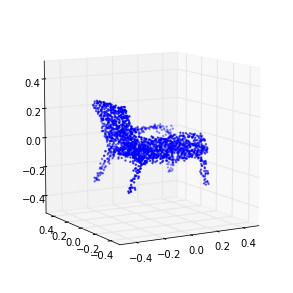

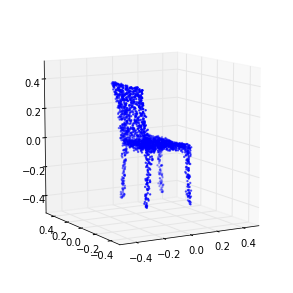

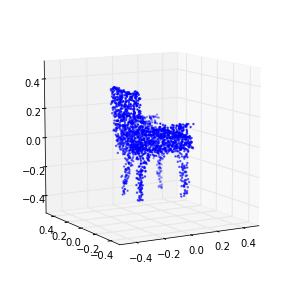

111 (-0.1989543581450427, -0.13960012076077638)
112 (-0.19672084748744964, -0.16519770384938628)
113 (-0.19628942261139551, -0.16032592814277719)
114 (-0.19520911806159549, -0.15409404094572421)
115 (-0.19568531242785631, -0.15085778606158715)
116 (-0.1976277611321873, -0.17546202463132363)
117 (-0.19442875600523418, -0.15514770288158347)
118 (-0.19581029475839049, -0.16272032730005406)
119 (-0.19647542127856502, -0.16851407758615636)
120 (-0.19732340971628826, -0.16442504552779375)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-120 is not in all_model_checkpoint_paths. Manually adding it.


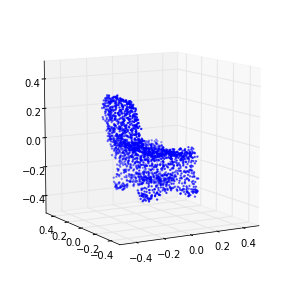

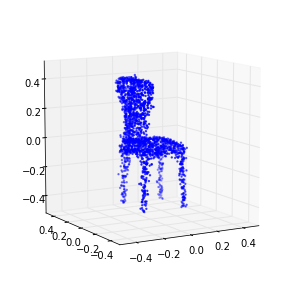

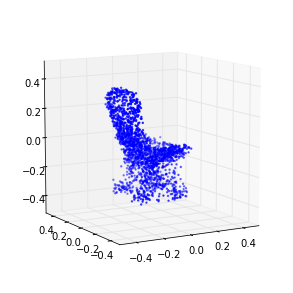

121 (-0.1969554994393278, -0.15927045626772773)
122 (-0.19349021757090534, -0.15597168687317106)
123 (-0.19242588105025116, -0.16174459871318606)
124 (-0.19584694261904115, -0.1579672994988936)
125 (-0.19362027021469894, -0.17767250703440773)
126 (-0.19546988783059296, -0.1696944796928653)
127 (-0.19529945756550188, -0.14017294843991598)
128 (-0.19269511390615393, -0.18259743711462728)
129 (-0.19380953549234956, -0.17590017478775094)
130 (-0.19415509292372951, -0.14879240454347045)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-130 is not in all_model_checkpoint_paths. Manually adding it.


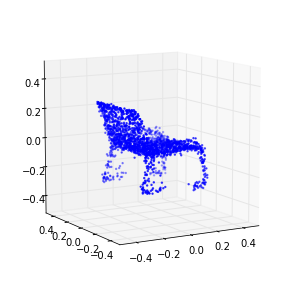

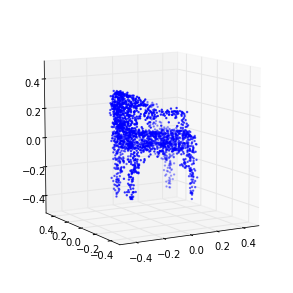

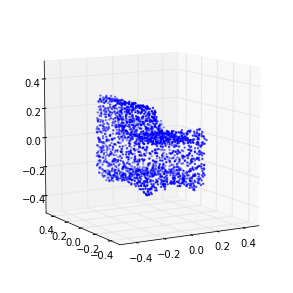

131 (-0.19729541782979612, -0.16707337537297495)
132 (-0.18973868859034998, -0.16207118553143959)
133 (-0.19189644527656061, -0.16482891859831633)
134 (-0.19071945172769053, -0.17233675718307495)
135 (-0.19034149238356837, -0.18258844150437248)
136 (-0.18970711021511644, -0.16184087870297609)
137 (-0.1880163566933738, -0.15823530212596612)
138 (-0.19260749027684884, -0.1741400115467884)
139 (-0.19074211286173925, -0.17313112732436922)
140 (-0.19091341771461345, -0.19376190613817285)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-140 is not in all_model_checkpoint_paths. Manually adding it.


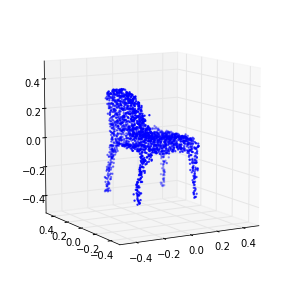

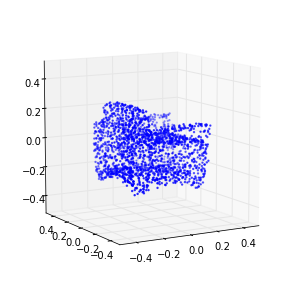

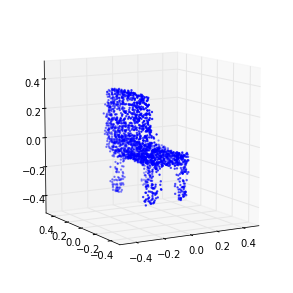

141 (-0.19001127972646994, -0.17351751802144227)
142 (-0.19175776331513017, -0.17527623695355873)
143 (-0.19239161643717023, -0.16772224009037018)
144 (-0.18674741530859912, -0.15235804435279635)
145 (-0.189767142854355, -0.16114586095015207)
146 (-0.18954946636049835, -0.143582948104099)
147 (-0.18774989164537853, -0.18366435887636962)
148 (-0.19036213054701134, -0.14235935056651081)
149 (-0.18790839700787157, -0.1593965976326554)
150 (-0.18880785317332657, -0.14681771673538066)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-150 is not in all_model_checkpoint_paths. Manually adding it.


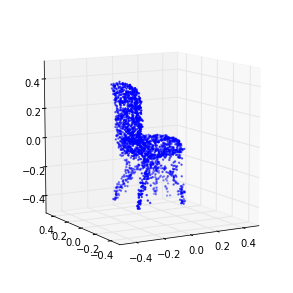

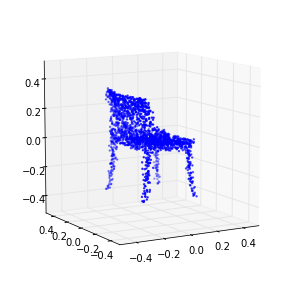

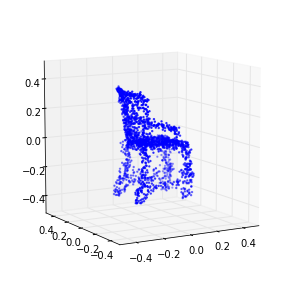

151 (-0.18824410085324889, -0.17417985780371559)
152 (-0.18660741211087614, -0.1485241828141389)
153 (-0.18709345664139146, -0.17282686354937377)
154 (-0.18877620868108891, -0.1653459025201974)
155 (-0.18769504041583449, -0.17089910860414859)
156 (-0.18716031997292129, -0.18588423397805956)
157 (-0.1893635309404797, -0.16034097886747783)
158 (-0.18728467684101174, -0.17078277551465565)
159 (-0.1862833058944455, -0.18864171703656515)
160 (-0.18881422021874675, -0.14908788022067812)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-160 is not in all_model_checkpoint_paths. Manually adding it.


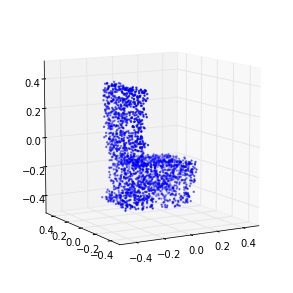

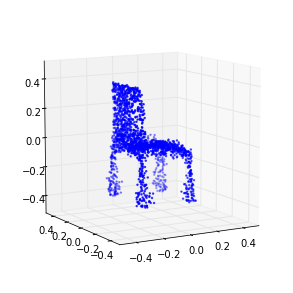

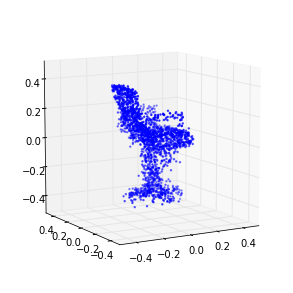

161 (-0.18703122155533897, -0.18186005591242402)
162 (-0.1828278777775941, -0.17060709330770704)
163 (-0.18626304528227558, -0.17535667342168312)
164 (-0.18464504226490303, -0.17219906465874779)
165 (-0.18305588105210552, -0.17904744490429206)
166 (-0.18285752761143226, -0.18291364389437217)
167 (-0.18427521073155934, -0.17989332615225403)
168 (-0.18693288664023081, -0.17386236676463374)
169 (-0.18476704204524005, -0.18496903777122498)
170 (-0.18608101976138575, -0.17215792117295442)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-170 is not in all_model_checkpoint_paths. Manually adding it.


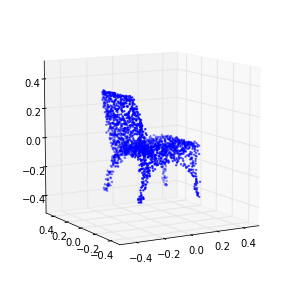

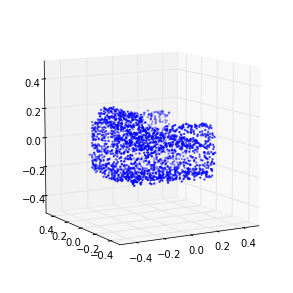

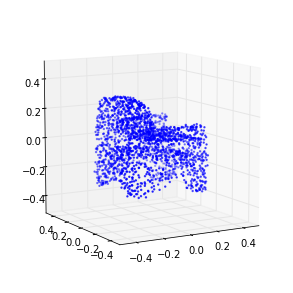

171 (-0.18432894989296242, -0.14956526458263397)
172 (-0.18706188196385348, -0.16391563084390429)
173 (-0.18630050177927371, -0.16741612719164956)
174 (-0.18428057205897791, -0.16666563765870201)
175 (-0.18443781225769609, -0.16548212424472528)
176 (-0.18405623154507744, -0.17102046531659584)
177 (-0.18494922794677593, -0.16815597398413551)
178 (-0.18297161366100664, -0.16084325396352345)
179 (-0.18402383934568475, -0.16666672406373201)
180 (-0.18256796780559753, -0.18387278031419824)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-180 is not in all_model_checkpoint_paths. Manually adding it.


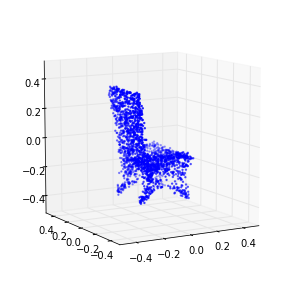

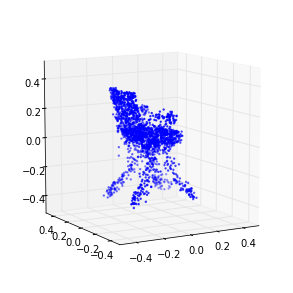

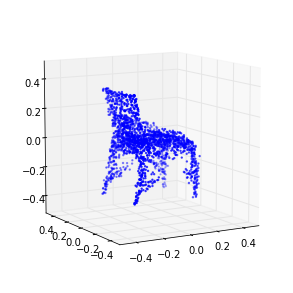

181 (-0.18352498886761842, -0.19026344021161398)
182 (-0.18466897628925466, -0.16085738274786207)
183 (-0.18199538389841716, -0.17767100588039117)
184 (-0.18239309638738632, -0.1589183583855629)
185 (-0.18259487494274421, -0.17819721030968208)
186 (-0.18216514074140125, -0.18022590102972808)
187 (-0.18147779090536964, -0.16900011814302868)
188 (-0.18123702594527491, -0.18580309936293848)
189 (-0.18114514036311044, -0.17815759833212252)
190 (-0.18042605392358921, -0.1635933733648724)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-190 is not in all_model_checkpoint_paths. Manually adding it.


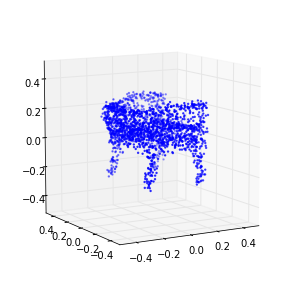

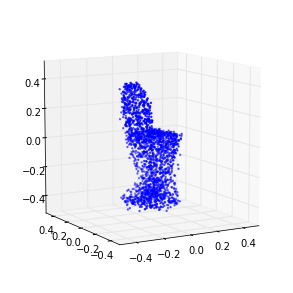

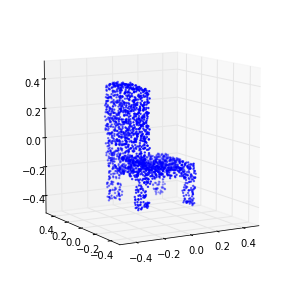

191 (-0.18088860638715604, -0.17514556425589103)
192 (-0.18125360492202972, -0.16608375945576914)
193 (-0.17916222418899888, -0.17043330327228265)
194 (-0.18271987675516693, -0.16552708077209968)
195 (-0.17520402570565541, -0.16310547982101087)
196 (-0.17853862168612303, -0.16484921784312637)
197 (-0.1798128886907189, -0.18146800498167673)
198 (-0.17933806098169749, -0.13999538675502496)
199 (-0.17841980611836469, -0.16295562215425349)
200 (-0.17980158538730057, -0.1606600910977081)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-200 is not in all_model_checkpoint_paths. Manually adding it.


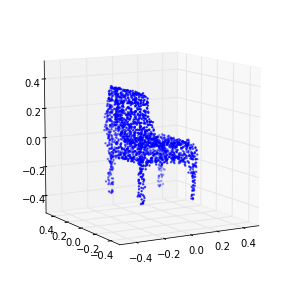

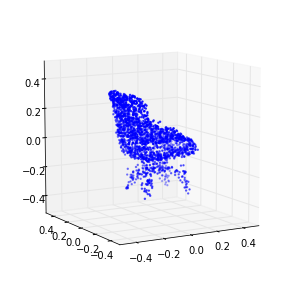

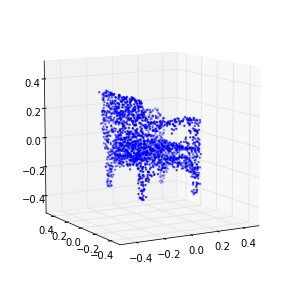

201 (-0.18111951141445726, -0.14783282302044057)
202 (-0.17763520021129536, -0.1551264908026766)
203 (-0.17908074894437084, -0.15826351637089695)
204 (-0.18373967077996994, -0.1598173647567078)
205 (-0.17547110352251266, -0.16103784077697331)
206 (-0.17755737166713786, -0.14520178762850938)
207 (-0.17757751014497544, -0.15716547546563325)
208 (-0.17747791762705203, -0.1674492135643959)
209 (-0.17776770475837919, -0.15866106031117616)
210 (-0.17527069957168015, -0.15264676042177058)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-210 is not in all_model_checkpoint_paths. Manually adding it.


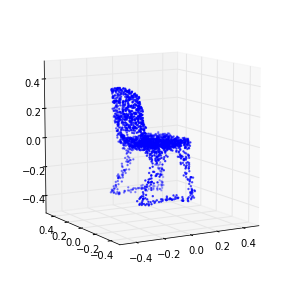

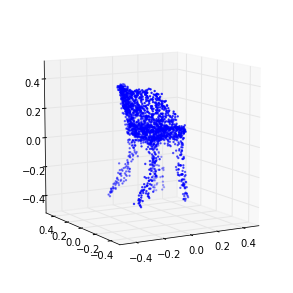

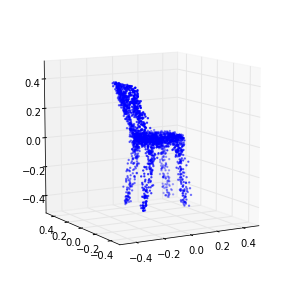

211 (-0.17761751882455967, -0.170303111826932)
212 (-0.1759371014104949, -0.17188091631288882)
213 (-0.1795761192838351, -0.15173729481520476)
214 (-0.17790556699037552, -0.14881138393172511)
215 (-0.17576772857595374, -0.15483551306857002)
216 (-0.17738024592399598, -0.16195300524985348)
217 (-0.1789726064161018, -0.14614245433498313)
218 (-0.17654717238964857, -0.15651239785883161)
219 (-0.1760029317052276, -0.1422283516989814)
220 (-0.1779721408530518, -0.16728007213936913)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-220 is not in all_model_checkpoint_paths. Manually adding it.


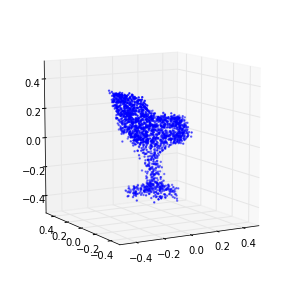

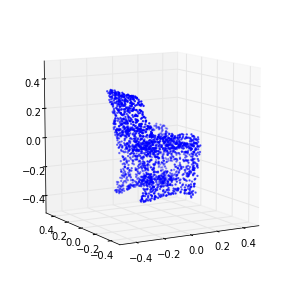

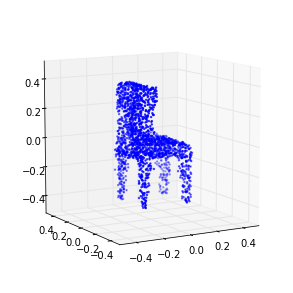

221 (-0.17542022974402816, -0.15453524197693225)
222 (-0.17473246709064202, -0.15575927164819506)
223 (-0.17674256347947651, -0.15260125945011774)
224 (-0.17595789758143601, -0.13917065494590336)
225 (-0.17569192333353889, -0.15532337239495031)
226 (-0.18015889012151295, -0.14820413539807001)
227 (-0.17474246725991921, -0.15900783130416163)
228 (-0.17684105579499845, -0.15444588661193848)
229 (-0.17202568964825737, -0.14684971311578043)
230 (-0.17524617192921815, -0.14295738245602008)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-230 is not in all_model_checkpoint_paths. Manually adding it.


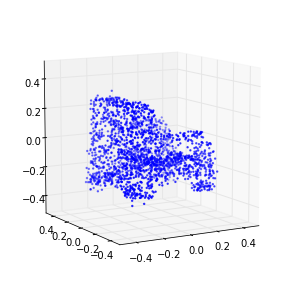

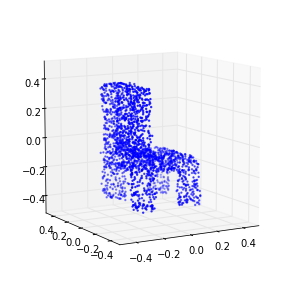

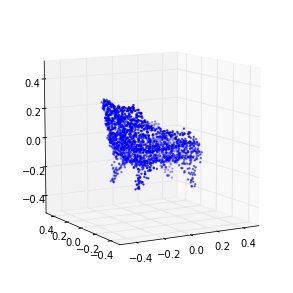

231 (-0.17452504701084562, -0.15972738575052331)
232 (-0.17734835169933461, -0.14399113644052436)
233 (-0.17445840267119583, -0.16387979382718051)
234 (-0.17245743302283464, -0.1274554776372733)
235 (-0.17595094872845543, -0.15140715462190132)
236 (-0.17422433683165797, -0.16571771988162287)
237 (-0.17174585649260768, -0.14166599208558048)
238 (-0.17634737458493974, -0.15319857166873085)
239 (-0.17565420639735682, -0.13592796110444599)
240 (-0.1743588904539744, -0.14693083255379288)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-240 is not in all_model_checkpoint_paths. Manually adding it.


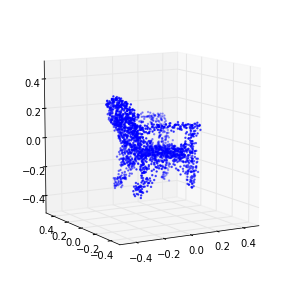

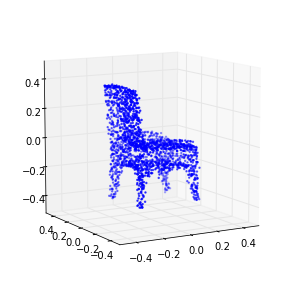

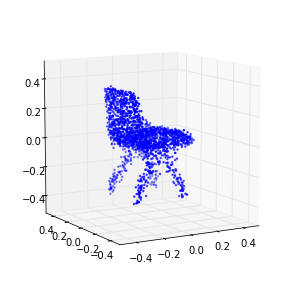

241 (-0.17378557765925373, -0.14134665633793231)
242 (-0.17489205493971152, -0.13465177902468928)
243 (-0.17359743239703002, -0.15231344683302772)
244 (-0.17098855486622563, -0.14107624606953728)
245 (-0.1738094456769802, -0.14836835033363766)
246 (-0.17151470394046217, -0.1381803328792254)
247 (-0.17858890780696163, -0.14380858231473853)
248 (-0.17171862577950514, -0.14718836463159984)
249 (-0.17312734717572176, -0.14014919019407696)
250 (-0.17216861948922829, -0.15238277393358726)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-250 is not in all_model_checkpoint_paths. Manually adding it.


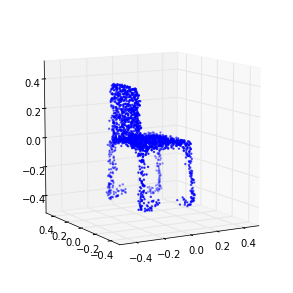

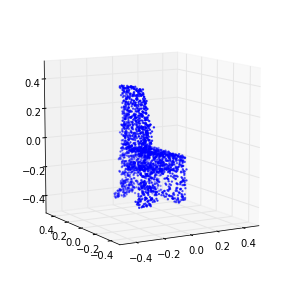

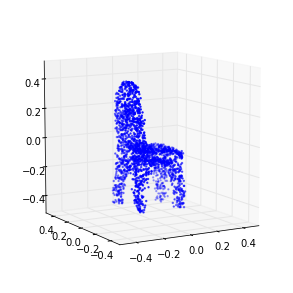

251 (-0.17397537209369518, -0.14706996966291358)
252 (-0.17249963609156785, -0.1362382099032402)
253 (-0.17180786072104065, -0.13295365428483044)
254 (-0.17293876608212788, -0.14299945202138689)
255 (-0.17142041855388218, -0.15951857936603051)
256 (-0.17422445576500009, -0.14571002015361079)
257 (-0.16810437573326958, -0.13180769897169536)
258 (-0.17219327771001391, -0.15414995286199781)
259 (-0.17166722753533611, -0.1560446172952652)
260 (-0.17160951925648582, -0.15386642653633048)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-260 is not in all_model_checkpoint_paths. Manually adding it.


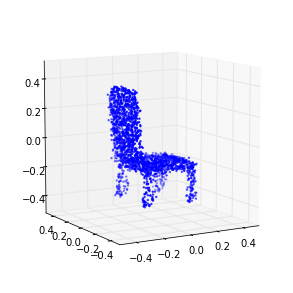

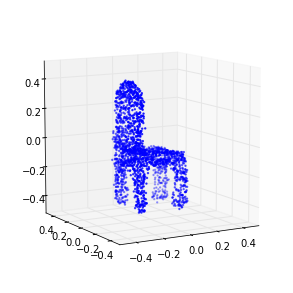

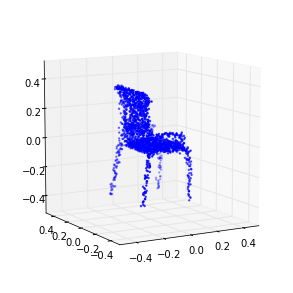

261 (-0.17157960920422166, -0.12976282531464542)
262 (-0.17165858386843294, -0.13349971616709674)
263 (-0.17267228734714013, -0.1371440655655331)
264 (-0.17522628991692155, -0.13248040637484304)
265 (-0.1704263863188249, -0.14328555183278191)
266 (-0.16862366436808199, -0.12363265234011191)
267 (-0.17625014577750805, -0.14316049770072656)
268 (-0.16949465765997215, -0.14222920713601289)
269 (-0.17133833203050824, -0.12973908114212532)
270 (-0.16859665038409055, -0.13624291949801975)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-270 is not in all_model_checkpoint_paths. Manually adding it.


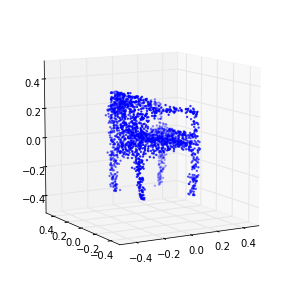

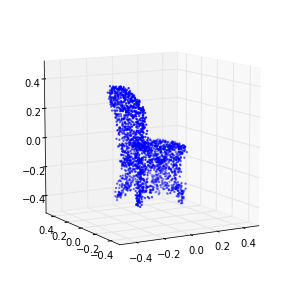

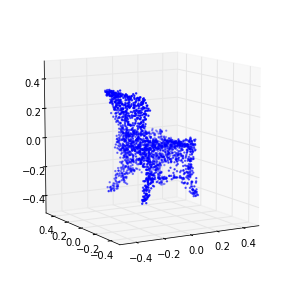

271 (-0.16769943601555296, -0.14682383504178789)
272 (-0.16914689060714511, -0.12013137312950911)
273 (-0.16697322395112779, -0.14239175424531655)
274 (-0.16910622467597325, -0.13114462737683896)
275 (-0.16851209275148532, -0.1421492624062079)
276 (-0.17256683591339322, -0.14557977462256397)
277 (-0.16631511758874964, -0.13380716741085052)
278 (-0.16928024661761742, -0.14877769268221325)
279 (-0.1687851036036456, -0.1577298089309975)
280 (-0.16558223372256314, -0.13984910426316438)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-280 is not in all_model_checkpoint_paths. Manually adding it.


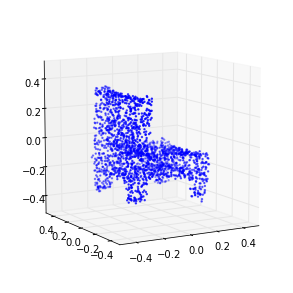

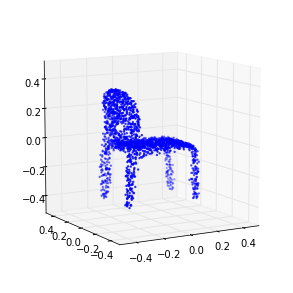

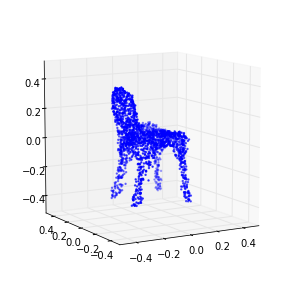

281 (-0.16904509028902762, -0.14812643384491955)
282 (-0.17067382324624944, -0.13207566241423288)
283 (-0.1696135515968005, -0.13069422294696173)
284 (-0.16748946463620221, -0.13598336196608013)
285 (-0.17073777152432335, -0.15058016832228061)
286 (-0.16731170404840398, -0.13836037615935007)
287 (-0.16962012284331851, -0.14227375829661335)
288 (-0.16611882221919519, -0.13902779530595849)
289 (-0.16689799323126123, -0.13895627607901892)
290 (-0.16527410232358508, -0.13428392978730025)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-290 is not in all_model_checkpoint_paths. Manually adding it.


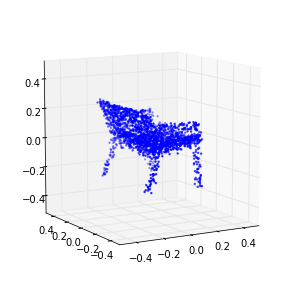

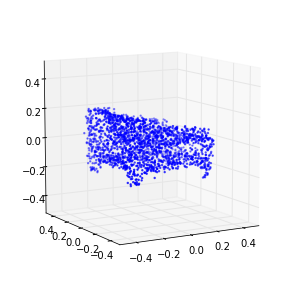

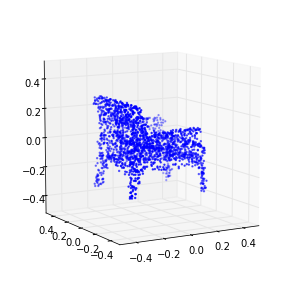

291 (-0.16677900045006364, -0.12733280410369238)
292 (-0.16874106962371754, -0.1326545167852331)
293 (-0.167800644978329, -0.12900374746984905)
294 (-0.16623746305704118, -0.13721634778711531)
295 (-0.16880988826354346, -0.13368625304213277)
296 (-0.1670903511069439, -0.12407136239387372)
297 (-0.16621896768057787, -0.12465574757920371)
298 (-0.16784498277637694, -0.1415791674344628)
299 (-0.17057941727064274, -0.13829472688613115)
300 (-0.16612390677134195, -0.11665385740774649)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-300 is not in all_model_checkpoint_paths. Manually adding it.


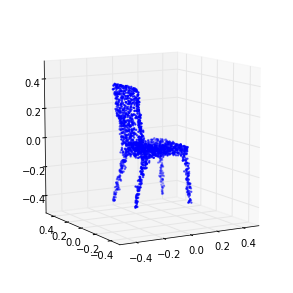

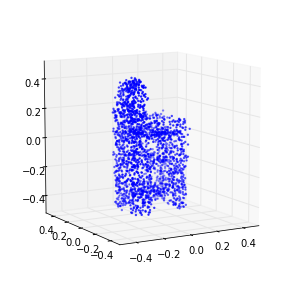

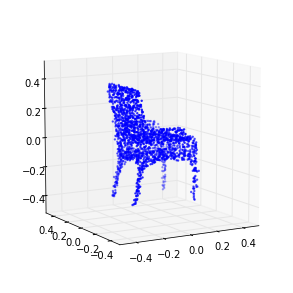

301 (-0.16712083943464137, -0.12846700902338382)
302 (-0.16699502699904972, -0.13500965469413334)
303 (-0.16581201111828839, -0.11676326449270602)
304 (-0.16577086823957937, -0.13379688754125876)
305 (-0.16357504714418342, -0.13747663768353285)
306 (-0.16877281307070344, -0.11717640967280776)
307 (-0.16625350239100278, -0.11543700126586137)
308 (-0.16812276917475241, -0.12385066295111621)
309 (-0.1686209574893669, -0.1328515581510685)
310 (-0.16525705688529543, -0.13016066010351535)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-310 is not in all_model_checkpoint_paths. Manually adding it.


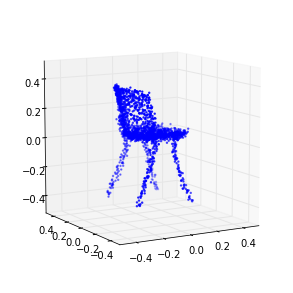

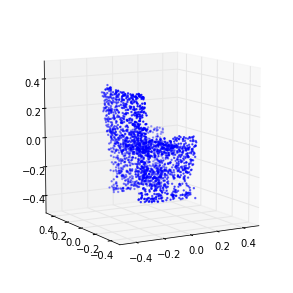

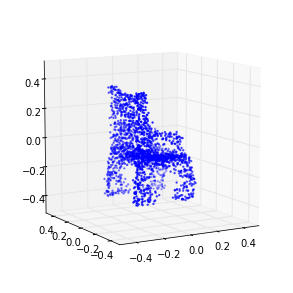

311 (-0.16718568277579768, -0.124224996401204)
312 (-0.16889503979020648, -0.10702499333355162)
313 (-0.16306698476826703, -0.11974328038869081)
314 (-0.16178160232526284, -0.10109758170114623)
315 (-0.17070495491778409, -0.10997106079702024)
316 (-0.16858641290002399, -0.107953822447194)
317 (-0.16691280608927761, -0.11461571824771387)
318 (-0.16692562616533704, -0.10986426583042851)
319 (-0.16842534227503669, -0.11425237854321797)
320 (-0.1670162859890196, -0.1107148434276934)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-320 is not in all_model_checkpoint_paths. Manually adding it.


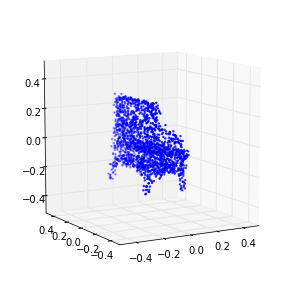

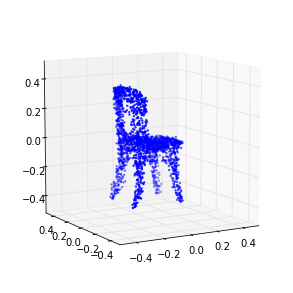

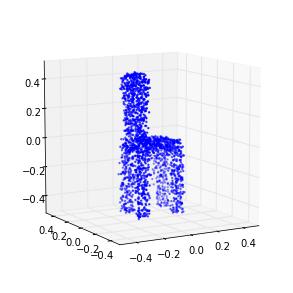

321 (-0.16656758139530817, -0.098071327088055785)
322 (-0.16478299134307436, -0.10836954249276055)
323 (-0.16396055624440864, -0.099477811130108659)
324 (-0.16659359595289938, -0.11109025831575747)
325 (-0.16649988172230898, -0.10118686049072831)
326 (-0.16559847438776934, -0.096316150631065717)
327 (-0.16614435419992166, -0.092752738821285749)
328 (-0.16517929848697449, -0.091713905610420088)
329 (-0.16375587411500789, -0.10359183560918879)
330 (-0.16612658285432391, -0.099007926605365892)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-330 is not in all_model_checkpoint_paths. Manually adding it.


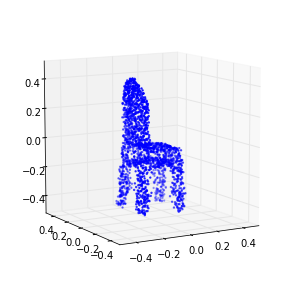

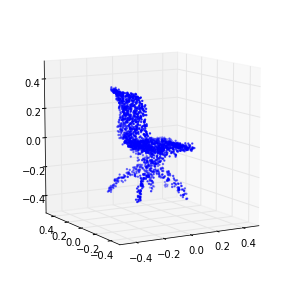

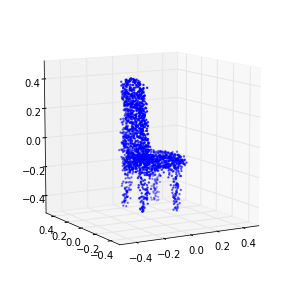

331 (-0.16238034008829683, -0.099704372110190218)
332 (-0.16797400718485866, -0.10566915599284349)
333 (-0.16032489604420133, -0.094792142234466692)
334 (-0.16643225677587367, -0.10648231622245577)
335 (-0.16423896821560682, -0.096603563124382938)
336 (-0.16319784820079802, -0.101242502944337)
337 (-0.16259418317565211, -0.10327069585522015)
338 (-0.16753494259383944, -0.088838184045420751)
339 (-0.16392582020273916, -0.097480154009880846)
340 (-0.16741327223954378, -0.09717141422960493)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-340 is not in all_model_checkpoint_paths. Manually adding it.


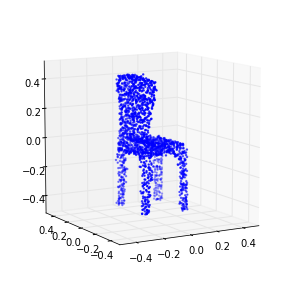

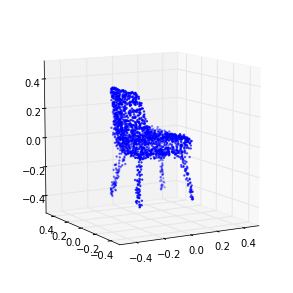

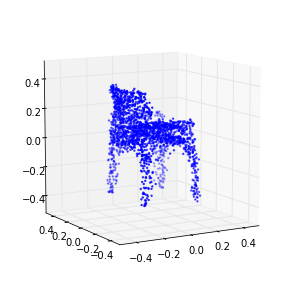

341 (-0.16574847262214731, -0.092715757002157187)
342 (-0.1649796899822023, -0.095381166372034282)
343 (-0.16496812502543132, -0.087155433992544815)
344 (-0.16494650029473834, -0.082235962704375942)
345 (-0.1627578086875103, -0.10209473967552185)
346 (-0.16509955061806572, -0.092502740522225693)
347 (-0.16822869143000355, -0.098291697187556162)
348 (-0.16449996393035959, -0.094258572906255722)
349 (-0.15927892846089822, -0.091968307202612912)
350 (-0.16611914264935035, -0.086279744351351703)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-350 is not in all_model_checkpoint_paths. Manually adding it.


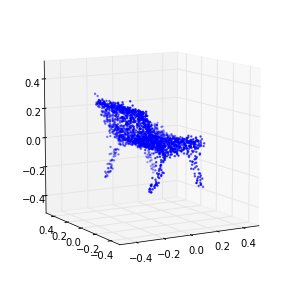

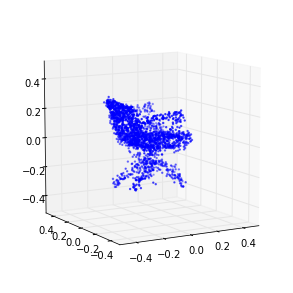

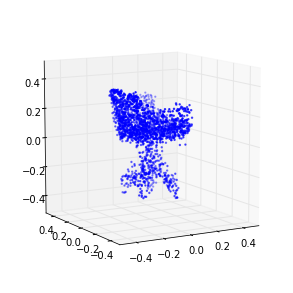

351 (-0.16259080331634593, -0.091952757702933416)
352 (-0.16264043737340855, -0.088830929939393649)
353 (-0.16453681924828775, -0.094222707328972991)
354 (-0.16539781579264887, -0.089098159085821221)
355 (-0.1646216979181325, -0.10155513454918508)
356 (-0.16135524919739477, -0.086869374883395648)
357 (-0.16808925221363705, -0.10023750157819854)
358 (-0.16329500123306556, -0.083824890355269119)
359 (-0.163516916555387, -0.096776683021474769)
360 (-0.16245229128334257, -0.091242252124680415)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-360 is not in all_model_checkpoint_paths. Manually adding it.


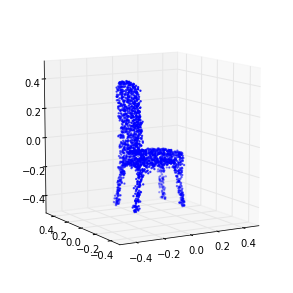

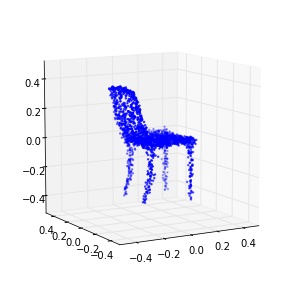

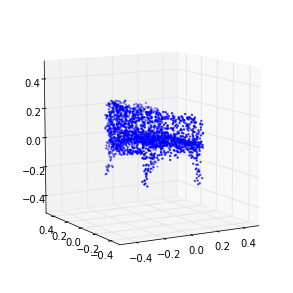

361 (-0.16494219926772294, -0.092617779970169067)
362 (-0.16229076700078116, -0.099179232837977235)
363 (-0.16176259252760145, -0.086686601793324505)
364 (-0.16221727287327803, -0.097296423934124132)
365 (-0.1610638772447904, -0.086729872695825716)
366 (-0.16525473947878236, -0.088669852388125872)
367 (-0.16371070113446978, -0.089255616344787458)
368 (-0.16798164932816118, -0.092976713898005311)
369 (-0.16099141427764185, -0.088533124300064867)
370 (-0.16426845446780877, -0.085892950219136691)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-370 is not in all_model_checkpoint_paths. Manually adding it.


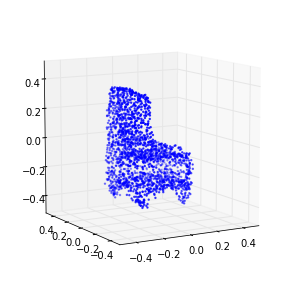

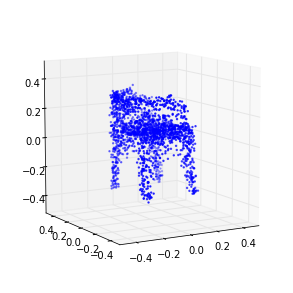

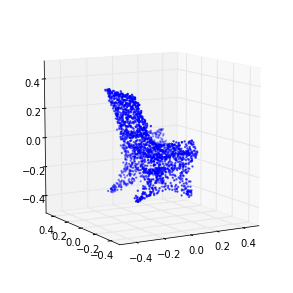

371 (-0.16350139418133983, -0.089043003782905916)
372 (-0.16419637528834519, -0.088815946959786951)
373 (-0.16141655456136775, -0.092581074546884606)
374 (-0.16207248656838028, -0.093515456688624835)
375 (-0.16263112602410493, -0.098666308378731762)
376 (-0.16429903087792574, -0.079893559838334724)
377 (-0.16288542984812349, -0.097620670166280538)
378 (-0.16495703806479772, -0.065429223218449836)
379 (-0.16202025468702669, -0.082290727162250762)
380 (-0.16401270583823876, -0.09063681711753209)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-380 is not in all_model_checkpoint_paths. Manually adding it.


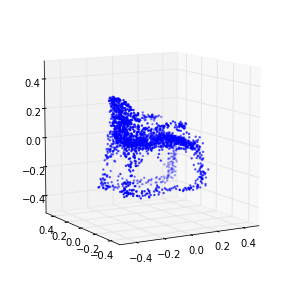

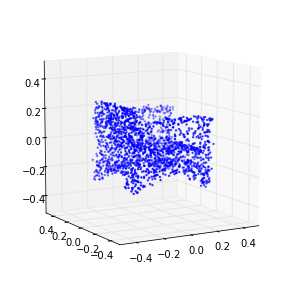

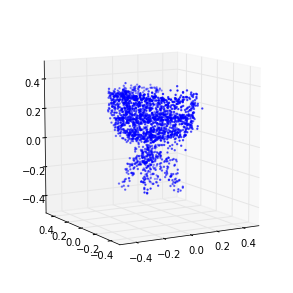

381 (-0.16529875833679128, -0.078324508749776423)
382 (-0.16166577593043999, -0.08904895283005855)
383 (-0.16222003924625891, -0.082011696641091952)
384 (-0.16313181784417893, -0.073801682779082542)
385 (-0.16493742554276078, -0.072829233068558902)
386 (-0.15939097454150516, -0.072466334190081666)
387 (-0.16468218868529355, -0.079039303378926382)
388 (-0.16324808581007852, -0.087320910283812767)
389 (-0.16334762926454896, -0.080306203139049029)
390 (-0.16373297125101088, -0.070230917660174544)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-390 is not in all_model_checkpoint_paths. Manually adding it.


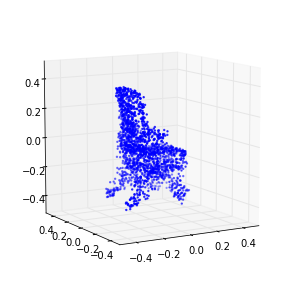

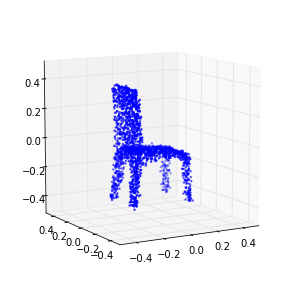

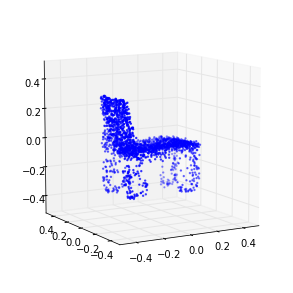

391 (-0.1602142815788587, -0.08493976184615383)
392 (-0.16181953825332501, -0.06303470223038285)
393 (-0.15901996741692226, -0.08028651187541308)
394 (-0.16607774187017371, -0.060773456952086198)
395 (-0.16261381418616683, -0.073996858602320706)
396 (-0.16231725949932027, -0.085235744300815791)
397 (-0.16423720011004694, -0.079450479950065961)
398 (-0.16601491581510613, -0.074128621154361307)
399 (-0.16303242191120429, -0.071856171375623459)
400 (-0.16029904611684659, -0.074251054130770544)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-400 is not in all_model_checkpoint_paths. Manually adding it.


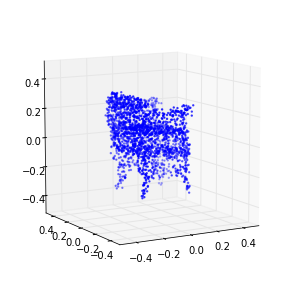

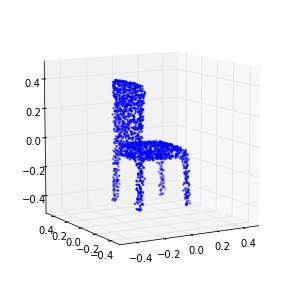

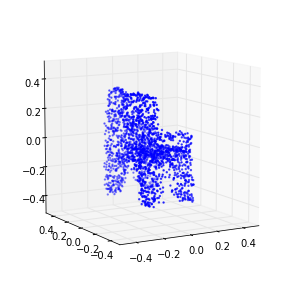

401 (-0.16216187697869761, -0.081526178452703685)
402 (-0.16333726147810618, -0.079235372443993882)
403 (-0.16398268016400161, -0.070577304672311852)
404 (-0.1621030866547867, -0.07827396773629719)
405 (-0.16487056530184216, -0.079302789781380584)
406 (-0.16285947881363055, -0.06441340009095492)
407 (-0.15985166485662813, -0.073352709136627336)
408 (-0.16098506036731933, -0.085023603643532147)
409 (-0.16309421399125346, -0.061219423146987403)
410 (-0.1608054154449039, -0.083681185212400228)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-410 is not in all_model_checkpoint_paths. Manually adding it.


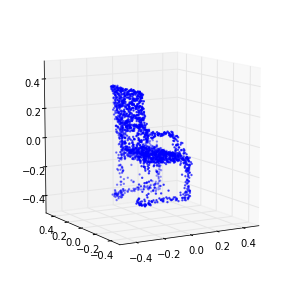

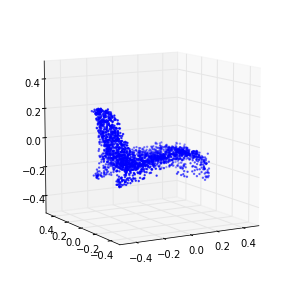

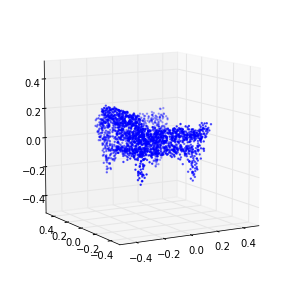

411 (-0.15911062370847773, -0.05936812931947686)
412 (-0.16164626550895198, -0.082733262468267371)
413 (-0.16210036034937259, -0.070017354907812898)
414 (-0.1618149752970095, -0.069647379012571439)
415 (-0.1632638677402779, -0.085766374926876138)
416 (-0.16246329220356764, -0.065473126868406936)
417 (-0.16175290136425582, -0.084231088006937946)
418 (-0.16094598113386718, -0.071918218224136923)
419 (-0.16271840057991169, -0.067612429045968592)
420 (-0.16163941058847639, -0.069739860930928474)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-420 is not in all_model_checkpoint_paths. Manually adding it.


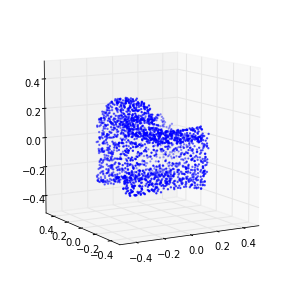

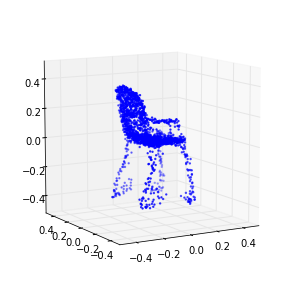

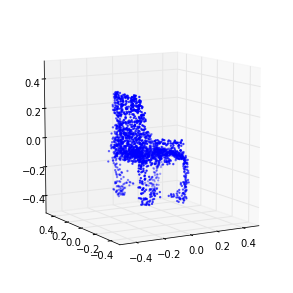

421 (-0.16318268047438728, -0.070447158413352792)
422 (-0.163401760160923, -0.066065986192336792)
423 (-0.16348356709436135, -0.075463883923711603)
424 (-0.16274521190811087, -0.078263773513888871)
425 (-0.16479252311918471, -0.068963378460870847)
426 (-0.16114324761761559, -0.058218128220350655)
427 (-0.15809603052006826, -0.054895189073350698)
428 (-0.16166716035869386, -0.077052240294438815)
429 (-0.16411972316326917, -0.058003218568585535)
430 (-0.16038496014144685, -0.051117184537428396)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-430 is not in all_model_checkpoint_paths. Manually adding it.


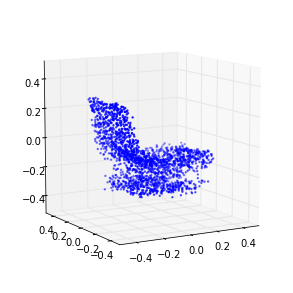

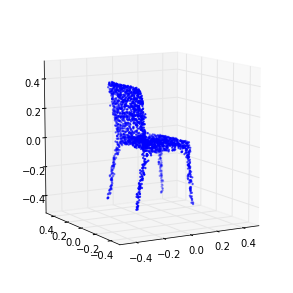

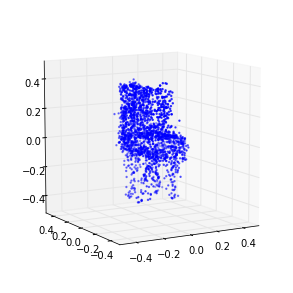

431 (-0.16220482306347953, -0.07226215013199383)
432 (-0.15815155103250786, -0.063923119757048508)
433 (-0.16000214075600661, -0.066629674975518832)
434 (-0.15979983861799593, -0.072711937819366107)
435 (-0.15977302375766966, -0.066424190170235098)
436 (-0.16025310064907428, -0.073016691056114649)
437 (-0.16206661142684795, -0.059247103140310002)
438 (-0.15952265384020628, -0.058714609593153)
439 (-0.15973796055272774, -0.063183408644464284)
440 (-0.16075974454482397, -0.057883528854559968)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-440 is not in all_model_checkpoint_paths. Manually adding it.


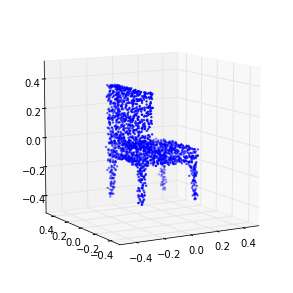

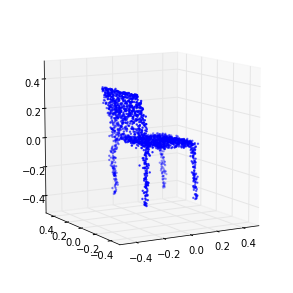

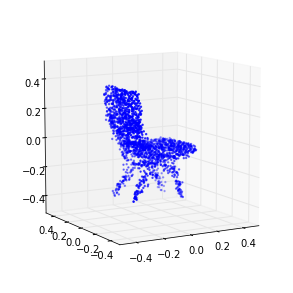

441 (-0.16168104316349383, -0.077962344857277696)
442 (-0.16182922058635288, -0.061959124342710885)
443 (-0.16194906052615907, -0.067881932482123375)
444 (-0.16464701234190551, -0.077586660058134138)
445 (-0.16168924868106843, -0.076304213592299705)
446 (-0.16015447946610273, -0.065765304042509312)
447 (-0.15813942755813951, -0.063311173615080332)
448 (-0.16127281255192227, -0.063507328154864137)
449 (-0.16237015006718813, -0.055290273390710354)
450 (-0.16313424590561126, -0.050111723994767224)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-450 is not in all_model_checkpoint_paths. Manually adding it.


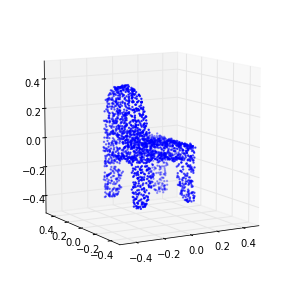

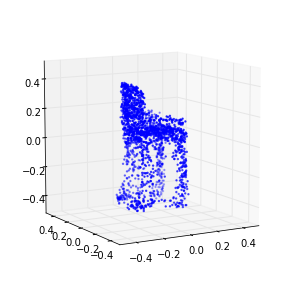

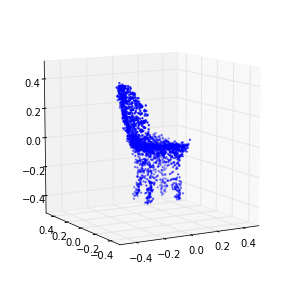

451 (-0.16316547780125229, -0.072463799681928426)
452 (-0.16232861870968784, -0.048968899753634575)
453 (-0.16189776195420158, -0.080292700341454262)
454 (-0.16184835787172672, -0.060907944278032693)
455 (-0.16078969162923318, -0.069517482486036092)
456 (-0.16524001133662683, -0.060582330243455038)
457 (-0.16092346558968226, -0.076290229956309005)
458 (-0.15767432892764055, -0.06102145194179482)
459 (-0.16154049684604008, -0.071329681547703569)
460 (-0.16142871501269163, -0.04576095686018191)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-460 is not in all_model_checkpoint_paths. Manually adding it.


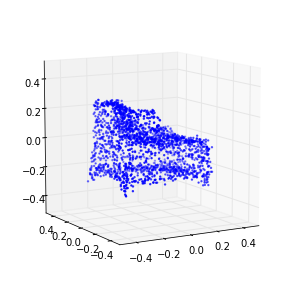

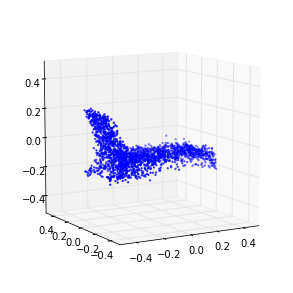

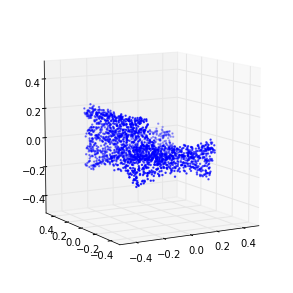

461 (-0.15995414047329515, -0.063547922229325329)
462 (-0.15941335238792279, -0.057796944381186259)
463 (-0.1577855200679214, -0.070533553069388424)
464 (-0.16154082721030272, -0.059633939320014581)
465 (-0.15815091767796763, -0.052068500227674293)
466 (-0.16253330812410072, -0.050185028222148063)
467 (-0.16087224362073121, -0.050532714394783532)
468 (-0.16107712807478727, -0.057041483137894561)
469 (-0.15918292005856832, -0.049591318600707583)
470 (-0.15980992637298724, -0.066932394169270992)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-470 is not in all_model_checkpoint_paths. Manually adding it.


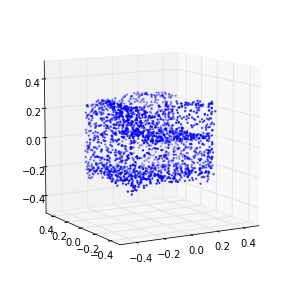

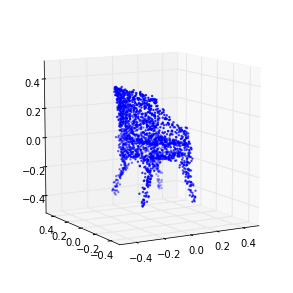

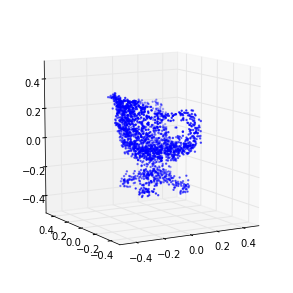

471 (-0.16097016422836868, -0.061174740049022215)
472 (-0.16160293674027479, -0.061489323843960407)
473 (-0.1588243411646949, -0.062680092985155408)
474 (-0.15849665624124032, -0.061012043514185481)
475 (-0.16209373849409597, -0.054478364548197496)
476 (-0.16187432126866447, -0.052767536154499757)
477 (-0.16085295053543869, -0.046651476442261981)
478 (-0.16243344777160221, -0.052027926935503878)
479 (-0.15853269232643974, -0.0452054544110541)
480 (-0.16029826391626287, -0.062376049933610136)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-480 is not in all_model_checkpoint_paths. Manually adding it.


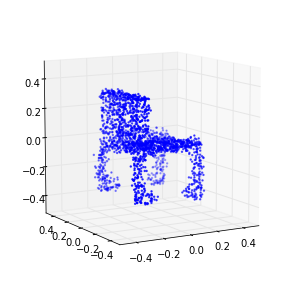

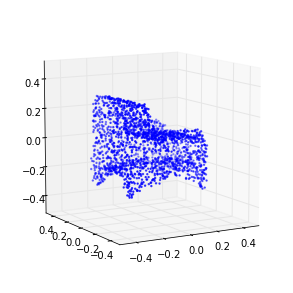

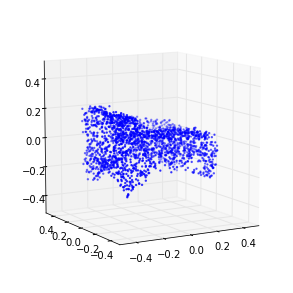

481 (-0.16095838761991924, -0.063721860310545678)
482 (-0.16078769796424441, -0.046411398962071096)
483 (-0.1572328802060198, -0.050985039522250496)
484 (-0.15893853748286213, -0.045503871446406399)
485 (-0.15564724405606586, -0.052115906650821366)
486 (-0.16069449263590355, -0.041410467759878548)
487 (-0.16269937025176154, -0.05154294680148639)
488 (-0.15836777543580091, -0.046083080358113405)
489 (-0.16174569433486019, -0.058872783418606828)
490 (-0.16111829021462687, -0.056276718913405029)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-490 is not in all_model_checkpoint_paths. Manually adding it.


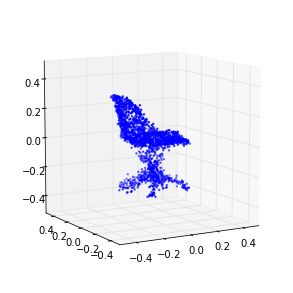

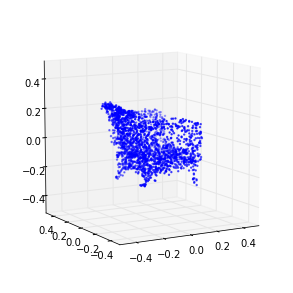

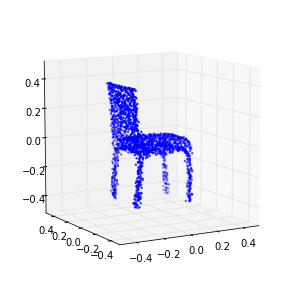

491 (-0.1596220072220873, -0.06385823135712633)
492 (-0.16097960571448008, -0.058023173396510107)
493 (-0.16072092012122827, -0.062850945387725482)
494 (-0.16339105064118351, -0.057973780358831085)
495 (-0.16166775165884584, -0.054438573998157623)
496 (-0.15811748675726078, -0.053723892714414329)
497 (-0.16024595714277692, -0.043475043304540495)
498 (-0.15664539922166754, -0.045192556214277389)
499 (-0.16387272648237369, -0.038199751120474607)
500 (-0.16099760046711675, -0.04986998104248886)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-500 is not in all_model_checkpoint_paths. Manually adding it.


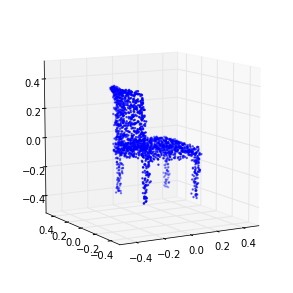

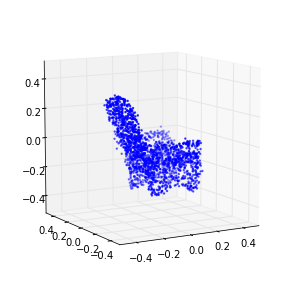

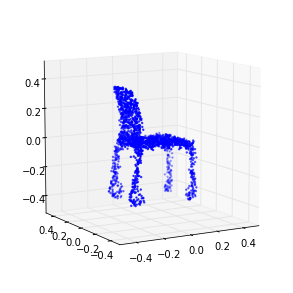

501 (-0.16195898177447143, -0.045914874860533965)
502 (-0.16175883279906378, -0.044699818344303859)
503 (-0.15876185794671377, -0.042720659842921629)
504 (-0.15684323134245695, -0.045971497893333435)
505 (-0.15923163305830074, -0.044035822463532291)
506 (-0.15848294027425625, -0.047635030070388759)
507 (-0.16015164504448573, -0.036859609738544179)
508 (-0.16013625667051032, -0.035728308130745533)
509 (-0.16234372390641105, -0.037393866227594788)
510 (-0.15970071515551321, -0.041617887870719038)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-510 is not in all_model_checkpoint_paths. Manually adding it.


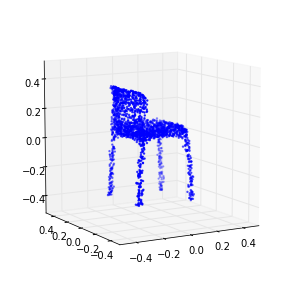

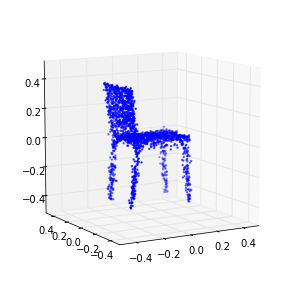

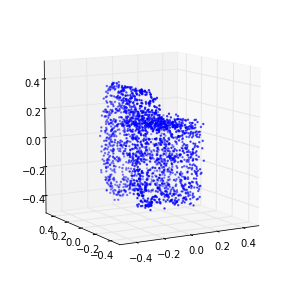

511 (-0.15939123801611088, -0.033432862997331003)
512 (-0.16018045169335823, -0.026251581807931263)
513 (-0.16039670369139425, -0.056878092526285735)
514 (-0.15919924919252043, -0.046859939893086754)
515 (-0.16044428812132941, -0.049937934994145679)
516 (-0.15943558447890813, -0.038956789196365409)
517 (-0.15777535168109116, -0.034528969838801354)
518 (-0.15810679224906143, -0.037996762406287923)
519 (-0.15917479892571768, -0.036516582627815229)
520 (-0.15959564083152347, -0.03089163785248443)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-520 is not in all_model_checkpoint_paths. Manually adding it.


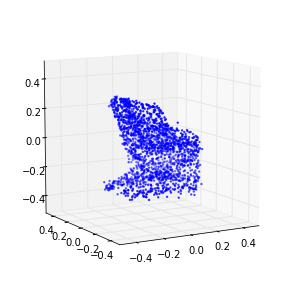

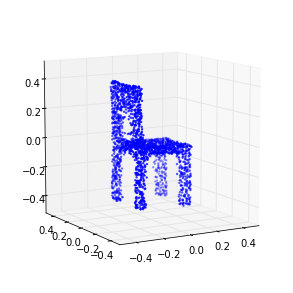

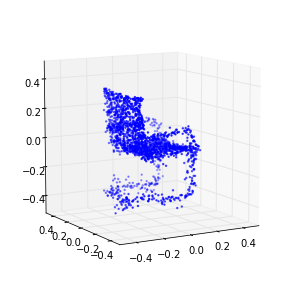

521 (-0.15966097839452603, -0.02949903746721921)
522 (-0.16004682426099423, -0.047681696368036444)
523 (-0.15820921896784393, -0.035619962615547354)
524 (-0.16032773957208352, -0.015182735053477463)
525 (-0.15885513921578726, -0.025724203675054014)
526 (-0.16119593950333419, -0.030859572942265205)
527 (-0.16232157989784524, -0.040014955103052433)
528 (-0.16068397561709086, -0.023547712454779282)
529 (-0.15782376290471464, -0.034253310463908643)
530 (-0.15860745625363457, -0.048973538981819595)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-530 is not in all_model_checkpoint_paths. Manually adding it.


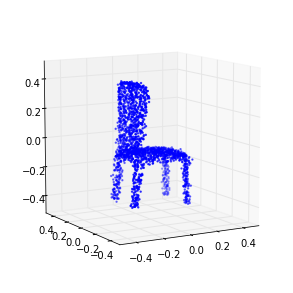

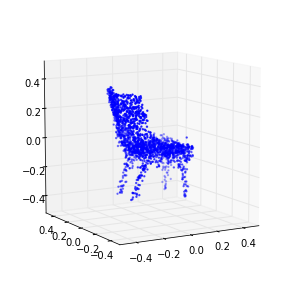

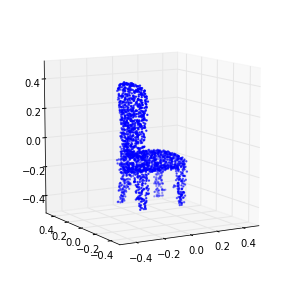

531 (-0.15875399366573051, -0.033299648151215583)
532 (-0.15932610493015359, -0.027644954742518841)
533 (-0.15767274372003698, -0.023631678359514033)
534 (-0.15648561870610272, -0.02060837231369482)
535 (-0.15998984216539949, -0.023979465701375848)
536 (-0.15810270033500812, -0.019674343781338796)
537 (-0.16052184364310018, -0.003323017964484515)
538 (-0.15732709340475223, -0.01053162739198241)
539 (-0.15657902801478352, -0.017243656648874835)
540 (-0.15647330924316688, -0.019762564881670254)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-540 is not in all_model_checkpoint_paths. Manually adding it.


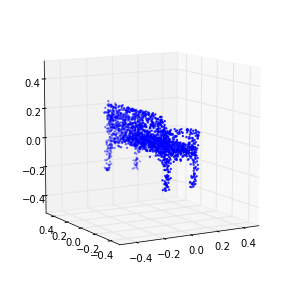

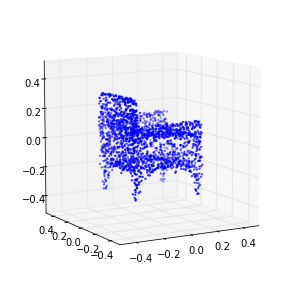

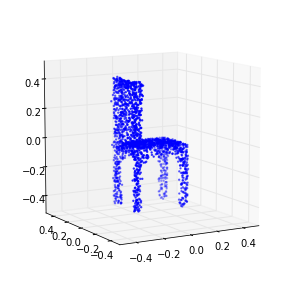

541 (-0.15718904562570429, -0.012410664982679818)
542 (-0.15764560815360812, -0.022632727382221707)
543 (-0.15999797563310023, -0.023663509611247316)
544 (-0.15830071717500688, -0.017138240143173823)
545 (-0.16183865346290446, -0.0088918443113841384)
546 (-0.15717282278670205, -0.014040582554621829)
547 (-0.15415542230561927, -0.010638994526945882)
548 (-0.15972436920360283, -0.016201357012269674)
549 (-0.16006437816001751, -0.017690434189582313)
550 (-0.15687250743309658, -0.0037062296307542259)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-550 is not in all_model_checkpoint_paths. Manually adding it.


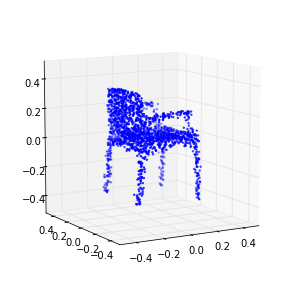

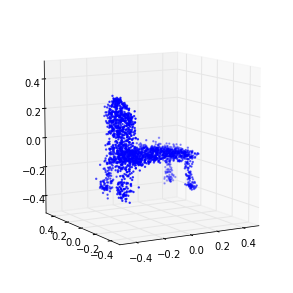

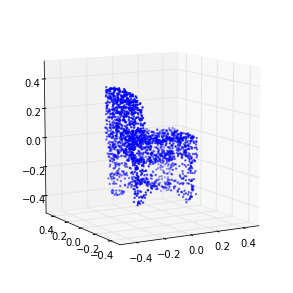

551 (-0.16042850177597118, -0.016916512334891769)
552 (-0.16064145598146651, -0.029468659897921263)
553 (-0.15522563225693173, -0.0020767445503561584)
554 (-0.15532254571164095, -0.0071479680396064563)
555 (-0.1578156727331656, -0.006095246161782631)
556 (-0.15801043791903391, -0.018621360727896292)
557 (-0.15405706658407495, -0.0037394325611078078)
558 (-0.15728413534385186, -0.0064671156341554945)
559 (-0.15971501188145742, -0.001329218554827902)
560 (-0.15613370438416799, -0.006754138265494947)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-560 is not in all_model_checkpoint_paths. Manually adding it.


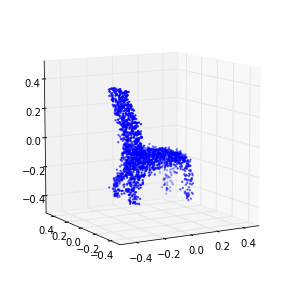

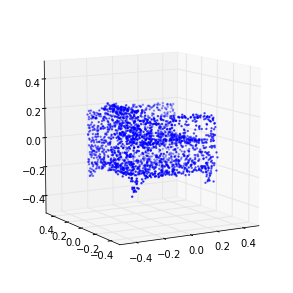

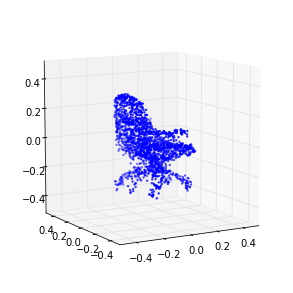

561 (-0.15393263405119931, 0.011449659113875695)
562 (-0.15536691596110661, -0.012369551212975272)
563 (-0.16193284999441218, -0.0018354199861210804)
564 (-0.16222925208233022, -0.0092679758521693727)
565 (-0.15902935167153676, -0.0092832845532231853)
566 (-0.15635709630118477, -0.0088605880996005405)
567 (-0.16066269935281188, -0.0071305727448176459)
568 (-0.15869105071933182, 0.0097322790728261079)
569 (-0.16041300269188705, 0.0013876405061671027)
570 (-0.15895324801957167, -0.0027064571881459821)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-570 is not in all_model_checkpoint_paths. Manually adding it.


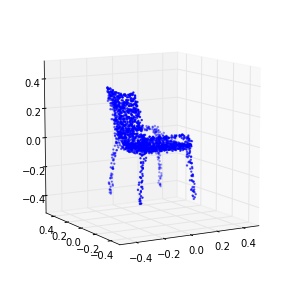

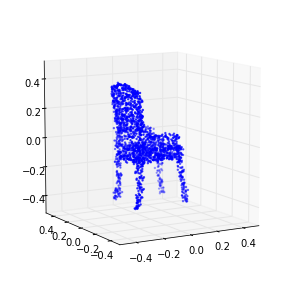

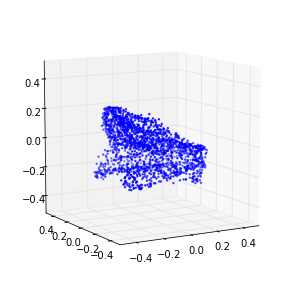

571 (-0.15741543195865773, -0.003300288364429165)
572 (-0.15831908854069532, -0.0029936732413868108)
573 (-0.15943558856293008, -0.00035994569770991802)
574 (-0.15367178961082742, -0.002062714503457149)
575 (-0.15886770288149515, 0.00034732707017273815)
576 (-0.15913946965226419, -0.0061277599436127478)
577 (-0.15883454559025942, -0.0092444914496607258)
578 (-0.15699253904598731, 0.0016148379762415534)
579 (-0.1565710257600855, 0.0016149479067987865)
580 (-0.15429502698006453, 0.011383372152017223)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-580 is not in all_model_checkpoint_paths. Manually adding it.


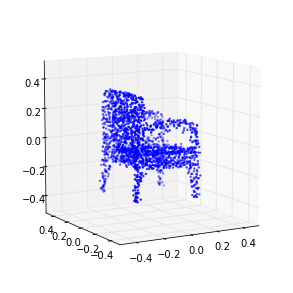

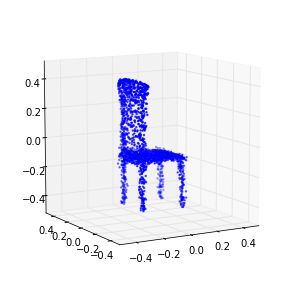

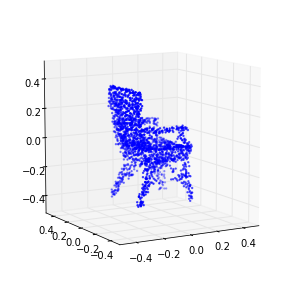

581 (-0.15529007878568438, 0.013664261472445947)
582 (-0.15620212571488487, -0.0032693975846524591)
583 (-0.15705974598725636, 0.0028231089106864398)
584 (-0.15737084520083885, 0.0084663296411572782)
585 (-0.1569780370151555, -0.0032247989869642036)
586 (-0.15904186770871834, 0.0039641202117005987)
587 (-0.15579260306225884, 0.0066850703916753887)
588 (-0.15460860701622786, 0.006885768086821945)
589 (-0.15605373261151489, 0.0026823513261559936)
590 (-0.1574394107968719, 0.016775507410919224)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-590 is not in all_model_checkpoint_paths. Manually adding it.


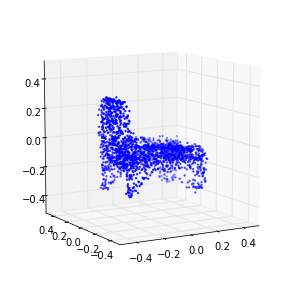

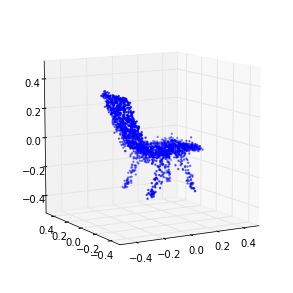

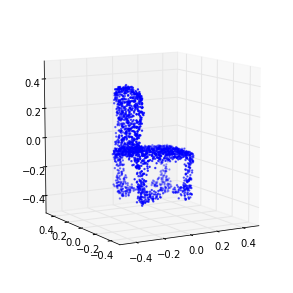

591 (-0.15715319536350392, 0.0021804601419717073)
592 (-0.16000496005570447, 0.013556657083056591)
593 (-0.15628843368203552, 0.0039650463257674814)
594 (-0.15565912513821215, 0.021924497637276847)
595 (-0.15668536435674738, 0.013384715809176365)
596 (-0.15721579635584795, 0.0059348924982327005)
597 (-0.15754804164171218, 0.005759139303807859)
598 (-0.16023721352771478, 0.0065967220537088535)
599 (-0.15655510039241224, 0.010429971575461052)
600 (-0.15565292730375571, 0.01441460665901778)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-600 is not in all_model_checkpoint_paths. Manually adding it.


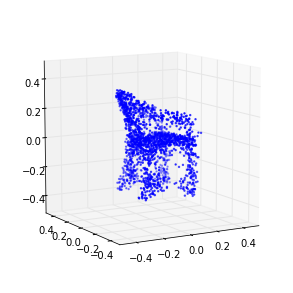

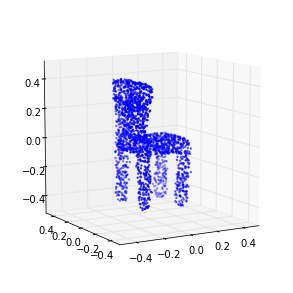

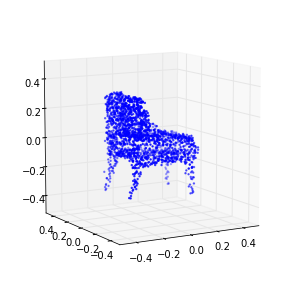

601 (-0.15630569220693022, 0.0078572860867198967)
602 (-0.15514840296021215, 0.012733555398881435)
603 (-0.15837568927694251, 0.021385912990404501)
604 (-0.15488082369168599, 0.01866619865823951)
605 (-0.15780556781424415, 0.016311402708567953)
606 (-0.15609673918397338, 0.016224489185131259)
607 (-0.15529297954506344, 0.01644436871908881)
608 (-0.15537538103483342, 0.020178388769703882)
609 (-0.15411881627859891, 0.02424087873832495)
610 (-0.15735975145189851, 0.0094841407370512137)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-610 is not in all_model_checkpoint_paths. Manually adding it.


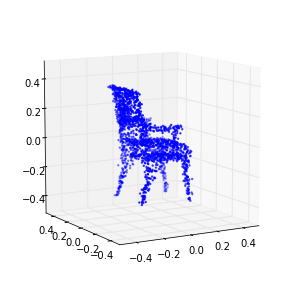

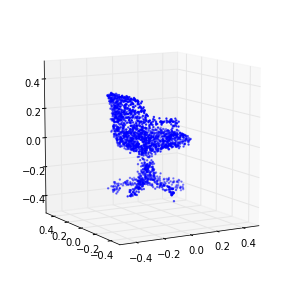

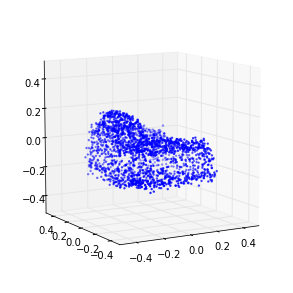

611 (-0.15502974346831994, 0.023774294475852338)
612 (-0.15846040447552998, 0.015852114392651454)
613 (-0.15837252355284162, 0.020972147549468058)
614 (-0.15528304334040041, 0.025355033291917708)
615 (-0.15537582718663745, 0.015775070448095601)
616 (-0.15361210256814956, 0.012243765440803987)
617 (-0.15609469518617347, 0.020579844385523488)
618 (-0.15567361160560891, 0.034482849623869966)
619 (-0.15816364492531176, 0.026156915541462326)
620 (-0.15520183615110539, 0.029199448345160042)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-620 is not in all_model_checkpoint_paths. Manually adding it.


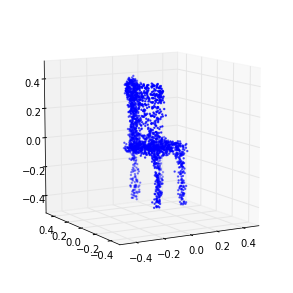

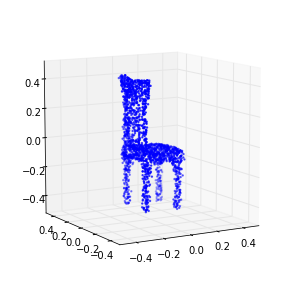

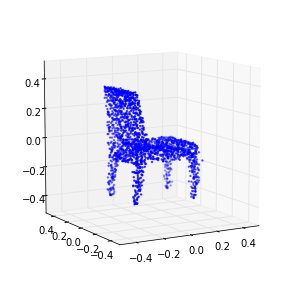

621 (-0.15560118202809933, 0.029632378447179992)
622 (-0.15513143401454996, 0.011928886433856355)
623 (-0.15619681345091926, 0.0097239231518297282)
624 (-0.15606924654157073, 0.024270158631865074)
625 (-0.15397783611659652, 0.01453140445260538)
626 (-0.15517655975288816, 0.021912750218891434)
627 (-0.15722093819468111, 0.024011190446024691)
628 (-0.15543300967525553, 0.017068646649864537)
629 (-0.15504188692128218, 0.030171428962300222)
630 (-0.15486053200783553, 0.036233661040939669)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-630 is not in all_model_checkpoint_paths. Manually adding it.


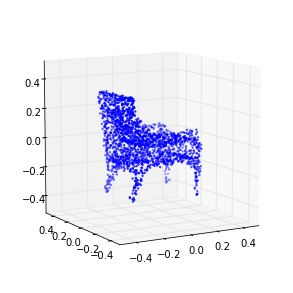

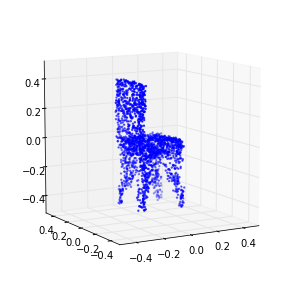

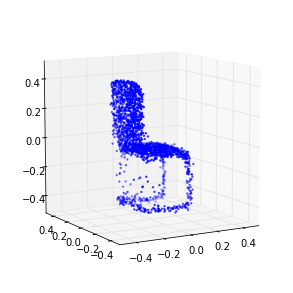

631 (-0.15440271535405406, 0.039541701717233216)
632 (-0.15494821380685878, 0.031002421276988806)
633 (-0.14898146562002323, 0.028028319184495894)
634 (-0.15388303923386115, 0.028432278324746423)
635 (-0.15665330969625049, 0.033579914520184197)
636 (-0.15331356508864297, 0.024249360620699548)
637 (-0.15511538121435378, 0.035614051994074275)
638 (-0.15418493863609101, 0.025236183811944944)
639 (-0.15726564085042036, 0.031707669280607392)
640 (-0.15591823055788323, 0.046356735130151115)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-640 is not in all_model_checkpoint_paths. Manually adding it.


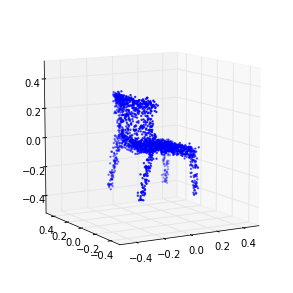

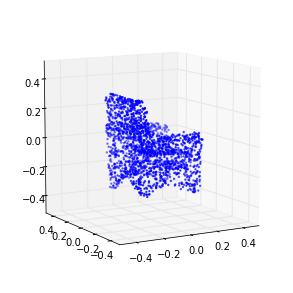

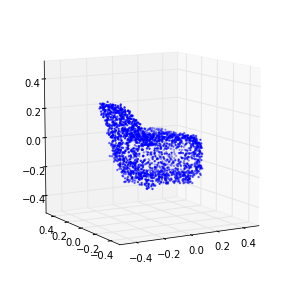

641 (-0.15640800810522504, 0.040302766120509696)
642 (-0.15680743367583663, 0.036156718946855376)
643 (-0.15666336704183509, 0.033593115276070659)
644 (-0.15294352913344347, 0.045677761650747724)
645 (-0.15207768468945115, 0.029760671227618499)
646 (-0.15453789399729834, 0.037837497803762006)
647 (-0.15348071174489128, 0.028961020271742233)
648 (-0.15442589824950254, 0.037506959340707573)
649 (-0.15593843537348287, 0.043621343250075974)
650 (-0.15479491606906609, 0.047534621182691167)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-650 is not in all_model_checkpoint_paths. Manually adding it.


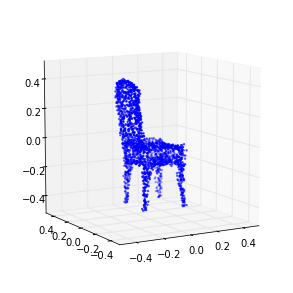

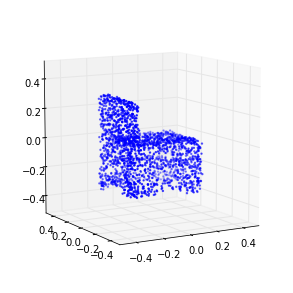

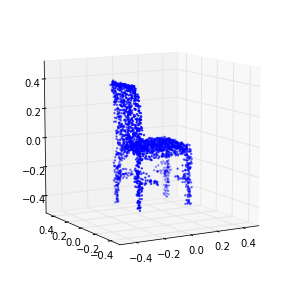

651 (-0.15439462518250502, 0.049062882722527894)
652 (-0.15406458477179211, 0.044052577198103619)
653 (-0.15396986813456923, 0.041899476165848749)
654 (-0.15096769548124736, 0.048053317030684814)
655 (-0.15419401879663822, 0.04683506557786906)
656 (-0.15844015473568882, 0.036856797782497272)
657 (-0.15316187010871041, 0.035636155728112767)
658 (-0.15464425953450026, 0.037119316833990591)
659 (-0.15445374371828857, 0.056919232735203371)
660 (-0.15277381837368012, 0.050862011861883931)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-660 is not in all_model_checkpoint_paths. Manually adding it.


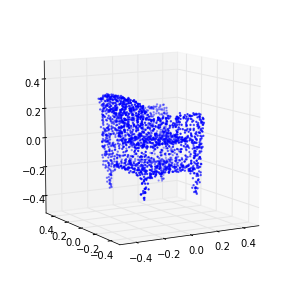

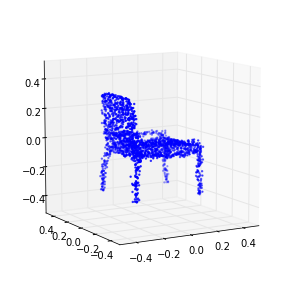

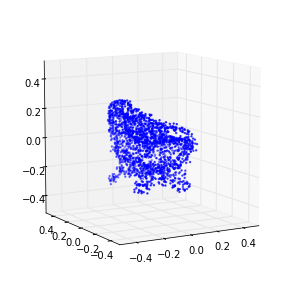

661 (-0.1558759911192788, 0.046225229381687112)
662 (-0.15720938841501872, 0.032654531955443045)
663 (-0.15188495577485472, 0.04079801606497279)
664 (-0.15616448369842989, 0.042863938457298058)
665 (-0.15326358013682895, 0.048287855875160962)
666 (-0.15240345917366169, 0.037355916367636785)
667 (-0.1546165825592147, 0.050222842505684602)
668 (-0.1547071216834916, 0.047461974417307866)
669 (-0.15616774724589455, 0.038436967525976126)
670 (-0.15269642974491474, 0.054328659411381791)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-670 is not in all_model_checkpoint_paths. Manually adding it.


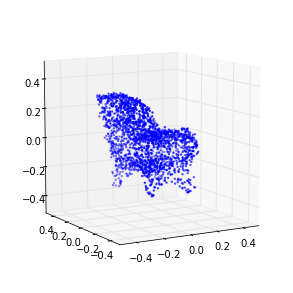

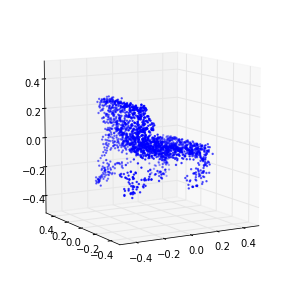

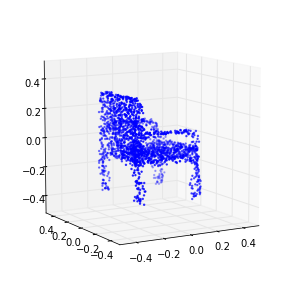

671 (-0.15609564372786769, 0.03145299545765199)
672 (-0.1556970148174851, 0.043879018579092294)
673 (-0.15594636682007049, 0.049875393164930518)
674 (-0.15600304095833389, 0.057957578381454503)
675 (-0.15524618907107246, 0.05089611649789192)
676 (-0.15587564883408722, 0.054032812032986571)
677 (-0.15352531064439703, 0.053935302973345471)
678 (-0.15565800534354315, 0.04419575514340842)
679 (-0.15551872501770655, 0.054648736422812497)
680 (-0.15891771426907292, 0.048045019429452995)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-680 is not in all_model_checkpoint_paths. Manually adding it.


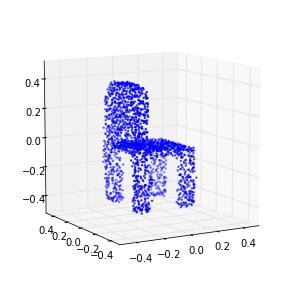

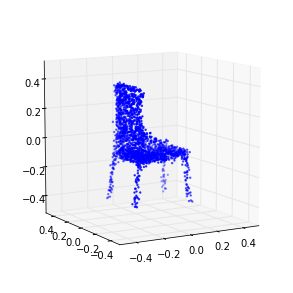

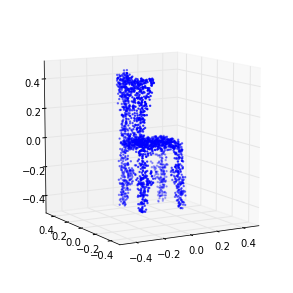

681 (-0.15558711268283704, 0.057049892135654333)
682 (-0.15480080749149674, 0.057550700657345633)
683 (-0.15832309187562377, 0.051287566242670571)
684 (-0.1524635871803319, 0.060706162238838499)
685 (-0.15610945986376867, 0.057674311791305187)
686 (-0.15309403417287049, 0.055824106145236224)
687 (-0.15260645885158469, 0.060766672163649844)
688 (-0.15670529675704462, 0.049711902328352958)
689 (-0.15593362947305042, 0.053356676224481175)
690 (-0.15623023250588663, 0.051372424181964665)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-690 is not in all_model_checkpoint_paths. Manually adding it.


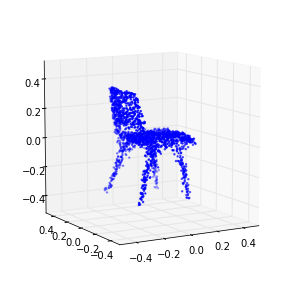

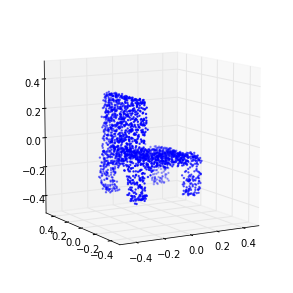

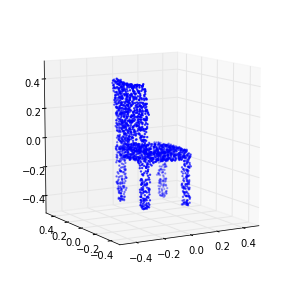

691 (-0.15434814708100425, 0.064143042149091209)
692 (-0.15360164515398167, 0.060961720568162424)
693 (-0.15581018394894069, 0.056893784587306005)
694 (-0.15636016069738953, 0.061935341054642642)
695 (-0.15373056889684111, 0.06272939468423526)
696 (-0.15304568117415462, 0.04941250363157855)
697 (-0.15559818838481551, 0.063869769409022947)
698 (-0.15497294013147001, 0.057793452852854026)
699 (-0.15549168117620327, 0.05850300185934261)
700 (-0.15164656241734822, 0.060693306779419934)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-700 is not in all_model_checkpoint_paths. Manually adding it.


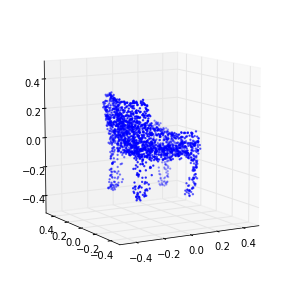

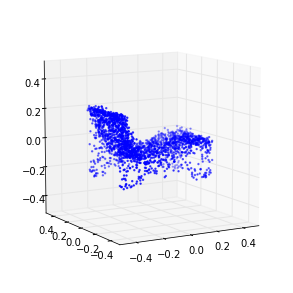

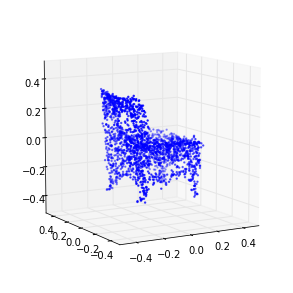

701 (-0.15320792358230662, 0.061870720168506657)
702 (-0.15220812583963075, 0.060543351323792231)
703 (-0.15583866829121554, 0.05620567362617563)
704 (-0.15540100043570554, 0.063041723747220307)
705 (-0.15673411703772014, 0.061048634074352404)
706 (-0.1554982567275012, 0.058523089004059635)
707 (-0.1543974514912676, 0.06060298835789716)
708 (-0.15464502043194242, 0.051416499997247699)
709 (-0.15167410500623563, 0.056128297208084002)
710 (-0.15173853530927942, 0.056028416552753361)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-710 is not in all_model_checkpoint_paths. Manually adding it.


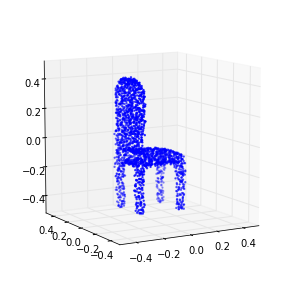

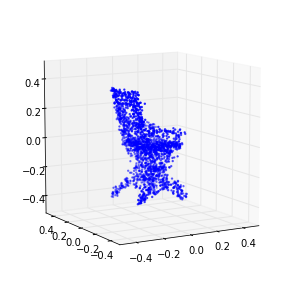

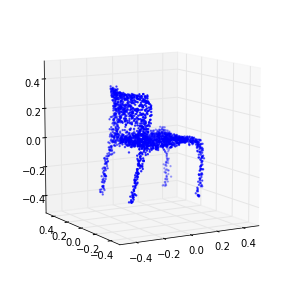

711 (-0.15432361712058384, 0.058344692060792888)
712 (-0.15254784391985998, 0.064452287361577709)
713 (-0.15124747984939152, 0.06774958340382134)
714 (-0.15319601137329031, 0.061715184124531572)
715 (-0.15447251614597107, 0.064345478839068507)
716 (-0.1529725357890129, 0.061153515690454734)
717 (-0.1556427464441017, 0.067697542271128411)
718 (-0.15365099724796083, 0.058400036284217131)
719 (-0.15273582019187787, 0.063719828233674725)
720 (-0.15687223452108878, 0.064305097416595181)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-720 is not in all_model_checkpoint_paths. Manually adding it.


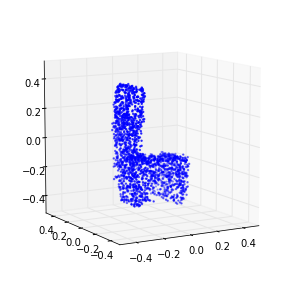

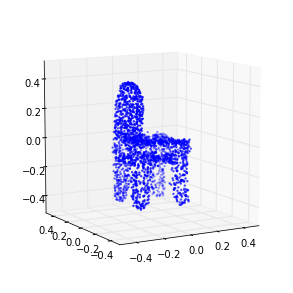

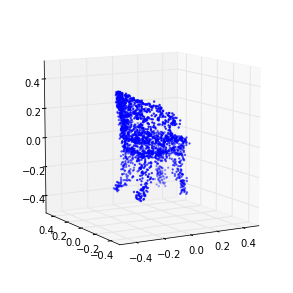

721 (-0.15255344559748968, 0.062417764216661453)
722 (-0.15439416920697246, 0.067971626227652585)
723 (-0.15290957396781002, 0.048054510348097039)
724 (-0.1524506535795, 0.054540501459053266)
725 (-0.15498178722681821, 0.06408707438795655)
726 (-0.15652780543874811, 0.068796011584776426)
727 (-0.15416123182685287, 0.06466927303484192)
728 (-0.15418520376638131, 0.072294038203027516)
729 (-0.15578563114007313, 0.063555299131958579)
730 (-0.15376759072144827, 0.080810372062303404)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-730 is not in all_model_checkpoint_paths. Manually adding it.


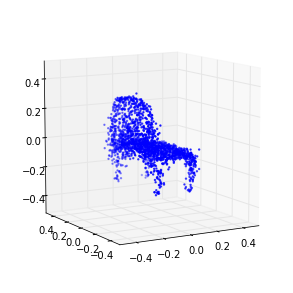

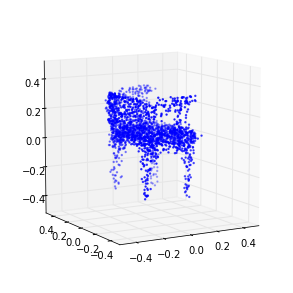

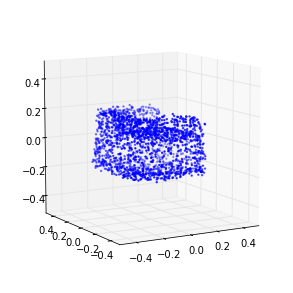

731 (-0.15160535987880494, 0.066436399809188307)
732 (-0.15485638788452855, 0.081674497022672932)
733 (-0.15434762885173162, 0.081876573739228423)
734 (-0.15425583267653431, 0.067870873819898675)
735 (-0.15723231467935775, 0.072014027654572765)
736 (-0.15394901252455181, 0.08208241299898536)
737 (-0.15178030398156908, 0.085668406828686039)
738 (-0.15707408156659869, 0.074241521043909922)
739 (-0.15314504040612115, 0.072956467254294291)
740 (-0.15538181221043623, 0.078398959021325459)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-740 is not in all_model_checkpoint_paths. Manually adding it.


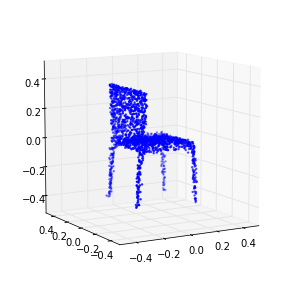

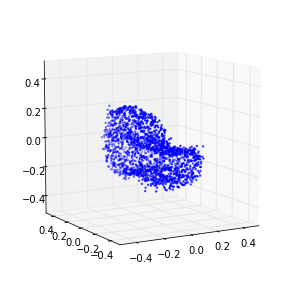

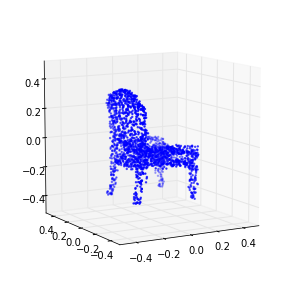

741 (-0.15587828507026036, 0.074474825213352844)
742 (-0.15503874045831187, 0.08213008512501363)
743 (-0.1532813768695902, 0.068438553423793222)
744 (-0.15683650280590411, 0.073066405400081913)
745 (-0.15312191236902167, 0.073238437719367167)
746 (-0.15439123505795443, 0.078207673849882905)
747 (-0.15818673482647649, 0.077565589712725744)
748 (-0.15226981965480027, 0.07320521082039233)
749 (-0.14989518644633115, 0.065570452147059977)
750 (-0.15565015883357436, 0.06674595625588188)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-750 is not in all_model_checkpoint_paths. Manually adding it.


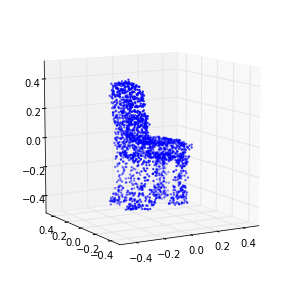

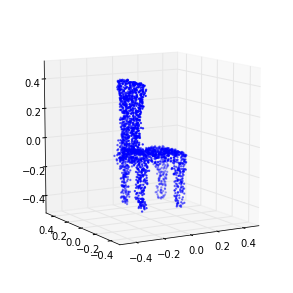

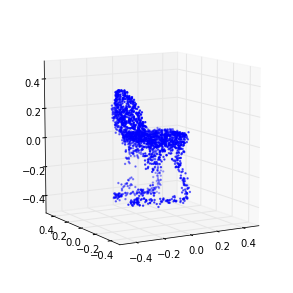

751 (-0.15214835604031882, 0.082252462980923827)
752 (-0.15189870297908784, 0.076368634347562442)
753 (-0.15305923747795599, 0.076157644115112444)
754 (-0.15370717181099786, 0.073290924369185065)
755 (-0.152004762104264, 0.075218956089682043)
756 (-0.1541350182559755, 0.076492967153037036)
757 (-0.15546171521698987, 0.093816234833664358)
758 (-0.15572227681124651, 0.09118233248591423)
759 (-0.15577644120763851, 0.097224502789753461)
760 (-0.15400354503481475, 0.084835245515461316)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-760 is not in all_model_checkpoint_paths. Manually adding it.


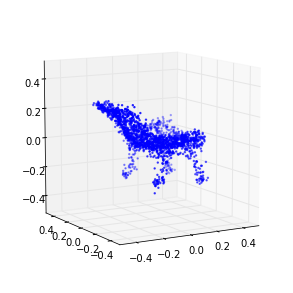

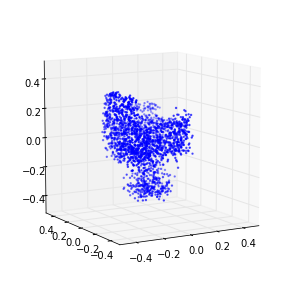

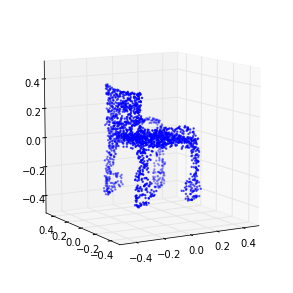

761 (-0.15642545526778256, 0.075517797497687514)
762 (-0.15450468355858768, 0.080690364042917892)
763 (-0.15179453773630991, 0.086961483237919981)
764 (-0.1521244791370851, 0.090460582325855896)
765 (-0.15068494892782636, 0.088205890661036526)
766 (-0.15343993317197871, 0.092856200894823784)
767 (-0.1544643631135976, 0.084203032017857934)
768 (-0.15195139514075384, 0.087919335122461667)
769 (-0.15686616715457705, 0.087821603097297529)
770 (-0.15308199729080554, 0.089232514163962121)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-770 is not in all_model_checkpoint_paths. Manually adding it.


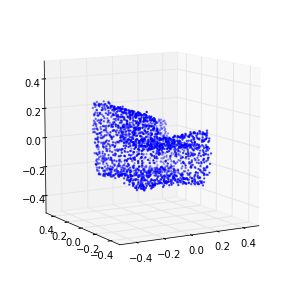

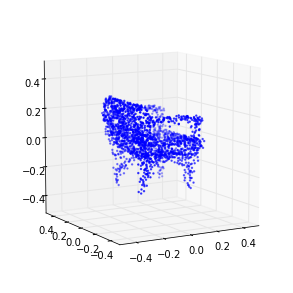

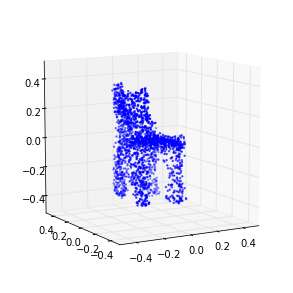

771 (-0.15261715987214336, 0.087785119121825253)
772 (-0.15266663012681184, 0.084492063356770411)
773 (-0.15315837098492516, 0.081187517830619102)
774 (-0.15453404052941888, 0.081374847778567558)
775 (-0.15293309826541829, 0.097219845211064373)
776 (-0.15075010337211467, 0.094095012380017176)
777 (-0.1534143078658316, 0.091328783995575369)
778 (-0.14955859427098875, 0.10195716415290479)
779 (-0.15396415342887243, 0.091994365608250653)
780 (-0.15308821979496215, 0.087735105167936395)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-780 is not in all_model_checkpoint_paths. Manually adding it.


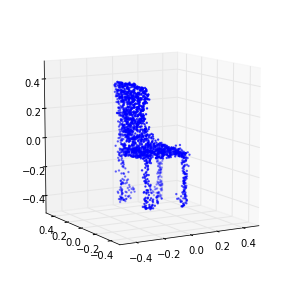

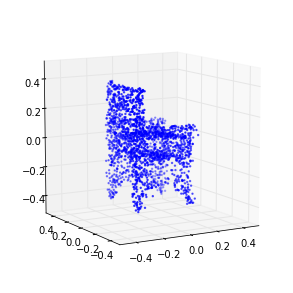

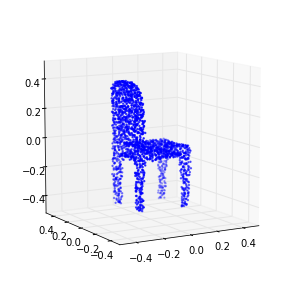

781 (-0.1527490699732745, 0.093237057052276751)
782 (-0.15334566003746455, 0.080359728799925909)
783 (-0.15434434149000381, 0.085833426702905585)
784 (-0.15437748426640474, 0.091397063323745018)
785 (-0.15127804615983256, 0.093565423593476971)
786 (-0.15486953926307184, 0.080551676314186166)
787 (-0.15429834574460982, 0.081405739955328127)
788 (-0.15637091817679227, 0.096465113814230313)
789 (-0.15119082811805937, 0.097911823954847127)
790 (-0.15670880664277959, 0.092637832931898256)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-790 is not in all_model_checkpoint_paths. Manually adding it.


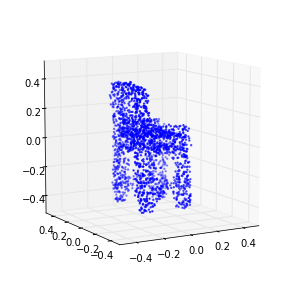

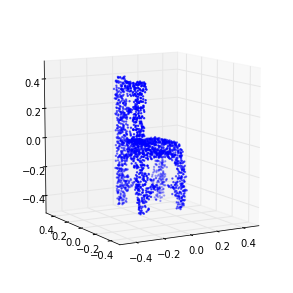

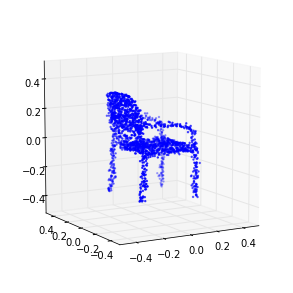

791 (-0.15638700199347955, 0.090129635262268568)
792 (-0.1553376465483948, 0.088811355194559807)
793 (-0.15412617066392192, 0.088544790667516207)
794 (-0.15338413566350936, 0.087599002100803236)
795 (-0.15381500312575588, 0.088476489539499631)
796 (-0.15390037303721463, 0.096763299985064402)
797 (-0.1518529149669188, 0.097166593428011289)
798 (-0.1529492154441498, 0.094778174051532035)
799 (-0.15574760646731764, 0.098179234950630759)
800 (-0.1526335961840771, 0.085231521477301911)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-800 is not in all_model_checkpoint_paths. Manually adding it.


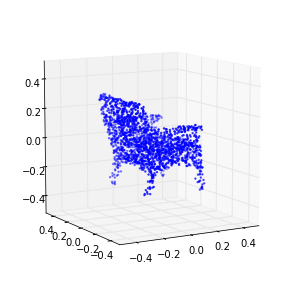

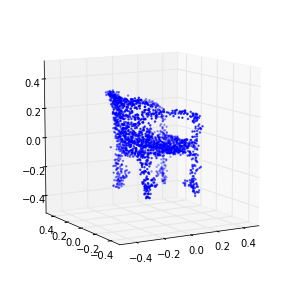

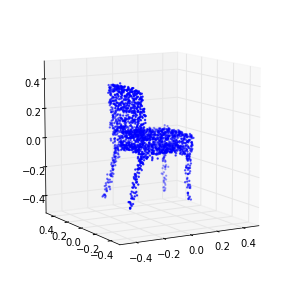

801 (-0.15372923535329325, 0.10096131982626738)
802 (-0.15394782026608786, 0.094064196226773436)
803 (-0.15273257471896984, 0.088122478789753378)
804 (-0.1514007036332731, 0.090437991751564875)
805 (-0.15730398540143614, 0.090281898224795307)
806 (-0.15203553956967814, 0.09125742426625004)
807 (-0.15210707750585345, 0.088008834256066218)
808 (-0.15286825205440874, 0.094350786120803262)
809 (-0.15439988424380621, 0.098338605077178384)
810 (-0.15136395113335716, 0.095433212264820377)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-810 is not in all_model_checkpoint_paths. Manually adding it.


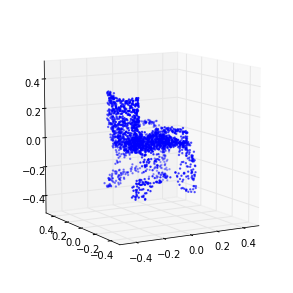

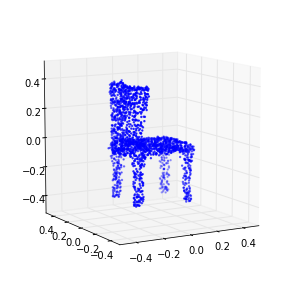

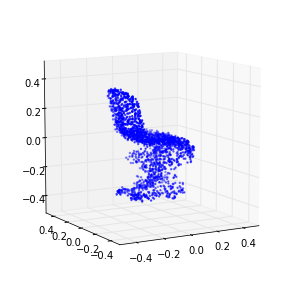

811 (-0.15325201678055303, 0.100277132458157)
812 (-0.1541266906592581, 0.094294736782709762)
813 (-0.15580328095842291, 0.094111898017150378)
814 (-0.15073640407235533, 0.095143784113504271)
815 (-0.1562340153036294, 0.098858157379759684)
816 (-0.1512982353568077, 0.089867651324581216)
817 (-0.15498097544467007, 0.09281150113653254)
818 (-0.15355725354618496, 0.10312710702419281)
819 (-0.15051332099570169, 0.099340674639851953)
820 (-0.15248792077656145, 0.10159407004162117)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-820 is not in all_model_checkpoint_paths. Manually adding it.


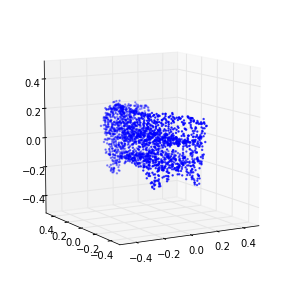

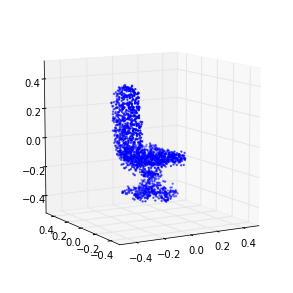

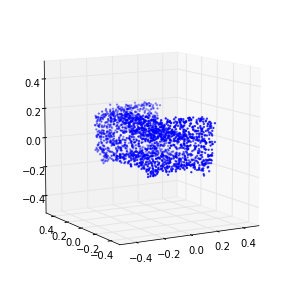

821 (-0.15486042262227448, 0.097088925264499804)
822 (-0.14858321806898825, 0.099713923754515474)
823 (-0.1531361766435482, 0.094418595510500455)
824 (-0.15145600719584359, 0.10267197727053254)
825 (-0.15184201057310456, 0.093121908605098724)
826 (-0.15076991590084854, 0.097650830392484317)
827 (-0.15311933573749331, 0.096741917370646094)
828 (-0.15216839677757688, 0.11035480626203396)
829 (-0.15142427379334414, 0.10974663523612199)
830 (-0.15270407939398731, 0.099765159465648512)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-830 is not in all_model_checkpoint_paths. Manually adding it.


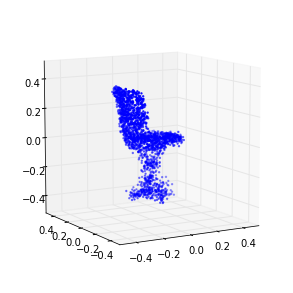

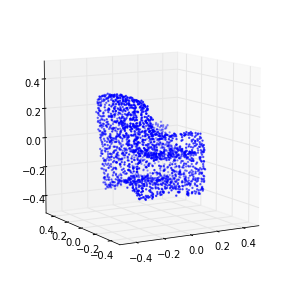

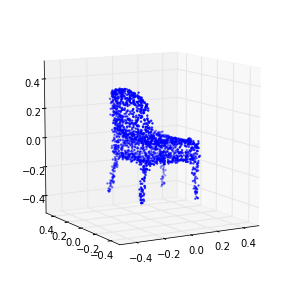

831 (-0.1523024677126496, 0.093631115776521182)
832 (-0.15312594500956711, 0.10755217185726872)
833 (-0.1558922051831528, 0.10729889957993119)
834 (-0.15333312854722694, 0.1136314766826453)
835 (-0.15324410304979041, 0.09870138171094435)
836 (-0.15106566542828526, 0.10726935995949639)
837 (-0.15454073829783332, 0.10406233135748792)
838 (-0.15189967028520726, 0.098977238629703174)
839 (-0.15137574744445306, 0.10003108807184079)
840 (-0.15211729964724294, 0.11614990096401286)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-840 is not in all_model_checkpoint_paths. Manually adding it.


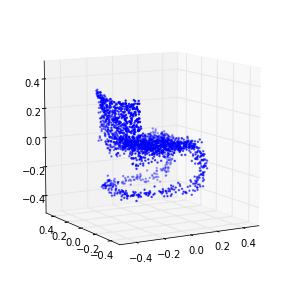

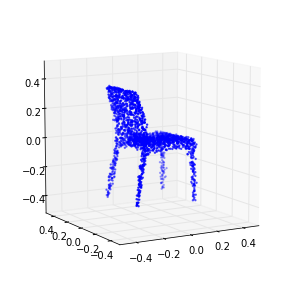

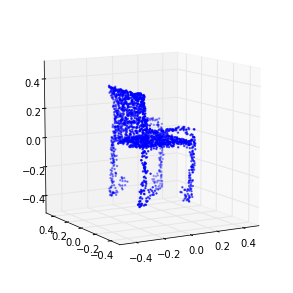

841 (-0.15318333484508373, 0.11492039511601131)
842 (-0.1535920763457263, 0.1060440206417331)
843 (-0.15455610161578215, 0.099120063362298186)
844 (-0.15251206579031767, 0.096253836872401063)
845 (-0.15413781123028861, 0.10484095607642774)
846 (-0.15299688632841463, 0.10039767540163463)
847 (-0.15612642102771335, 0.094603373082699602)
848 (-0.1541502720227948, 0.099232734353454019)
849 (-0.1572336976174955, 0.10872100541989009)
850 (-0.15211069843283406, 0.11394625571038988)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-850 is not in all_model_checkpoint_paths. Manually adding it.


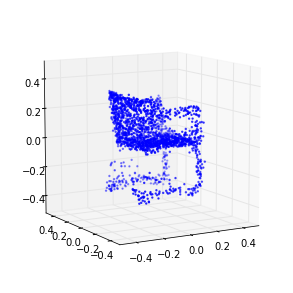

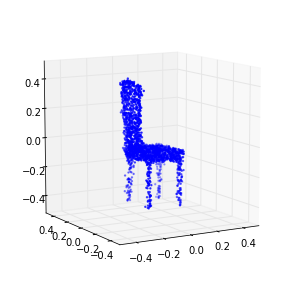

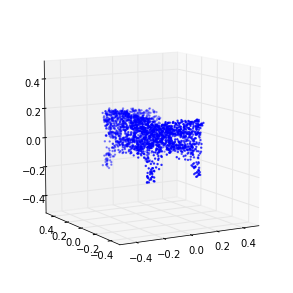

851 (-0.15300156303026058, 0.11600262878669633)
852 (-0.15635669849537037, 0.11528759863641527)
853 (-0.15210470926982386, 0.11686053678945259)
854 (-0.15578584179834085, 0.10111640821452494)
855 (-0.15610372413087775, 0.11825342034852063)
856 (-0.15362879297247639, 0.11942044066058265)
857 (-0.15184270949275405, 0.1166711300611496)
858 (-0.15291850809697752, 0.10444443231379544)
859 (-0.15470838922041433, 0.11290755702389611)
860 (-0.15525060202236529, 0.10671927255612833)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-860 is not in all_model_checkpoint_paths. Manually adding it.


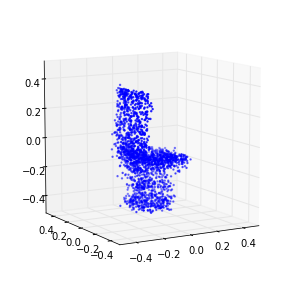

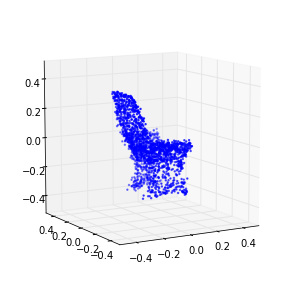

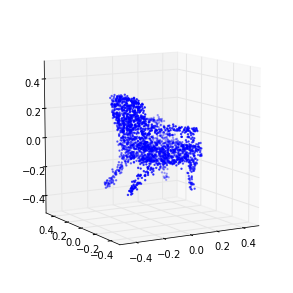

861 (-0.1532041139072842, 0.10297841827074687)
862 (-0.15305091976015656, 0.10868076124676952)
863 (-0.15318410766345483, 0.10539718827715626)
864 (-0.15398024143996061, 0.10882736025033174)
865 (-0.15208660905007962, 0.11568277494774924)
866 (-0.15150430130737799, 0.11077904259717022)
867 (-0.15212392453794127, 0.12385219832261403)
868 (-0.15431697765986124, 0.11692086524433559)
869 (-0.15438858209936707, 0.10421833934055434)
870 (-0.15301836651784403, 0.10686521784023002)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-870 is not in all_model_checkpoint_paths. Manually adding it.


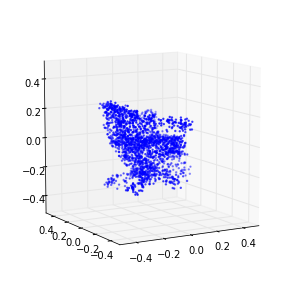

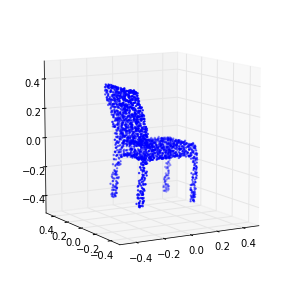

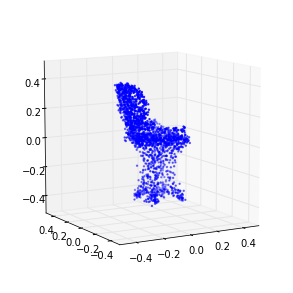

871 (-0.15280765835885649, 0.12080945571263631)
872 (-0.15246244691036365, 0.12294379787312613)
873 (-0.15306807828170282, 0.1190767075728487)
874 (-0.1526404740633788, 0.11687016901042727)
875 (-0.15481801756002284, 0.11598263184229533)
876 (-0.15575313297686755, 0.11192352297129454)
877 (-0.15467853800014214, 0.1082665823675968)
878 (-0.15332353015740713, 0.10894239555906367)
879 (-0.15354972255450708, 0.11776378557637886)
880 (-0.1550604517813082, 0.1108807631664806)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-880 is not in all_model_checkpoint_paths. Manually adding it.


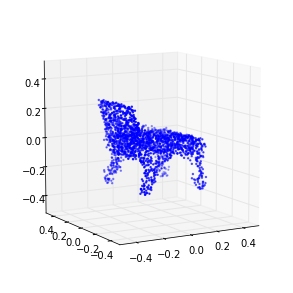

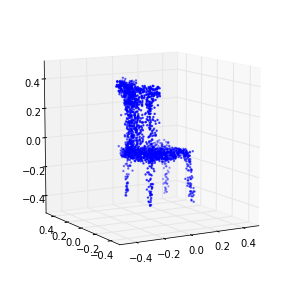

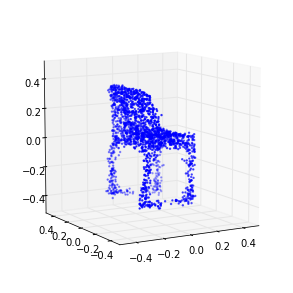

881 (-0.15376874771383073, 0.11880781805073773)
882 (-0.15128652298891987, 0.12499467780192693)
883 (-0.15150111129990332, 0.12553397372916894)
884 (-0.15343838521727809, 0.11858528686894311)
885 (-0.15383995843154413, 0.12145532778015843)
886 (-0.1520567524764273, 0.12370712889565362)
887 (-0.15291112076353144, 0.12947723324652072)
888 (-0.15232412506032872, 0.11417918762675038)
889 (-0.15231712973780101, 0.11707932971141956)
890 (-0.15247601723229443, 0.10624678156994007)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-890 is not in all_model_checkpoint_paths. Manually adding it.


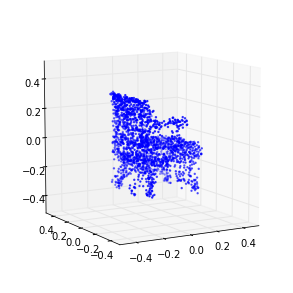

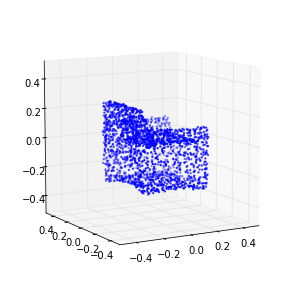

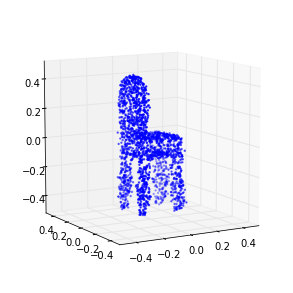

891 (-0.15072469821682682, 0.11392429415826444)
892 (-0.15238217843903434, 0.10946546743313472)
893 (-0.1549322055997672, 0.11484292784222851)
894 (-0.15307447915827788, 0.11533030619223912)
895 (-0.15226166822292186, 0.11810223496070614)
896 (-0.1525896073491485, 0.12803724187391777)
897 (-0.15389395930148936, 0.11583209506891391)
898 (-0.15193807041203533, 0.10939766218264897)
899 (-0.15334504048029582, 0.11800702523302149)
900 (-0.15366257583653486, 0.11225179472455273)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-900 is not in all_model_checkpoint_paths. Manually adding it.


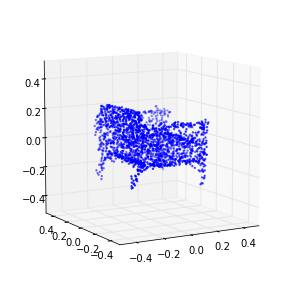

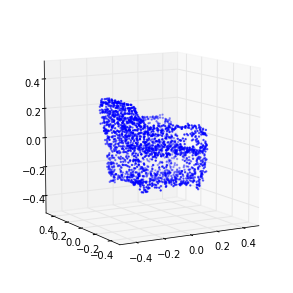

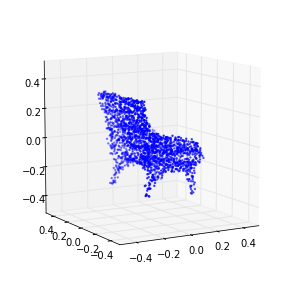

901 (-0.15115162150727379, 0.11904423739071246)
902 (-0.1555818248126242, 0.12305425273047553)
903 (-0.15093202651650817, 0.1153619940634127)
904 (-0.1524836116918811, 0.1312987553300681)
905 (-0.15341226011514664, 0.11717939680373227)
906 (-0.15179107895603886, 0.11593455021028165)
907 (-0.15315033981093654, 0.12666518710277699)
908 (-0.15257999472044131, 0.12474628013593179)
909 (-0.15192769241553766, 0.12566097411844465)
910 (-0.15600857006178961, 0.12281100010430371)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-910 is not in all_model_checkpoint_paths. Manually adding it.


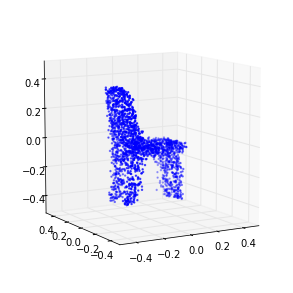

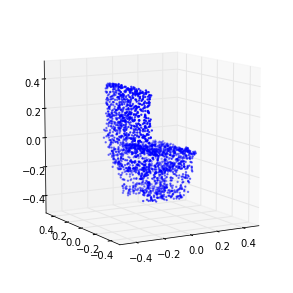

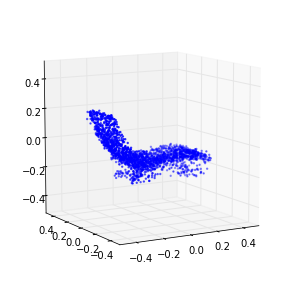

911 (-0.15370314789039116, 0.13255021748719392)
912 (-0.15097997194087065, 0.13142108696478386)
913 (-0.15373792339254308, 0.12697501563363606)
914 (-0.15523426245760036, 0.13269478772525434)
915 (-0.15312847704799087, 0.13101759470171398)
916 (-0.15293508845346945, 0.1332641053530905)
917 (-0.15270716647307078, 0.13611489534378052)
918 (-0.15242158836788602, 0.13305001981832362)
919 (-0.1544049698997427, 0.12425944043530358)
920 (-0.15481913327066987, 0.13606004858458484)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-920 is not in all_model_checkpoint_paths. Manually adding it.


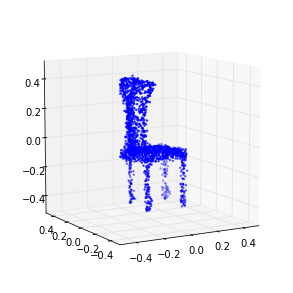

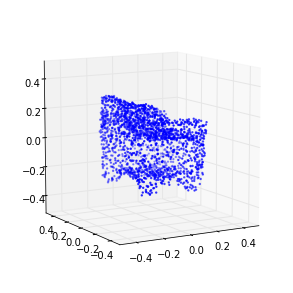

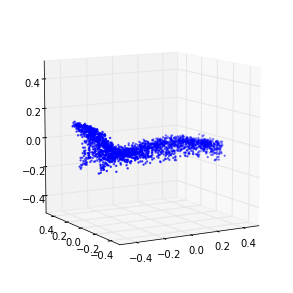

921 (-0.15602204496109928, 0.11992105041389112)
922 (-0.1527567947352374, 0.12426504492759705)
923 (-0.15454121883268709, 0.13132124890883765)
924 (-0.15285105583844361, 0.13450366534568645)
925 (-0.15301717276926394, 0.13685182923520053)
926 (-0.15256940347177012, 0.11959051506386863)
927 (-0.15236726447387977, 0.13117570512824589)
928 (-0.154061000932146, 0.12152654236113583)
929 (-0.15375199566284817, 0.12942486421929467)
930 (-0.15183282417279703, 0.12365598893827862)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-930 is not in all_model_checkpoint_paths. Manually adding it.


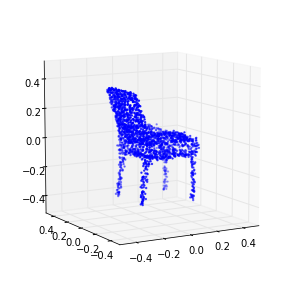

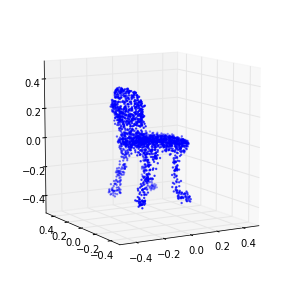

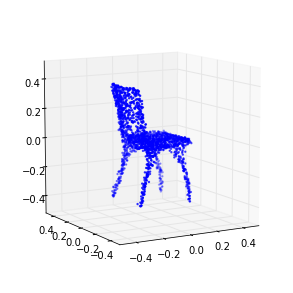

931 (-0.15246195274370689, 0.1154867242331858)
932 (-0.15364539148630918, 0.12523016223201044)
933 (-0.15360788956836419, 0.1160789187307711)
934 (-0.15345455987585915, 0.11614281822133947)
935 (-0.15245151155524783, 0.13090104637322603)
936 (-0.1526533763717722, 0.11577888274634326)
937 (-0.15431208500155696, 0.12317612104945713)
938 (-0.15050322485190851, 0.14055786833718972)
939 (-0.15300352805190617, 0.12101709980655599)
940 (-0.15104035177716502, 0.13555670502009215)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-940 is not in all_model_checkpoint_paths. Manually adding it.


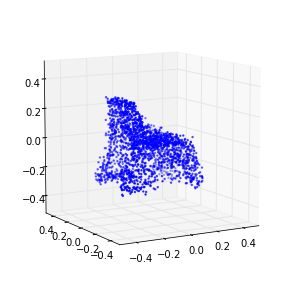

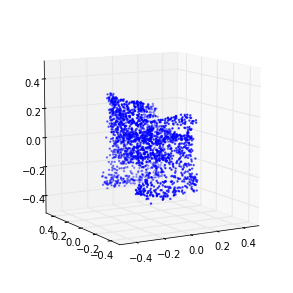

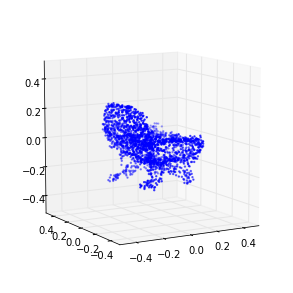

941 (-0.15400295903285344, 0.13441703937671803)
942 (-0.15658171993714792, 0.13107133960282361)
943 (-0.15303900319117086, 0.12784326131697055)
944 (-0.15374374941543298, 0.11936504559384452)
945 (-0.15413293888171514, 0.13219327203653478)
946 (-0.15414679751352028, 0.12766496423217985)
947 (-0.15479445722368029, 0.13443813997286339)
948 (-0.15379318015442955, 0.12870041198200649)
949 (-0.15278908185384893, 0.12399995464969564)
950 (-0.15483871737012156, 0.12263138813001138)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-950 is not in all_model_checkpoint_paths. Manually adding it.


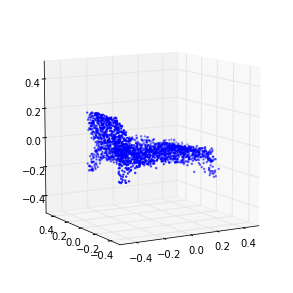

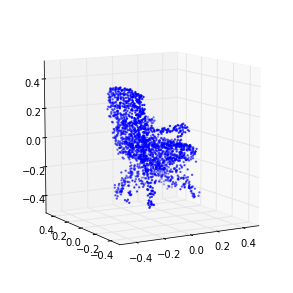

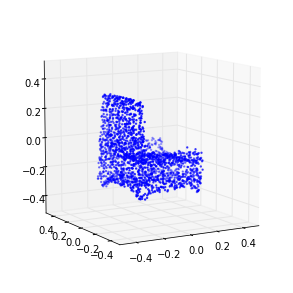

951 (-0.15278305742475723, 0.13178938654837785)
952 (-0.15471169203519822, 0.12964581146284385)
953 (-0.15437657054927614, 0.12888078860662602)
954 (-0.15370477813261527, 0.12777471431979426)
955 (-0.1541004768124333, 0.14242419904028927)
956 (-0.15314095086521573, 0.13758458307495824)
957 (-0.15323179855390831, 0.12970739437474144)
958 (-0.15476422955592473, 0.12581191625860003)
959 (-0.15417180718095214, 0.12776524270022357)
960 (-0.15230487402942444, 0.12766900244686338)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-960 is not in all_model_checkpoint_paths. Manually adding it.


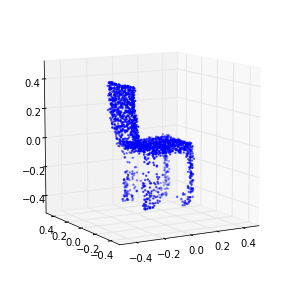

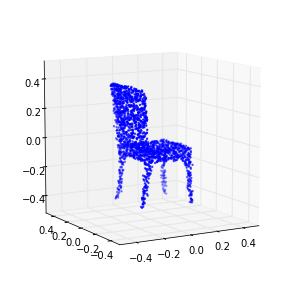

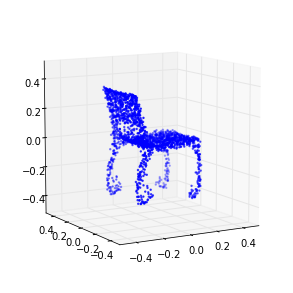

961 (-0.15512460277036386, 0.13708530366420746)
962 (-0.15082579944972638, 0.13231639812390009)
963 (-0.15210207148834512, 0.13061909267195948)
964 (-0.15424468130977065, 0.12697454597111102)
965 (-0.15414743164071329, 0.14106843289401796)
966 (-0.15678971200077621, 0.13878095812267727)
967 (-0.15489019354184469, 0.13100448388744285)
968 (-0.15479380162777723, 0.13500657153350334)
969 (-0.15653262828235273, 0.13477144804265764)
970 (-0.15452400760518181, 0.13898819850550759)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-970 is not in all_model_checkpoint_paths. Manually adding it.


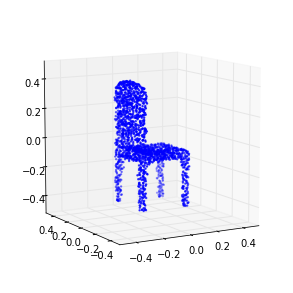

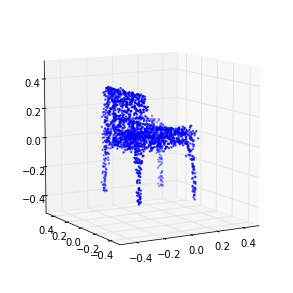

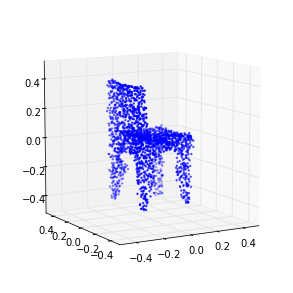

971 (-0.15259189020704339, 0.13185422977915517)
972 (-0.15215201802827694, 0.13162628450879343)
973 (-0.15283787189810363, 0.13205092207149224)
974 (-0.15383641868829728, 0.13528271709327344)
975 (-0.15555301203771874, 0.13150338331858316)
976 (-0.15424020925053844, 0.13611810433643837)
977 (-0.15238702871181348, 0.12182907401411622)
978 (-0.15672733877544051, 0.12296465591148094)
979 (-0.15678838430731384, 0.12422524834120716)
980 (-0.15384974485194242, 0.13356356819470724)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-980 is not in all_model_checkpoint_paths. Manually adding it.


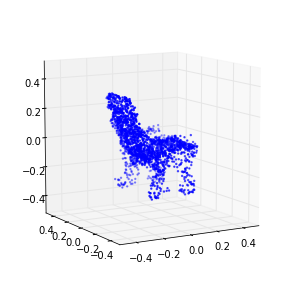

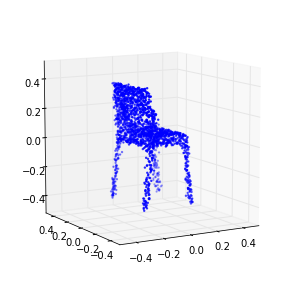

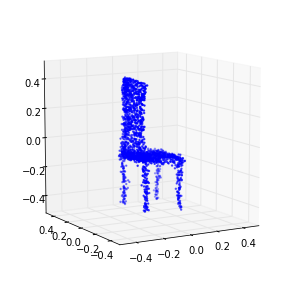

981 (-0.15267035900442688, 0.14451854786387197)
982 (-0.15198054942819808, 0.14150922303950345)
983 (-0.1527565782820737, 0.13399451695106648)
984 (-0.15444542749060525, 0.14698197968580104)
985 (-0.15438714938031303, 0.13550095729253911)
986 (-0.15462725499161967, 0.13447364943998832)
987 (-0.15326321770747503, 0.13274155750318808)
988 (-0.15388463570011987, 0.13079134981941293)
989 (-0.15456330467153478, 0.14242207507292429)
990 (-0.15503404940719959, 0.12385164946317673)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-990 is not in all_model_checkpoint_paths. Manually adding it.


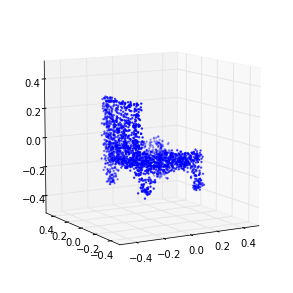

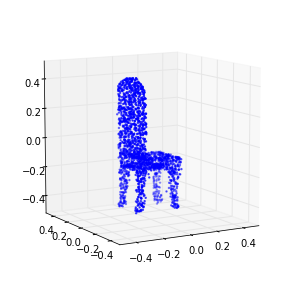

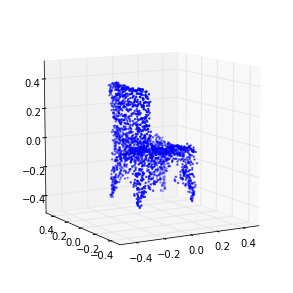

991 (-0.15350814218874331, 0.14283149606651729)
992 (-0.1527700259177773, 0.14022276964452532)
993 (-0.15157280746433471, 0.13671864403618705)
994 (-0.15120171192619536, 0.13995198657115301)
995 (-0.15324781912344473, 0.15067064651736506)
996 (-0.15604427561715797, 0.12807744879413535)
997 (-0.15325866032529761, 0.13842768028930383)
998 (-0.15128497431675594, 0.13669367990008108)
999 (-0.15445256895489162, 0.140689167159575)
1000 (-0.15480755164667412, 0.13092428197463354)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1000 is not in all_model_checkpoint_paths. Manually adding it.


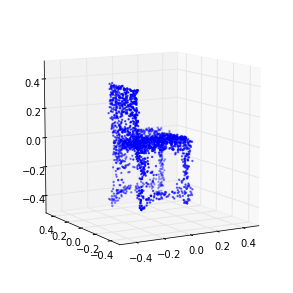

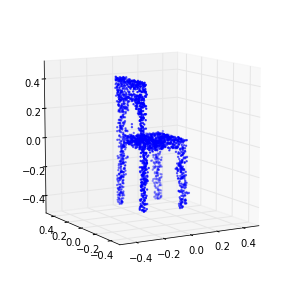

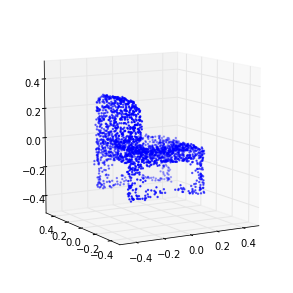

1001 (-0.15412611817872082, 0.13517966066245679)
1002 (-0.15148141444833191, 0.13380983858196824)
1003 (-0.15362321899996864, 0.13607304074146129)
1004 (-0.15536691932766525, 0.13745463335955585)
1005 (-0.15650566689394138, 0.14802231280891984)
1006 (-0.15492580190852837, 0.13734369007525621)
1007 (-0.15400889284080929, 0.155196828422723)
1008 (-0.15257288151317172, 0.14839733529973914)
1009 (-0.15477259567490331, 0.14888214485512841)
1010 (-0.15113528530906747, 0.1544747907254431)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1010 is not in all_model_checkpoint_paths. Manually adding it.


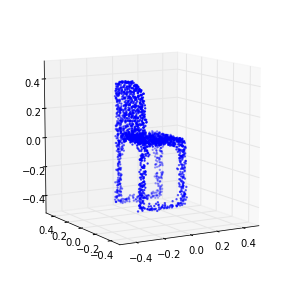

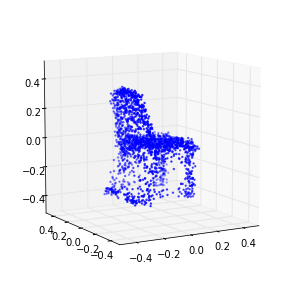

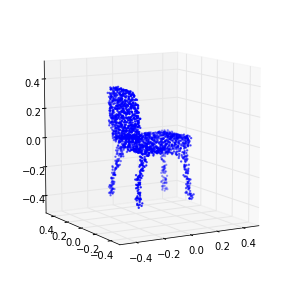

1011 (-0.15457730265679182, 0.13487294564644495)
1012 (-0.15318492446784621, 0.14051757890869071)
1013 (-0.15460143867466186, 0.14639652796365596)
1014 (-0.15523150281773673, 0.14753346117558302)
1015 (-0.1544966725287614, 0.14493994773538024)
1016 (-0.1521648692312064, 0.13527324188638618)
1017 (-0.15351310896652717, 0.1464491304424074)
1018 (-0.15271417349576949, 0.14150987041217308)
1019 (-0.15588284587418591, 0.14660027788745034)
1020 (-0.15615994356296681, 0.14237130405726256)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1020 is not in all_model_checkpoint_paths. Manually adding it.


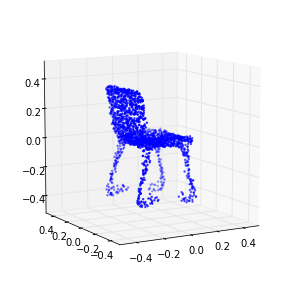

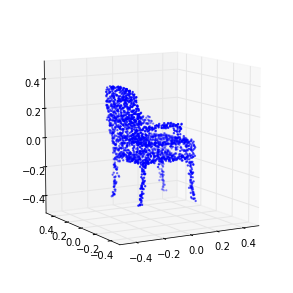

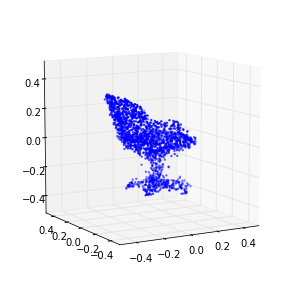

1021 (-0.1552530899643898, 0.14087357896345634)
1022 (-0.1531642030786585, 0.13990047132527386)
1023 (-0.1530586486613309, 0.14863437552143027)
1024 (-0.15340568583320688, 0.13968094824640839)
1025 (-0.15087652725202066, 0.13959192760564662)
1026 (-0.15374566581514146, 0.15084274333936196)
1027 (-0.15414376385785916, 0.14498728265364966)
1028 (-0.15390104259605761, 0.14262876604442243)
1029 (-0.15337423240696943, 0.1405787589373412)
1030 (-0.15272838666483207, 0.14981183464880343)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1030 is not in all_model_checkpoint_paths. Manually adding it.


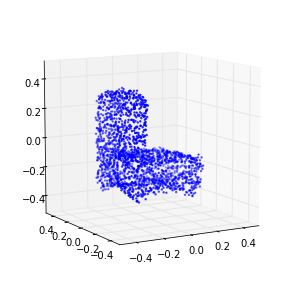

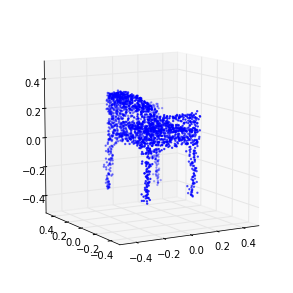

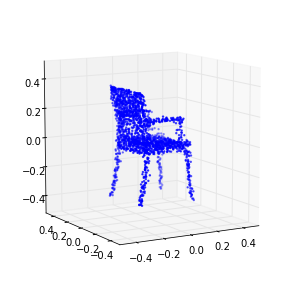

1031 (-0.15434745643977765, 0.13869916371725224)
1032 (-0.15416295445627637, 0.14590682448060424)
1033 (-0.15273266749249564, 0.14889442120437268)
1034 (-0.15202677426514802, 0.14517232223793311)
1035 (-0.15309570635910388, 0.14535376236394601)
1036 (-0.15263383289178212, 0.15281359492628663)
1037 (-0.15665590663750967, 0.14600823985205758)
1038 (-0.15401400046216118, 0.15728423302924191)
1039 (-0.1547821385992898, 0.14331547446824885)
1040 (-0.15315848837296167, 0.15314169062508476)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1040 is not in all_model_checkpoint_paths. Manually adding it.


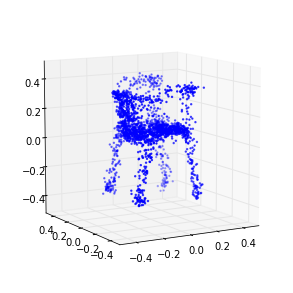

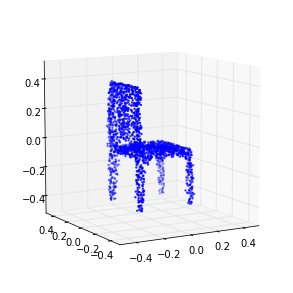

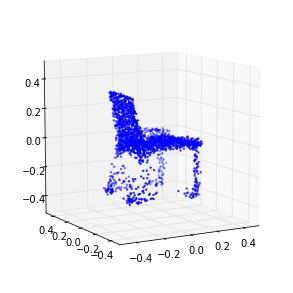

1041 (-0.15364175527184099, 0.15365143616994223)
1042 (-0.15306525887162598, 0.16957031024826896)
1043 (-0.15623142636484569, 0.15587646596961552)
1044 (-0.15831265681319767, 0.14964138192159157)
1045 (-0.15451801717281341, 0.15310036115072392)
1046 (-0.1532970889299004, 0.14997664259539711)
1047 (-0.15206621824591249, 0.16007410155402291)
1048 (-0.1533817184192163, 0.15014923943413627)
1049 (-0.15348028226031196, 0.14482588541728478)
1050 (-0.15276301232752976, 0.15131583230362999)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1050 is not in all_model_checkpoint_paths. Manually adding it.


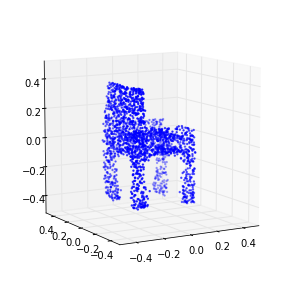

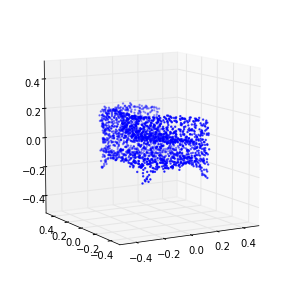

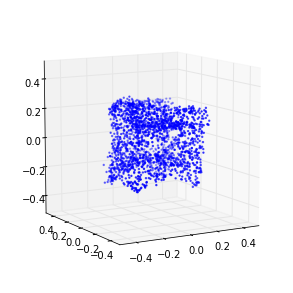

1051 (-0.15490594776692213, 0.15221096851207591)
1052 (-0.15334811619034519, 0.14980319473478529)
1053 (-0.15575816405040246, 0.15472497873836094)
1054 (-0.15540815514546855, 0.14953277811959939)
1055 (-0.15310577468739617, 0.15389255103137758)
1056 (-0.1534450262233063, 0.15235027726049777)
1057 (-0.15508150673574872, 0.15450837435545745)
1058 (-0.15393943339586258, 0.16065403681110452)
1059 (-0.15435767239994472, 0.14843851189922402)
1060 (-0.15348676100925163, 0.16773894098069933)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1060 is not in all_model_checkpoint_paths. Manually adding it.


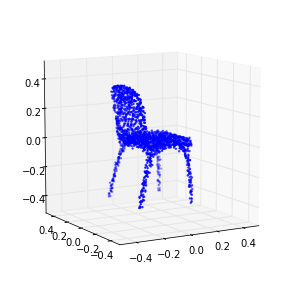

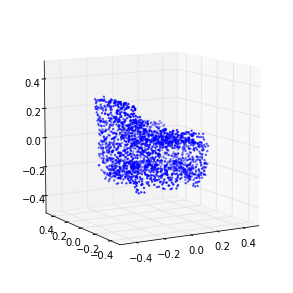

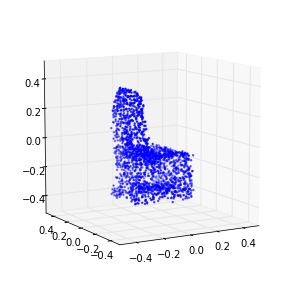

1061 (-0.15687204290319373, 0.15788912386805923)
1062 (-0.15434154503875308, 0.15899497822478967)
1063 (-0.15430579742899647, 0.16353053903138196)
1064 (-0.15180294900028793, 0.16286918796874858)
1065 (-0.15384609439858685, 0.15211421665218142)
1066 (-0.1556536888634717, 0.15425542631634959)
1067 (-0.15603150758478376, 0.15583497975711469)
1068 (-0.15506857732931772, 0.15952762823413918)
1069 (-0.15353345087280981, 0.16662378002096107)
1070 (-0.15801522980133692, 0.14309548586606979)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1070 is not in all_model_checkpoint_paths. Manually adding it.


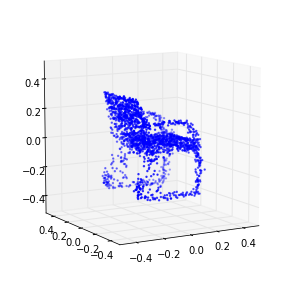

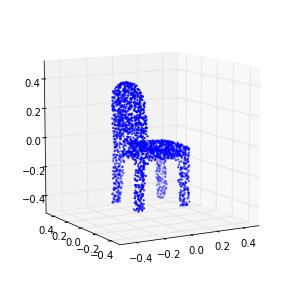

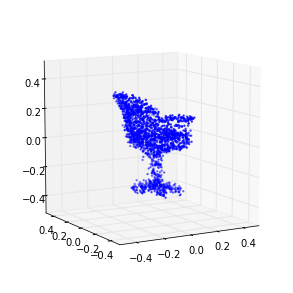

1071 (-0.15358200807262351, 0.15034726896771677)
1072 (-0.15354104610504926, 0.14576267037126753)
1073 (-0.15527379391369997, 0.14513057967027029)
1074 (-0.15276618384652668, 0.15120164829271812)
1075 (-0.15423748531827219, 0.14708939415437203)
1076 (-0.1530641222441638, 0.167637230069549)
1077 (-0.15545840412378312, 0.1670131755095941)
1078 (-0.15570214810194793, 0.15800353443181073)
1079 (-0.1550912281981221, 0.16099475710480302)
1080 (-0.15458177819296165, 0.15006991668983741)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1080 is not in all_model_checkpoint_paths. Manually adding it.


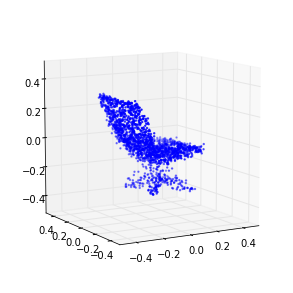

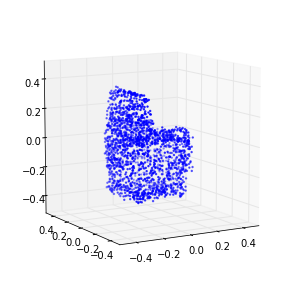

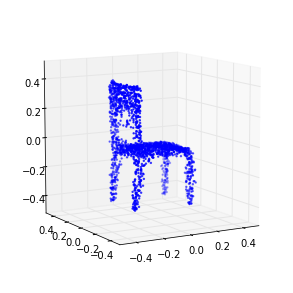

1081 (-0.15300016463906677, 0.16289560331238639)
1082 (-0.15667791040959181, 0.15871819743403681)
1083 (-0.15306956039534675, 0.15923368848032421)
1084 (-0.15367668375924781, 0.14910375326871872)
1085 (-0.1542075135089733, 0.15900041742457283)
1086 (-0.15292591745102846, 0.15602262952813395)
1087 (-0.15275812789245888, 0.15530975714877801)
1088 (-0.15247119317452112, 0.15557994334786027)
1089 (-0.15535697898379078, 0.16157441779419227)
1090 (-0.15357004806951241, 0.16267853837322305)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1090 is not in all_model_checkpoint_paths. Manually adding it.


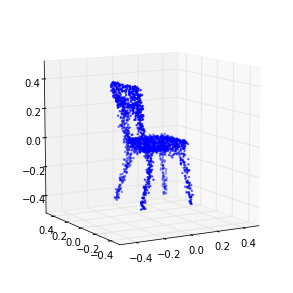

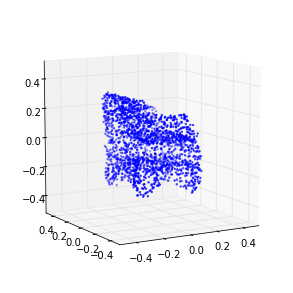

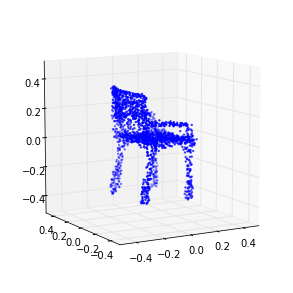

1091 (-0.15632674175280112, 0.15321907621842842)
1092 (-0.15501639705013345, 0.16667224301232231)
1093 (-0.1536626328472738, 0.15340531451834571)
1094 (-0.15568837015717119, 0.17300468131347937)
1095 (-0.15231707570729433, 0.16258872714307573)
1096 (-0.15352844016419517, 0.16562926576093392)
1097 (-0.15150802003012764, 0.16309926796842505)
1098 (-0.15348018225696353, 0.16422541135991062)
1099 (-0.1554253477189276, 0.15921653227673638)
1100 (-0.1543222094575564, 0.17338606660012845)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1100 is not in all_model_checkpoint_paths. Manually adding it.


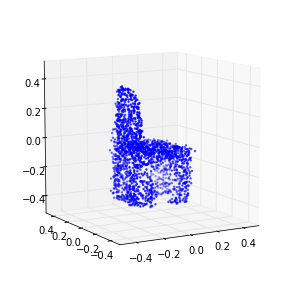

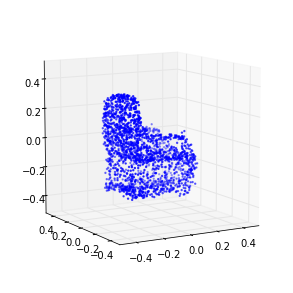

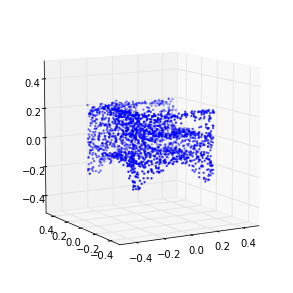

1101 (-0.15519291537779348, 0.15914111501640743)
1102 (-0.15511773228645326, 0.15592759985614707)
1103 (-0.15190946128633287, 0.16822886853306382)
1104 (-0.15191614307739115, 0.15599457146944823)
1105 (-0.1545274359760461, 0.15253250466452706)
1106 (-0.1528552238036085, 0.16308298155113501)
1107 (-0.15549344928176315, 0.16018048121973319)
1108 (-0.15310169027911291, 0.16910859804462502)
1109 (-0.15637762469274027, 0.16662434129803269)
1110 (-0.15031577906122914, 0.16882079067053618)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1110 is not in all_model_checkpoint_paths. Manually adding it.


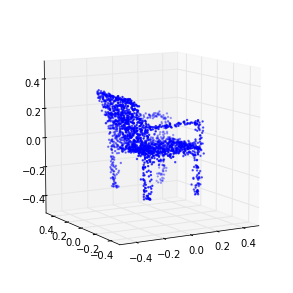

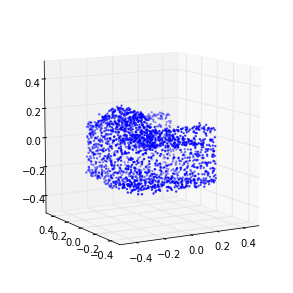

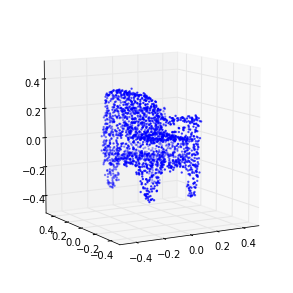

1111 (-0.15414691821292595, 0.1656668417983585)
1112 (-0.15659671265769887, 0.16358377149811498)
1113 (-0.1554265312022633, 0.15528252831211797)
1114 (-0.15317462804140869, 0.14924108209433379)
1115 (-0.15360314073386017, 0.15630314692302985)
1116 (-0.15582009840894628, 0.16444685668857009)
1117 (-0.15631875644127527, 0.17374582588672638)
1118 (-0.15491464872051169, 0.16180083679932136)
1119 (-0.15225743314734211, 0.17023023742216606)
1120 (-0.15397979291500868, 0.16497597070755782)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1120 is not in all_model_checkpoint_paths. Manually adding it.


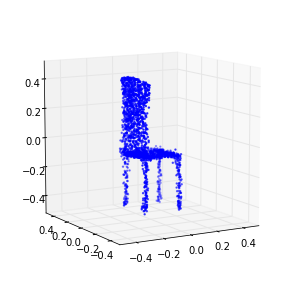

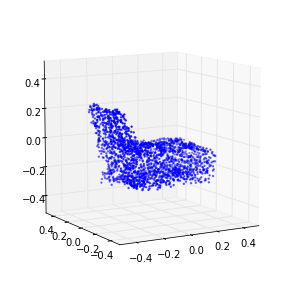

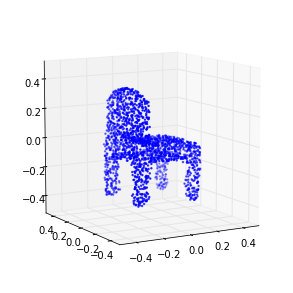

1121 (-0.15387666264065988, 0.15254736940066019)
1122 (-0.15502159772095858, 0.15931965300330408)
1123 (-0.15371492753426233, 0.1597451901546231)
1124 (-0.1536862250831392, 0.15913018584251404)
1125 (-0.15800575155902791, 0.16136902653508717)
1126 (-0.15417553925955738, 0.15947435465123919)
1127 (-0.15103781449574011, 0.16686859561337364)
1128 (-0.15756534360073232, 0.16127144214179781)
1129 (-0.1526782716313998, 0.15740028354856703)
1130 (-0.15345836237624841, 0.16305153789343657)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1130 is not in all_model_checkpoint_paths. Manually adding it.


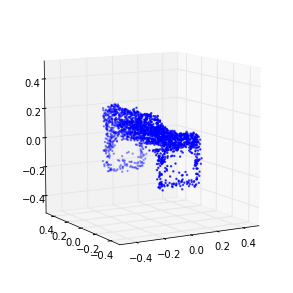

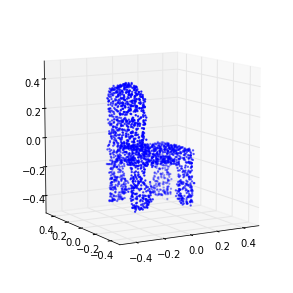

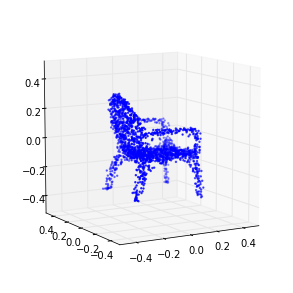

1131 (-0.15188584289065113, 0.17000850096896844)
1132 (-0.15591492073403465, 0.16220448635242604)
1133 (-0.15333761777038926, 0.16084234444079576)
1134 (-0.1535738617181778, 0.1591765096894017)
1135 (-0.15358372496234046, 0.16996040553958328)
1136 (-0.15441446282245494, 0.16243969676671205)
1137 (-0.1548671242815477, 0.16018593808015189)
1138 (-0.15575605117612415, 0.16668010420269436)
1139 (-0.15419287681579591, 0.1724912256554321)
1140 (-0.15383711871173647, 0.14970111129460512)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1140 is not in all_model_checkpoint_paths. Manually adding it.


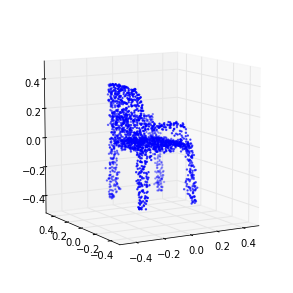

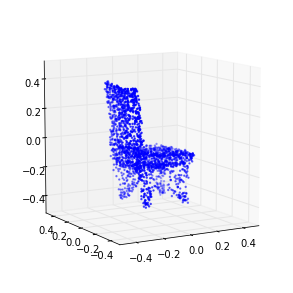

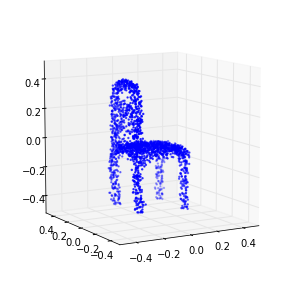

1141 (-0.15440048779602403, 0.17357422411441803)
1142 (-0.15202201753854752, 0.17402619620164236)
1143 (-0.15577362417070953, 0.16439020909644939)
1144 (-0.15599626148188556, 0.17213052621594183)
1145 (-0.15322416982165091, 0.17684592141045463)
1146 (-0.15468624140377399, 0.16769911514388192)
1147 (-0.1542364803729234, 0.16406768284462117)
1148 (-0.15536097139120103, 0.16272760624134983)
1149 (-0.1550868433382776, 0.16244688547319835)
1150 (-0.15274855097134907, 0.16721449295679727)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1150 is not in all_model_checkpoint_paths. Manually adding it.


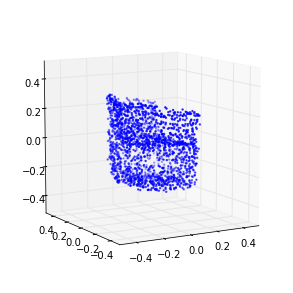

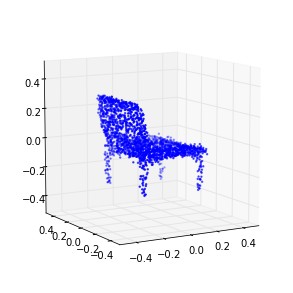

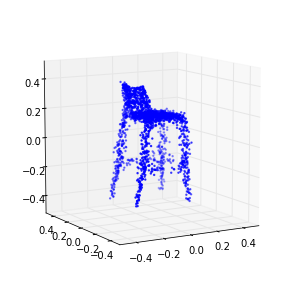

1151 (-0.15319146337332548, 0.16560310649651069)
1152 (-0.15564962454416134, 0.15214999489210271)
1153 (-0.15654276465928113, 0.16214525258099591)
1154 (-0.15304259834466158, 0.17493509694381995)
1155 (-0.15573897229300604, 0.16761812484926647)
1156 (-0.15315424126607399, 0.17419790780102765)
1157 (-0.1553313488761584, 0.1600582847992579)
1158 (-0.15423487055080909, 0.16877313730893312)
1159 (-0.15263539580283342, 0.15977350208494398)
1160 (-0.1538173234021222, 0.16565317660570145)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1160 is not in all_model_checkpoint_paths. Manually adding it.


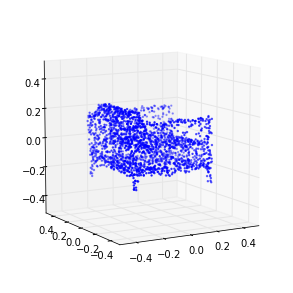

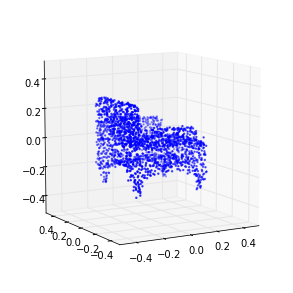

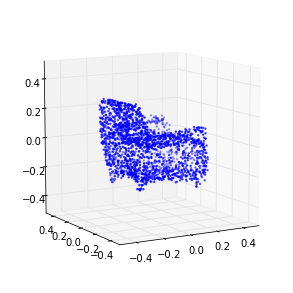

1161 (-0.15492525801614479, 0.17279908888869816)
1162 (-0.15350392665024157, 0.16931661190810027)
1163 (-0.15508244545371444, 0.16878619734887723)
1164 (-0.15291411087468817, 0.17266152523182057)
1165 (-0.1531660513193519, 0.16727841121179085)
1166 (-0.15537388782810282, 0.16383214736426319)
1167 (-0.15634749570378551, 0.16063125210779686)
1168 (-0.15430487112866509, 0.18279113372166952)
1169 (-0.15583527468972735, 0.173903559645017)
1170 (-0.15374311688873504, 0.16596522430578867)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1170 is not in all_model_checkpoint_paths. Manually adding it.


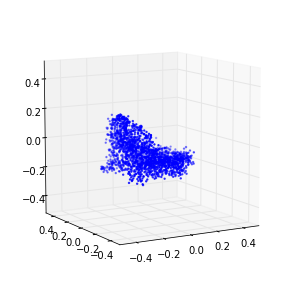

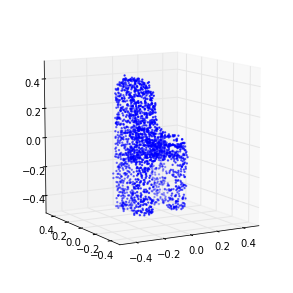

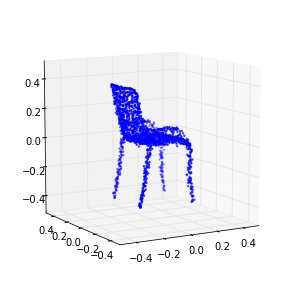

1171 (-0.15352049028431927, 0.16520305998899318)
1172 (-0.15402715868420072, 0.17108007437653011)
1173 (-0.15358365288487189, 0.16625625115853768)
1174 (-0.15387905963041165, 0.1616840108677193)
1175 (-0.15464455976530359, 0.17146521144443089)
1176 (-0.15361186161085411, 0.17754312577071013)
1177 (-0.15399264417312764, 0.16709566723417352)
1178 (-0.15285070902771419, 0.17230234488292975)
1179 (-0.15656097696887122, 0.17953974808807727)
1180 (-0.15220582446566336, 0.16621717037977995)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1180 is not in all_model_checkpoint_paths. Manually adding it.


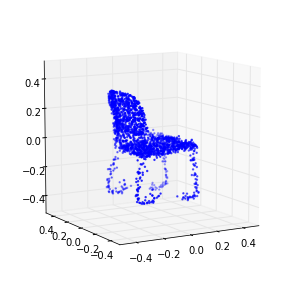

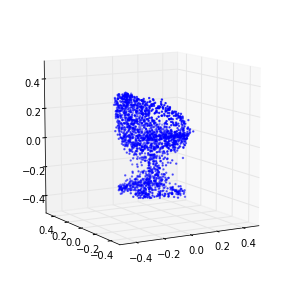

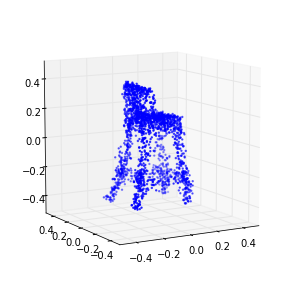

1181 (-0.15230354876429947, 0.1657735636388814)
1182 (-0.15524322484378461, 0.17234684416541346)
1183 (-0.15560774124330945, 0.18249313257358693)
1184 (-0.15429157984477501, 0.17290004811905049)
1185 (-0.15275799703818779, 0.17328925734316861)
1186 (-0.15356323001561342, 0.17086031315503297)
1187 (-0.15158160913873603, 0.16608269291895408)
1188 (-0.15645143588383992, 0.16588685247633192)
1189 (-0.15393667944051601, 0.17716309262646568)
1190 (-0.15658414363861084, 0.18081149017369305)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1190 is not in all_model_checkpoint_paths. Manually adding it.


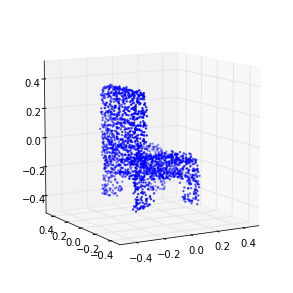

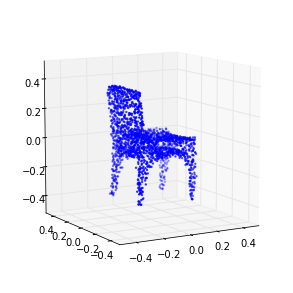

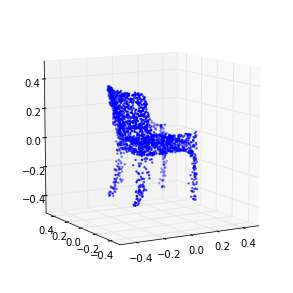

1191 (-0.15303477838083548, 0.16898177674523107)
1192 (-0.15293101370334625, 0.18194450327643641)
1193 (-0.15587201747629378, 0.18254799809720781)
1194 (-0.15482700776170802, 0.18035192622078788)
1195 (-0.15218303526441257, 0.17004998469794239)
1196 (-0.15638425101836523, 0.17354929943879446)
1197 (-0.15621625173974921, 0.16778436689465134)
1198 (-0.15529191019358457, 0.16620150374041665)
1199 (-0.15542311751180224, 0.16363832547708793)
1200 (-0.15320743824596758, 0.17899049763326291)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1200 is not in all_model_checkpoint_paths. Manually adding it.


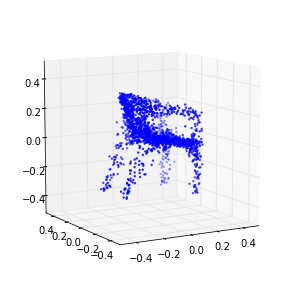

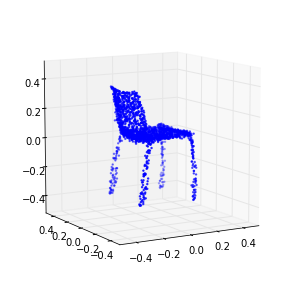

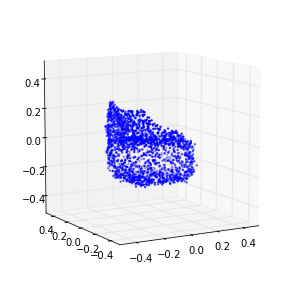

1201 (-0.15540751660311664, 0.16505041828861944)
1202 (-0.15449664526515536, 0.17402432969322912)
1203 (-0.15481977137150588, 0.1761211046466121)
1204 (-0.15371585184777226, 0.16960076159901089)
1205 (-0.15394345924810127, 0.17741584336316144)
1206 (-0.15636480456149138, 0.16970033667705678)
1207 (-0.15367515716287825, 0.17609748078717125)
1208 (-0.15537296599811978, 0.17135951309292405)
1209 (-0.15411679816466792, 0.18495898279878828)
1210 (-0.15569788123722431, 0.1737931459038346)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1210 is not in all_model_checkpoint_paths. Manually adding it.


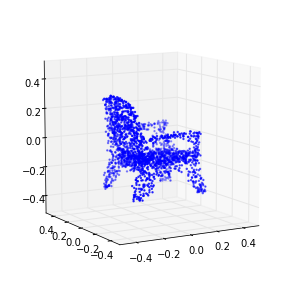

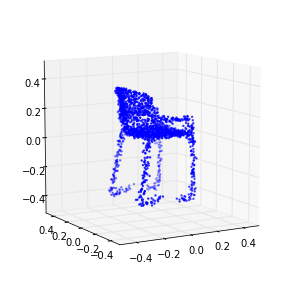

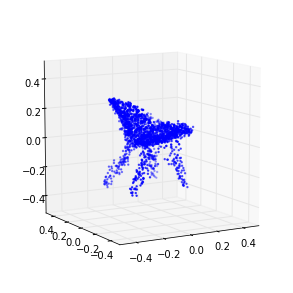

1211 (-0.1571989866870421, 0.17094257446350875)
1212 (-0.15537236564689214, 0.17927445692044716)
1213 (-0.15745217954670943, 0.18550443262965591)
1214 (-0.15693796304640947, 0.1828589599441599)
1215 (-0.15369547020505975, 0.17870602398007004)
1216 (-0.15560358381933637, 0.1647245412071546)
1217 (-0.15617311812109416, 0.16862266317561822)
1218 (-0.15473612745602924, 0.17974451515409681)
1219 (-0.15623485760556327, 0.17550982700453865)
1220 (-0.15506865547762977, 0.17785691497502504)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1220 is not in all_model_checkpoint_paths. Manually adding it.


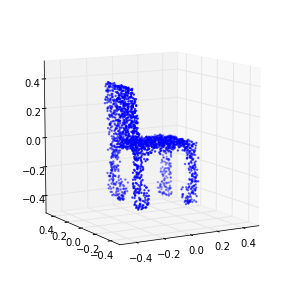

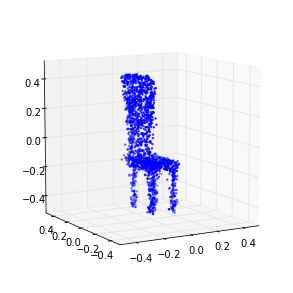

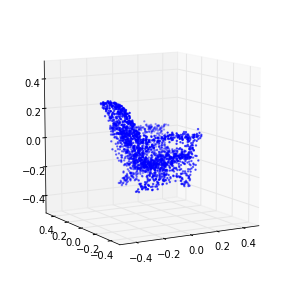

1221 (-0.15384943882624308, 0.17219025227758619)
1222 (-0.15613430313490057, 0.17689992763378001)
1223 (-0.15541241869882302, 0.18138708284607641)
1224 (-0.15552372286717098, 0.18379926405571126)
1225 (-0.15480087360850087, 0.18327024192721755)
1226 (-0.15666050519104358, 0.17437404780476182)
1227 (-0.1546050904525651, 0.1857463507740586)
1228 (-0.15312149237703393, 0.17305277674286454)
1229 (-0.1561896695582955, 0.18021374775303733)
1230 (-0.15625942923404551, 0.18466968061747374)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1230 is not in all_model_checkpoint_paths. Manually adding it.


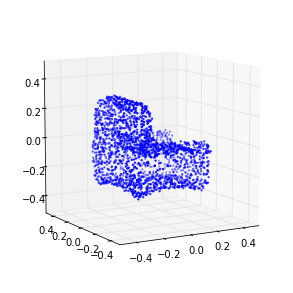

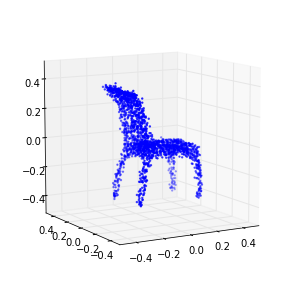

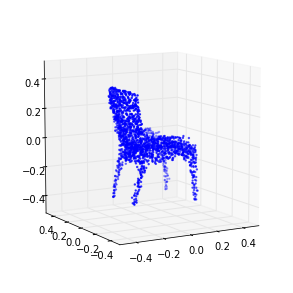

1231 (-0.1561937870250808, 0.18299478182086237)
1232 (-0.15501567677215294, 0.18092849657491403)
1233 (-0.156356735141189, 0.16707763848481355)
1234 (-0.15343551922727514, 0.17668691277503967)
1235 (-0.15513045605685977, 0.1750548509535966)
1236 (-0.154570037678436, 0.18501310988708777)
1237 (-0.15558811304745851, 0.18388749824629891)
1238 (-0.15426272302865982, 0.17537432688253898)
1239 (-0.15501979462526463, 0.18051691850026449)
1240 (-0.15421331530367888, 0.1770985534897557)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1240 is not in all_model_checkpoint_paths. Manually adding it.


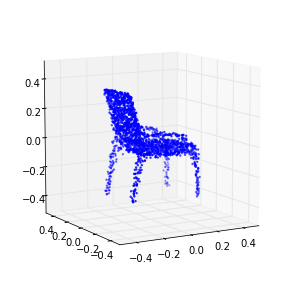

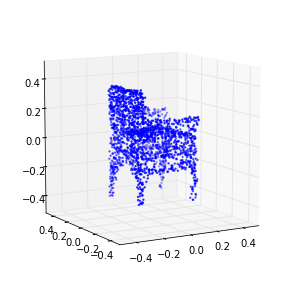

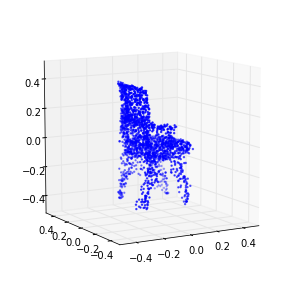

1241 (-0.15587648638972529, 0.18088451469386066)
1242 (-0.15562675611840354, 0.17844421664873758)
1243 (-0.15416974016913662, 0.18350939894164051)
1244 (-0.15633727488694368, 0.18593451270350703)
1245 (-0.15562817641982327, 0.17813396481452165)
1246 (-0.15256562795903947, 0.17619855591544398)
1247 (-0.15360621103533992, 0.18759814842983527)
1248 (-0.15539438227812449, 0.17038807493669014)
1249 (-0.15411546947779478, 0.17855226165718502)
1250 (-0.15493619773122999, 0.16422841284010145)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1250 is not in all_model_checkpoint_paths. Manually adding it.


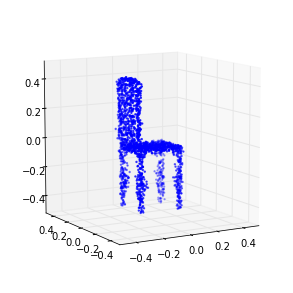

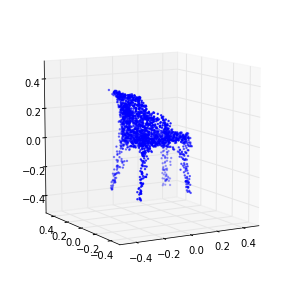

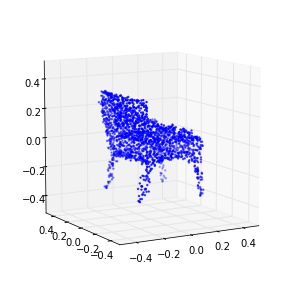

1251 (-0.15704525963023858, 0.1773805105023914)
1252 (-0.15471983579573809, 0.18470739490456051)
1253 (-0.15637903621903174, 0.17893918300116504)
1254 (-0.15585215985774994, 0.16984966286906489)
1255 (-0.15333897438314226, 0.17772647904025185)
1256 (-0.15500665892053533, 0.17532479100757176)
1257 (-0.15393675074533181, 0.18037447609283305)
1258 (-0.15128874099916881, 0.17657830980088976)
1259 (-0.15340200033452775, 0.17968350207364117)
1260 (-0.15293989617515494, 0.18127197523911795)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1260 is not in all_model_checkpoint_paths. Manually adding it.


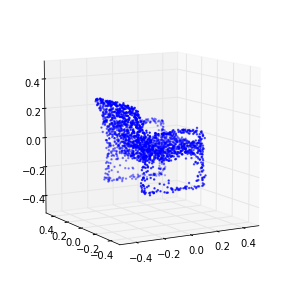

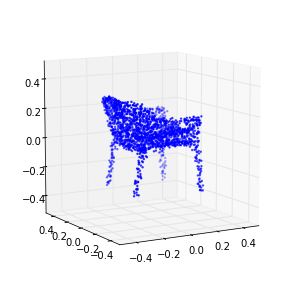

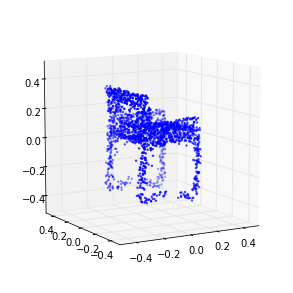

1261 (-0.15317948946246393, 0.17850492121996703)
1262 (-0.15239947322342132, 0.17925945476249414)
1263 (-0.15568916118807263, 0.17706943579294063)
1264 (-0.15602710953465215, 0.17738014404420499)
1265 (-0.15563524387500904, 0.16962655882040659)
1266 (-0.15653161185759085, 0.1822361890916471)
1267 (-0.15320440701864385, 0.17713472578260633)
1268 (-0.15599091455892281, 0.18433235696068517)
1269 (-0.15475361402387972, 0.17756068209807077)
1270 (-0.15584417140042339, 0.17862423812901532)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1270 is not in all_model_checkpoint_paths. Manually adding it.


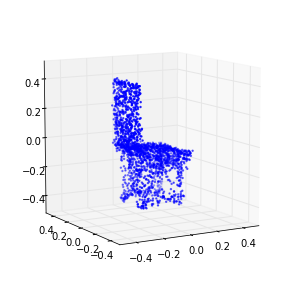

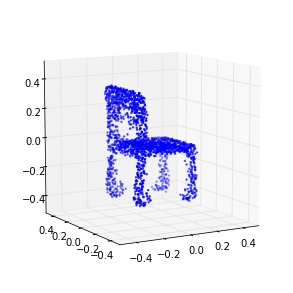

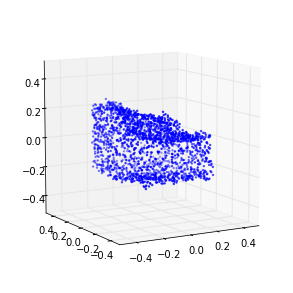

1271 (-0.1547059910164939, 0.17227242666262169)
1272 (-0.15570367685070743, 0.1697508234668661)
1273 (-0.15330602267274149, 0.18629324988082605)
1274 (-0.15507689637166483, 0.18008491231335533)
1275 (-0.15597581261837923, 0.18388714392979941)
1276 (-0.15658182816372979, 0.18965374098883736)
1277 (-0.1562683544225163, 0.17447804411252341)
1278 (-0.15394948908576259, 0.17923686846538825)
1279 (-0.15352418488926359, 0.18448837542975391)
1280 (-0.15562783286527351, 0.17682694340193714)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1280 is not in all_model_checkpoint_paths. Manually adding it.


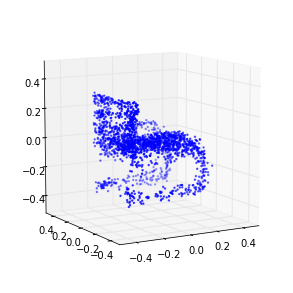

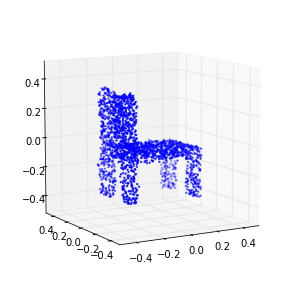

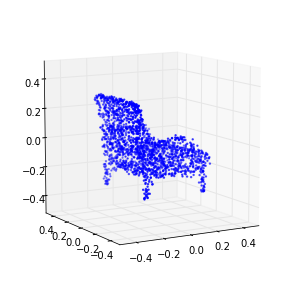

1281 (-0.15321963606057343, 0.18632131759767179)
1282 (-0.15506272205600033, 0.1753046523641657)
1283 (-0.15626993769848788, 0.18654595922540734)
1284 (-0.15417726012291733, 0.16591816257547448)
1285 (-0.15558437738153669, 0.17510481620276416)
1286 (-0.15411045054594677, 0.17065489788850149)
1287 (-0.15260140752350843, 0.18589397381853173)
1288 (-0.1568523605664571, 0.16612605695371274)
1289 (-0.15413639252936398, 0.17442792985174391)
1290 (-0.15603529016176859, 0.17450564934147728)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1290 is not in all_model_checkpoint_paths. Manually adding it.


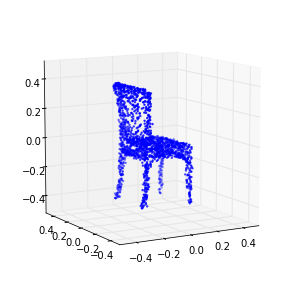

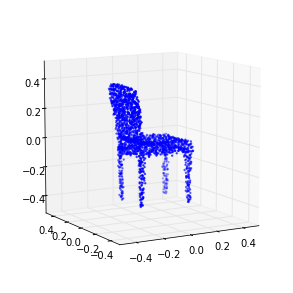

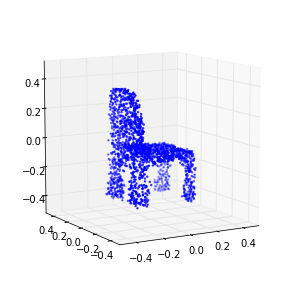

1291 (-0.15355778684218724, 0.18062928594924785)
1292 (-0.15634574558999803, 0.17038217849201626)
1293 (-0.1541278764605522, 0.17568240783832692)
1294 (-0.15452869495859853, 0.1748919630492175)
1295 (-0.15363028336454321, 0.18110740791868279)
1296 (-0.15518175512552262, 0.18224988657015342)
1297 (-0.15348315448672684, 0.17219163753368236)
1298 (-0.15489674105688378, 0.1812952729286971)
1299 (-0.15918058223194545, 0.16224627058815072)
1300 (-0.15648802513325655, 0.1766355092878695)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1300 is not in all_model_checkpoint_paths. Manually adding it.


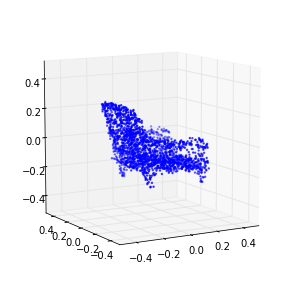

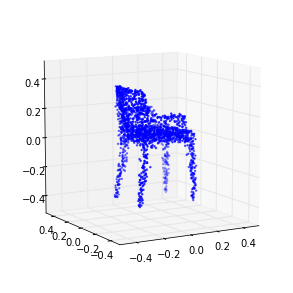

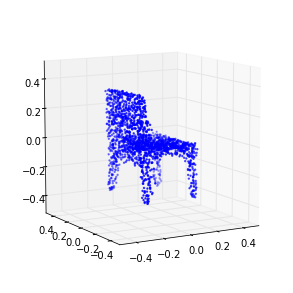

1301 (-0.15500646029357557, 0.17571311195691428)
1302 (-0.15440834501275311, 0.17915792156148841)
1303 (-0.15693636580749795, 0.17739717000060612)
1304 (-0.15566199468793693, 0.19006598050947543)
1305 (-0.15235189376053987, 0.19633671255023391)
1306 (-0.15190976278649437, 0.17541775769657558)
1307 (-0.15507264302836524, 0.1849075064614967)
1308 (-0.15467076417472628, 0.176204616272891)
1309 (-0.15344281047582625, 0.18576483428478241)
1310 (-0.1556360462197551, 0.17750262496648012)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1310 is not in all_model_checkpoint_paths. Manually adding it.


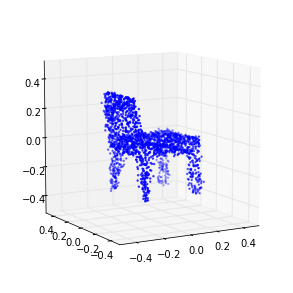

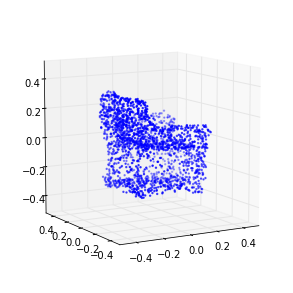

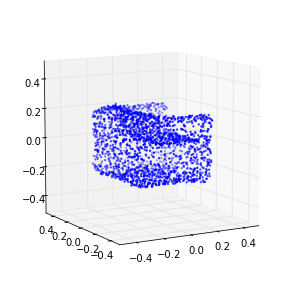

1311 (-0.1567448196587739, 0.17984104598010028)
1312 (-0.15374819564598577, 0.18578750722938114)
1313 (-0.1559295160902871, 0.17001506962158061)
1314 (-0.15767612545578569, 0.18093581552858706)
1315 (-0.15908791555298699, 0.17221760970574837)
1316 (-0.15273540660187049, 0.18345108904220439)
1317 (-0.15236255962539602, 0.18238790664407942)
1318 (-0.15379585734120121, 0.18387766237612124)
1319 (-0.15414352588079594, 0.18013352983527714)
1320 (-0.15588323385627181, 0.18429946568277147)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1320 is not in all_model_checkpoint_paths. Manually adding it.


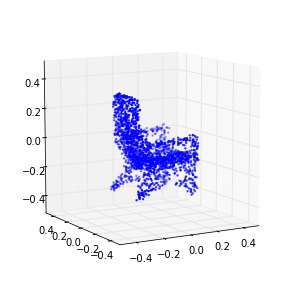

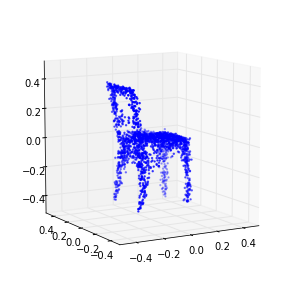

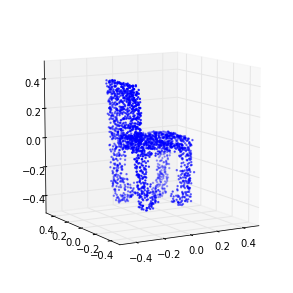

1321 (-0.15544140096063966, 0.1850312407369967)
1322 (-0.15662771667595263, 0.17520133543897559)
1323 (-0.1513892032482006, 0.17704920967419943)
1324 (-0.15456394448324487, 0.17220536812588019)
1325 (-0.15464560593719837, 0.18857344377923896)
1326 (-0.15687129928006066, 0.18339337794869034)
1327 (-0.15659471816486784, 0.17387632915267237)
1328 (-0.15654560945652149, 0.18527417216036055)
1329 (-0.15407094701572702, 0.18430302485271735)
1330 (-0.15602438648541769, 0.17668451037671831)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1330 is not in all_model_checkpoint_paths. Manually adding it.


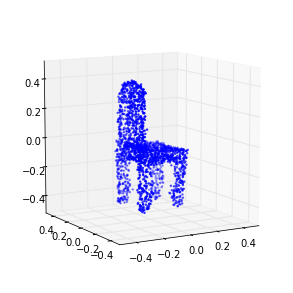

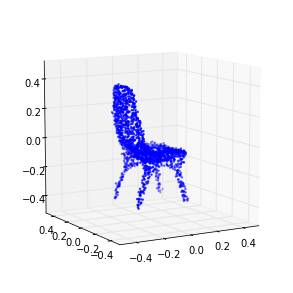

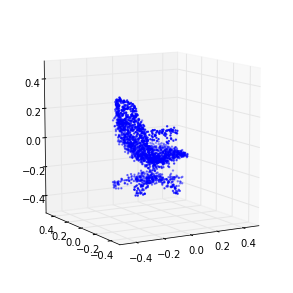

1331 (-0.15826253234236329, 0.18443767119337012)
1332 (-0.15384931713342667, 0.17387786507606506)
1333 (-0.15624221292910753, 0.17517503212999413)
1334 (-0.15644139956544947, 0.18327510191334617)
1335 (-0.15638291096245802, 0.1865176530899825)
1336 (-0.15597652114099927, 0.17628144666000647)
1337 (-0.15647687702267257, 0.18439968868538184)
1338 (-0.15702264849786404, 0.17727804901423277)
1339 (-0.15668334287625771, 0.1878013014793396)
1340 (-0.15483966000654079, 0.18314268936713538)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1340 is not in all_model_checkpoint_paths. Manually adding it.


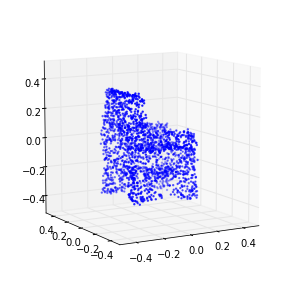

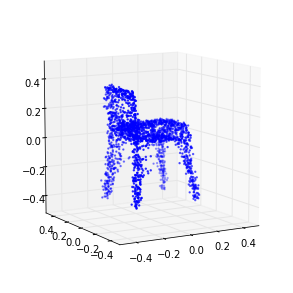

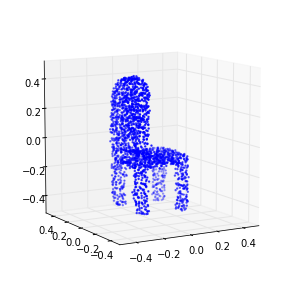

1341 (-0.15575004424209948, 0.18252923808715962)
1342 (-0.15619943186088844, 0.18153353670129069)
1343 (-0.15535452205825734, 0.18509659888567748)
1344 (-0.15867769309767971, 0.18569707373778024)
1345 (-0.15661495068558939, 0.18555252695525135)
1346 (-0.15570965867351602, 0.19768444365925258)
1347 (-0.15672939761921212, 0.17900578125759406)
1348 (-0.15524133537654525, 0.18606110082732308)
1349 (-0.15504826842634767, 0.16346913796884041)
1350 (-0.15498050881756675, 0.18384815586937797)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1350 is not in all_model_checkpoint_paths. Manually adding it.


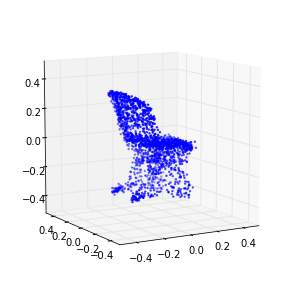

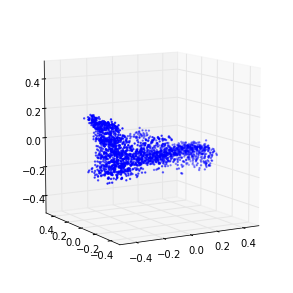

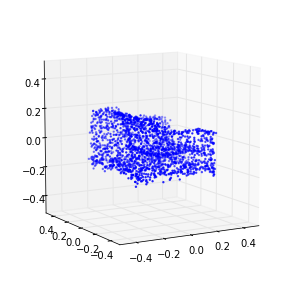

1351 (-0.15679718598171516, 0.19421601957745022)
1352 (-0.15477148570396282, 0.18102839589118958)
1353 (-0.15677783301583043, 0.1739794909954071)
1354 (-0.15609154447361276, 0.19762502389925499)
1355 (-0.15401466339826583, 0.18346832251107251)
1356 (-0.15517301355247146, 0.18654160367117989)
1357 (-0.15577341312611545, 0.19276090738949953)
1358 (-0.15417337969497399, 0.18991965662550042)
1359 (-0.15686360558977833, 0.17817110816637674)
1360 (-0.15690649681621127, 0.18568570580747393)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1360 is not in all_model_checkpoint_paths. Manually adding it.


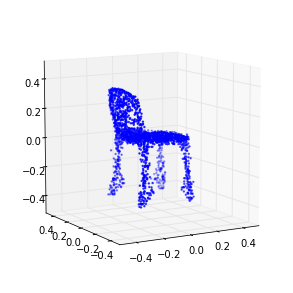

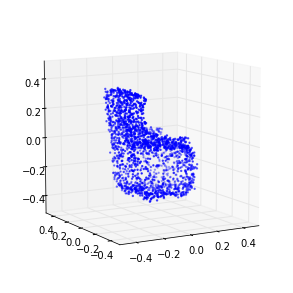

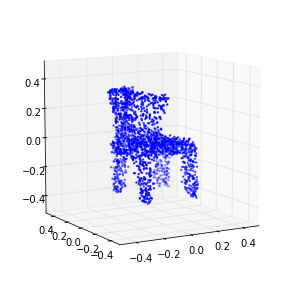

1361 (-0.15323334231420799, 0.18103241975660678)
1362 (-0.15591614323633687, 0.18574864003393385)
1363 (-0.15360315635248467, 0.18486863816225971)
1364 (-0.15445226795143552, 0.18537478645642599)
1365 (-0.15433826120915237, 0.18154958221647474)
1366 (-0.15400143944554859, 0.1872790097086518)
1367 (-0.15830582264396881, 0.18876021934880149)
1368 (-0.15676817805678755, 0.1836761087179184)
1369 (-0.1567534273421323, 0.18321212574287696)
1370 (-0.15550971825917562, 0.18025125342386741)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1370 is not in all_model_checkpoint_paths. Manually adding it.


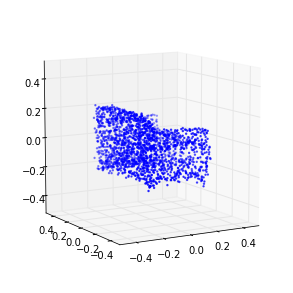

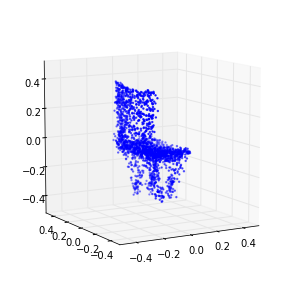

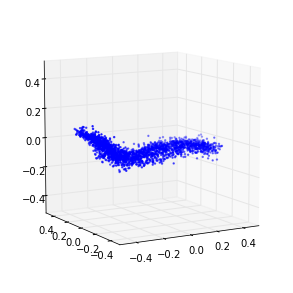

1371 (-0.15604455978782089, 0.19007031895496226)
1372 (-0.15848017864757113, 0.18101927969190809)
1373 (-0.1542153854061056, 0.18921354192274589)
1374 (-0.15414605996123068, 0.17962543721552249)
1375 (-0.15820104016198053, 0.17693853930190759)
1376 (-0.15617608284508741, 0.17841520298410346)
1377 (-0.15788328780068292, 0.1746420865809476)
1378 (-0.15667439263176036, 0.18732150009384863)
1379 (-0.15611969376051868, 0.17935316375008337)
1380 (-0.15549741442556733, 0.18405087181815394)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1380 is not in all_model_checkpoint_paths. Manually adding it.


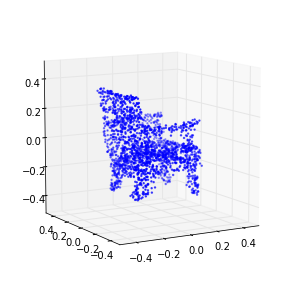

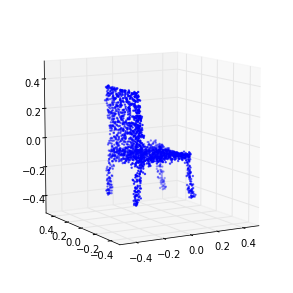

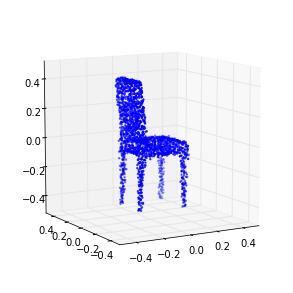

1381 (-0.15504000380083366, 0.18306401261576899)
1382 (-0.15746536481159704, 0.1737149280530435)
1383 (-0.15679625515584591, 0.17478306977837174)
1384 (-0.15977095365524291, 0.18805632326338026)
1385 (-0.15553492456674575, 0.18585399621062809)
1386 (-0.15556599889640454, 0.1884279560159754)
1387 (-0.15214454012888448, 0.17931800583998361)
1388 (-0.15743651765364189, 0.18340557261749549)
1389 (-0.15644477936956619, 0.18733333603099542)
1390 (-0.15571121634156615, 0.18487605507727023)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1390 is not in all_model_checkpoint_paths. Manually adding it.


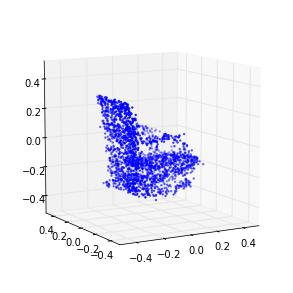

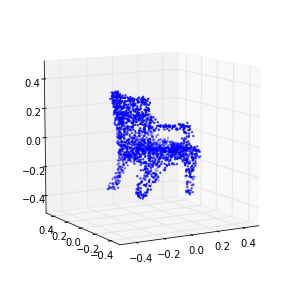

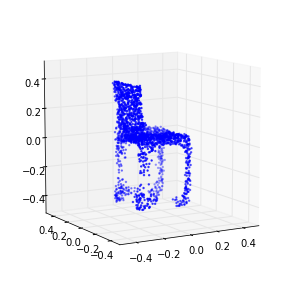

1391 (-0.15819139005961241, 0.18594161062328904)
1392 (-0.15646708066816684, 0.17902306053373548)
1393 (-0.1556832131964189, 0.18967200429351241)
1394 (-0.15494914617803363, 0.1863025145398246)
1395 (-0.15456938031646941, 0.1844320015774833)
1396 (-0.154571317853751, 0.18540577866412974)
1397 (-0.15476589390525111, 0.19269196799507848)
1398 (-0.15486674231511574, 0.19400645516536855)
1399 (-0.15560727384355333, 0.19393167120439034)
1400 (-0.15275519617177821, 0.18467780064653466)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1400 is not in all_model_checkpoint_paths. Manually adding it.


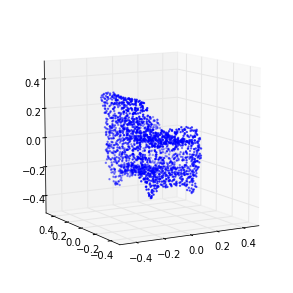

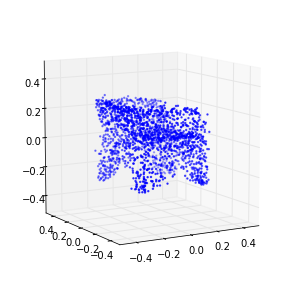

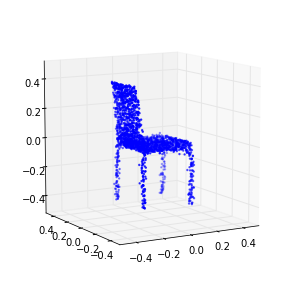

1401 (-0.15581777454526335, 0.18972862594657475)
1402 (-0.15467675361368391, 0.19760806582592153)
1403 (-0.15792804316238121, 0.18282389585618619)
1404 (-0.15620291150278515, 0.1783854001098209)
1405 (-0.15486248240426734, 0.18755443780510514)
1406 (-0.15445181898496768, 0.18569340363696771)
1407 (-0.15404827511972852, 0.17608423917381852)
1408 (-0.15735622920371867, 0.18087945271421363)
1409 (-0.1556015368964937, 0.19744989938206142)
1410 (-0.15761520801870912, 0.18626723024580213)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1410 is not in all_model_checkpoint_paths. Manually adding it.


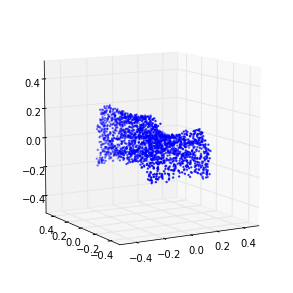

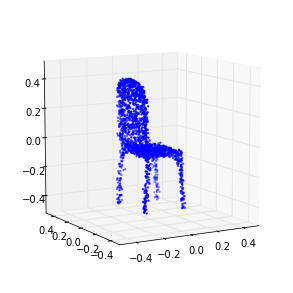

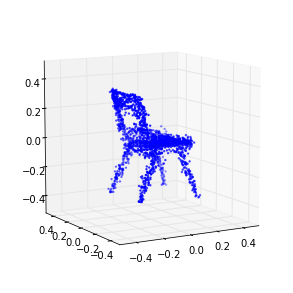

1411 (-0.1555219629848445, 0.18517425049234321)
1412 (-0.15516085442569522, 0.18969550949555855)
1413 (-0.15531481112594958, 0.18643824204250617)
1414 (-0.15643335735356367, 0.20036774984112493)
1415 (-0.15796474262520119, 0.2004606663076966)
1416 (-0.15258121622933282, 0.17921061096368013)
1417 (-0.15533707572354211, 0.19274151104467888)
1418 (-0.15473403538818711, 0.18370854357878366)
1419 (-0.1585784790692506, 0.19143757279272433)
1420 (-0.156181927577213, 0.18111762625199776)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1420 is not in all_model_checkpoint_paths. Manually adding it.


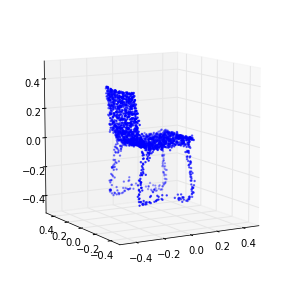

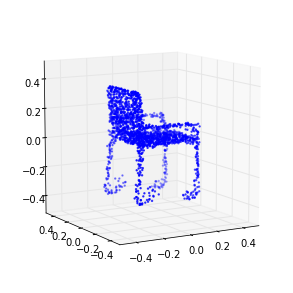

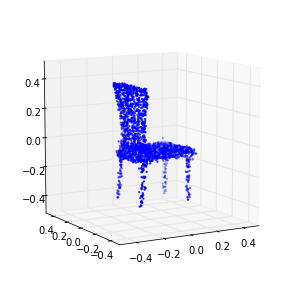

1421 (-0.15690908862484826, 0.19252715839280021)
1422 (-0.15645529671951577, 0.19008230279993127)
1423 (-0.15467376433036945, 0.19156098917678552)
1424 (-0.15601481993993124, 0.18881453021808906)
1425 (-0.15643408276416637, 0.19490655649591376)
1426 (-0.15586973417688299, 0.19788445421942957)
1427 (-0.15750391168726816, 0.18391898550369121)
1428 (-0.15385080299995563, 0.18221358899716977)
1429 (-0.15777225803445888, 0.18853566657613824)
1430 (-0.15561430928883729, 0.18697860119519411)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1430 is not in all_model_checkpoint_paths. Manually adding it.


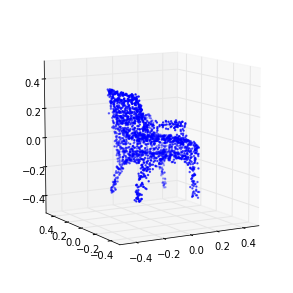

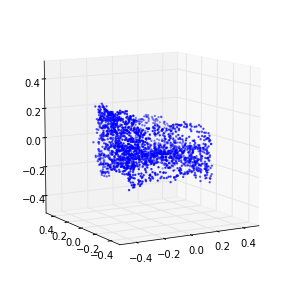

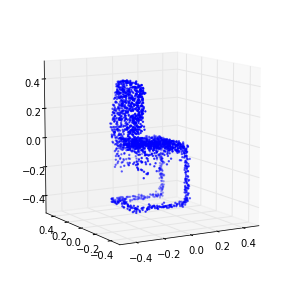

1431 (-0.15628622566108349, 0.17620179001931791)
1432 (-0.15642071658814394, 0.18582543730735779)
1433 (-0.15546540204021667, 0.18245168195830452)
1434 (-0.1550878416608881, 0.18673704178244979)
1435 (-0.1554672267149996, 0.18969898808885505)
1436 (-0.15858968082401487, 0.20291634621443572)
1437 (-0.15443181390011751, 0.20389495072541414)
1438 (-0.1560497948416957, 0.19888404618810723)
1439 (-0.15696036059547352, 0.19884525680983509)
1440 (-0.15625040514601601, 0.19797849213635479)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1440 is not in all_model_checkpoint_paths. Manually adding it.


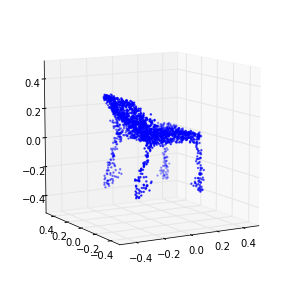

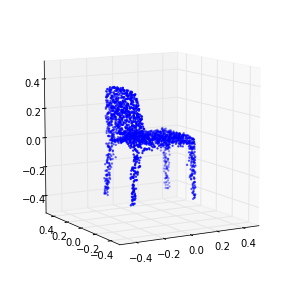

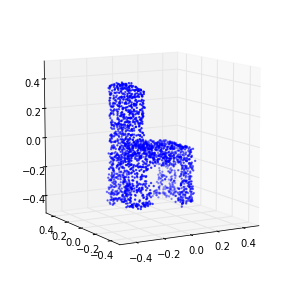

1441 (-0.15707131988472409, 0.17664087922484786)
1442 (-0.15663134499832435, 0.19337049623330435)
1443 (-0.15534009039402008, 0.19623525937398276)
1444 (-0.15772783717623465, 0.18284280984490006)
1445 (-0.15325791107283698, 0.19299806323316362)
1446 (-0.15611090339996198, 0.19464558804476703)
1447 (-0.15726472012422704, 0.19370901915762159)
1448 (-0.15523085489317223, 0.18816216069239158)
1449 (-0.15564295368062125, 0.18936334605570193)
1450 (-0.15745388810281399, 0.19401677780681187)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1450 is not in all_model_checkpoint_paths. Manually adding it.


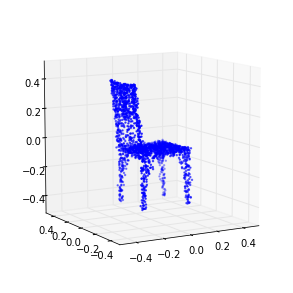

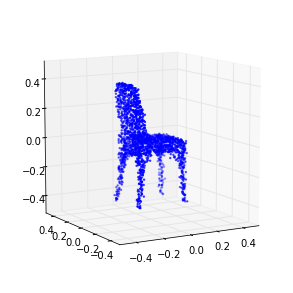

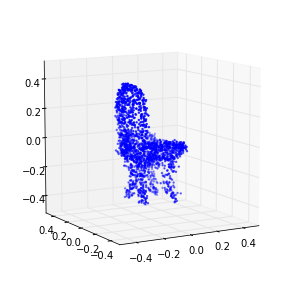

1451 (-0.15811222769595959, 0.19466121163633135)
1452 (-0.15954292968467429, 0.18814900186326769)
1453 (-0.15551979734941765, 0.19376544985506269)
1454 (-0.15867627362410228, 0.18426778581407335)
1455 (-0.15778844003324155, 0.18933164300741973)
1456 (-0.15723604692353144, 0.19514331276769992)
1457 (-0.15614757471614413, 0.19373452221905743)
1458 (-0.15888984126073344, 0.1932164596186744)
1459 (-0.15363123985352339, 0.18491103031017161)
1460 (-0.15432241939836078, 0.18847766132266433)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1460 is not in all_model_checkpoint_paths. Manually adding it.


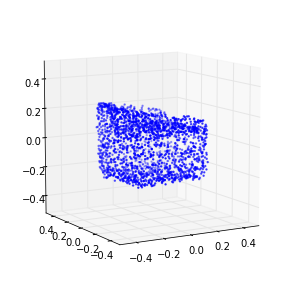

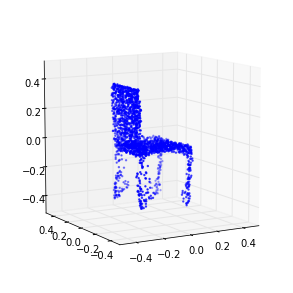

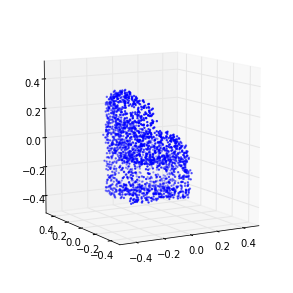

1461 (-0.15702582332823012, 0.19655550685193804)
1462 (-0.15476978884802925, 0.19614027054221542)
1463 (-0.15583802246385151, 0.19626953866746691)
1464 (-0.15857987243820121, 0.19145532283518049)
1465 (-0.15709583588220455, 0.18861143070238609)
1466 (-0.15489708692939194, 0.18007450468010372)
1467 (-0.15842434167861938, 0.20208877490626442)
1468 (-0.15467701708828963, 0.19197473481849389)
1469 (-0.15593127431692899, 0.18950440982977548)
1470 (-0.15261247676831705, 0.19278393906575661)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1470 is not in all_model_checkpoint_paths. Manually adding it.


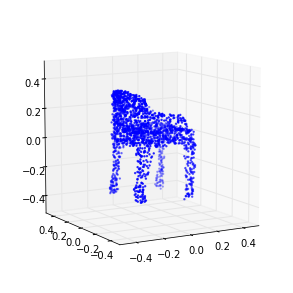

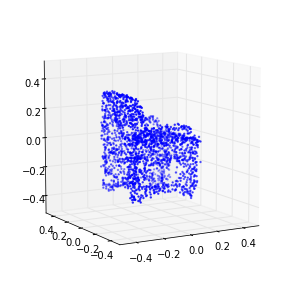

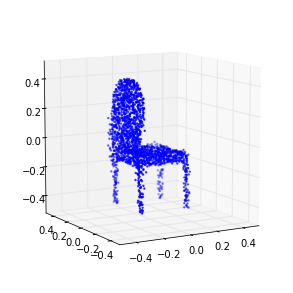

1471 (-0.15608464473927464, 0.17867852968198281)
1472 (-0.1566251822091915, 0.19434724582566154)
1473 (-0.15643509731248573, 0.18708429899480608)
1474 (-0.15874585156087523, 0.19009742968612248)
1475 (-0.15756556104730676, 0.18133701991151879)
1476 (-0.15745785208763899, 0.19413280155923632)
1477 (-0.15642090610883855, 0.18804399062086036)
1478 (-0.15657695277973457, 0.19606954852739969)
1479 (-0.15722987138562733, 0.19140897580870875)
1480 (-0.15920876137636325, 0.20078833401203156)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1480 is not in all_model_checkpoint_paths. Manually adding it.


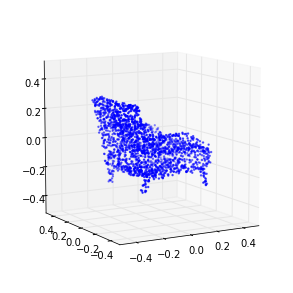

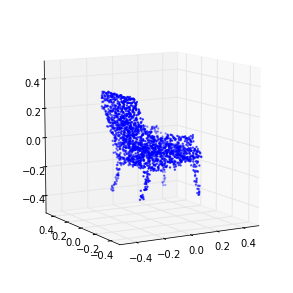

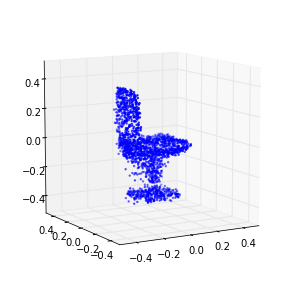

1481 (-0.15603139991009676, 0.19283394625893346)
1482 (-0.15573547449376848, 0.19038437969154781)
1483 (-0.15347492424426257, 0.2076153126027849)
1484 (-0.15386887474192512, 0.18734572386300122)
1485 (-0.15684212705603354, 0.18626192101725825)
1486 (-0.15782727240412323, 0.20391827435405166)
1487 (-0.15663500003240727, 0.17942201263374752)
1488 (-0.1558879010103367, 0.20094436186331291)
1489 (-0.15789919330014124, 0.18933811838980075)
1490 (-0.15564044421469725, 0.18894725210136837)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1490 is not in all_model_checkpoint_paths. Manually adding it.


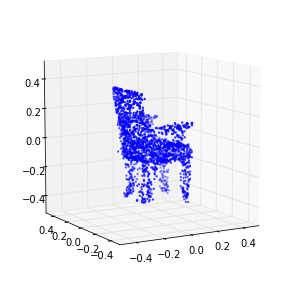

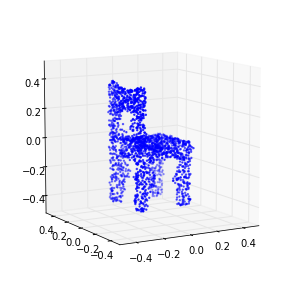

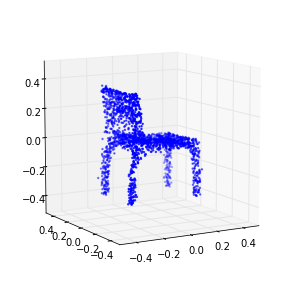

1491 (-0.15787115157754333, 0.19884595992388548)
1492 (-0.15876197505880285, 0.18489275762328394)
1493 (-0.1575150857921, 0.18214143923035375)
1494 (-0.1558501230897727, 0.18852975964546204)
1495 (-0.15695313700923214, 0.19092285522708186)
1496 (-0.15586520654183847, 0.1861444099081887)
1497 (-0.1588216832390538, 0.18737926637684857)
1498 (-0.15789083120999514, 0.1938341431043766)
1499 (-0.154161654136799, 0.1873285389608807)
1500 (-0.15645789702733356, 0.18145214683479732)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_11_emd_chair_2048_best_epoch/models.ckpt-1500 is not in all_model_checkpoint_paths. Manually adding it.


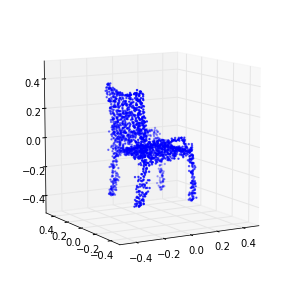

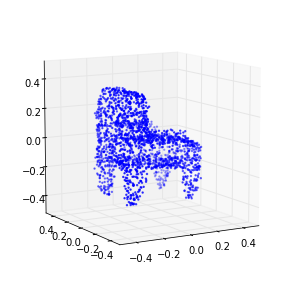

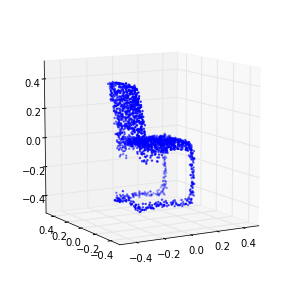

In [10]:
save_dir = osp.join(synthetic_data_out_dir, experiment_name)
save_dir = create_dir(save_dir)

buf_size = 1 # flush each line
if do_training:    
    train_stats = []
    log_file = open(osp.join(train_dir, 'train_stats.txt'), 'a', buf_size)
    for _ in range(max_epochs):        
        loss, duration = gan._single_epoch_train(training_data, batch_size, noise_params)
        epoch = int(gan.sess.run(gan.epoch.assign_add(tf.constant(1.0))))
        print epoch, loss                
        log_file.write('%04d\t%.9f\t%.9f\t%.4f\n' % (epoch, loss[0], loss[1], duration / 60.0))        

        if save_model and (epoch % saver_step == 0 or epoch <= 5):
            checkpoint_path = osp.join(train_dir, model_saver_id)
            gan.saver.save(gan.sess, checkpoint_path, global_step=gan.epoch)
            syn_latent_data = gan.generate(n_syn_samples, noise_params)
            syn_data = ae.decode(syn_latent_data)
            np.savez(osp.join(save_dir, 'epoch_' + str(epoch)), syn_data)
            for k in range(3):
                Point_Cloud(syn_data[k]).plot(in_u_sphere=True)
                        
        train_stats.append((epoch,) + loss)
    log_file.close()

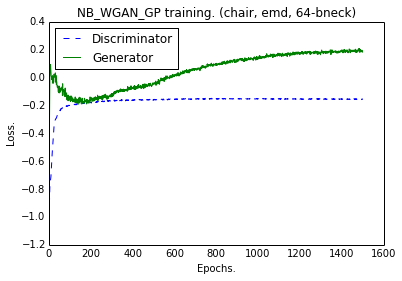

In [11]:
if do_plotting:
    x = range(len(train_stats))
    d_loss = [t[1] for t in train_stats]
    g_loss = [t[2] for t in train_stats]
    plt.plot(x, d_loss, '--')
    plt.plot(x, g_loss)
    plt.title('NB_WGAN_GP training. (%s, %s, %s-bneck)' %(class_name, ae_loss, ae.bottleneck_size))
    plt.legend(['Discriminator', 'Generator'], loc=0)
    
    plt.tick_params(axis='x', which='both', bottom='off', top='off')
    plt.tick_params(axis='y', which='both', left='off', right='off')
    0000
    plt.xlabel('Epochs.') 
    plt.ylabel('Loss.')
    
    plt.savefig(osp.join(train_dir, 'training_curve.png'))